<a href="https://colab.research.google.com/github/HYFRAK/SuperResolution/blob/main/SRResNet_Final_(Not_retrained).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TRAIN

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import requests
import tensorflow_datasets as tfds
import tqdm
import os
import shutil
import re
import cv2
import time
import logging

In [ ]:
class TqdmLoggingHandler(logging.Handler):
    def __init__(self, level=logging.NOTSET):
        super().__init__(level)

    def emit(self, record):
        try:
            msg = self.format(record)
            tqdm.tqdm.write(msg)
            self.flush()
        except (KeyboardInterrupt, SystemExit):
            raise
        except:
            self.handleError(record)  
log = logging.getLogger(__name__)
log.setLevel(logging.INFO)
log.addHandler(TqdmLoggingHandler())

In [ ]:
data=tfds.load('tf_flowers')

local data directory. If you'd instead prefer to read directly from our public
GCS bucket (recommended if you're running on GCP), you can instead pass
`try_gcs=True` to `tfds.load` or set `data_dir=gs://tfds-data/datasets`.



Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]


Dataset tf_flowers downloaded and prepared to /root/tensorflow_datasets/tf_flowers/3.0.1. Subsequent calls will reuse this data.


In [ ]:
train_data=data['train'].skip(600)
test_data=data['train'].take(600)

In [ ]:
tqdm.tqdm(train_data)

  0%|          | 0/3070 [00:00<?, ?it/s]

In [ ]:
@tf.function
def build_data(data):
  cropped=tf.dtypes.cast(tf.image.random_crop(data['image'] / 255,(128,128,3)),tf.float32)

  lr=tf.image.resize(cropped,(32,32))
  #lr=tf.image.resize(lr,(128,128),method=tf.image.ResizeMethod.BICUBIC)
  return (lr,cropped)

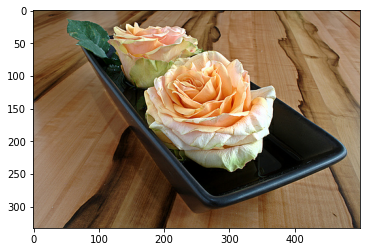

In [ ]:
for x in train_data.take(1):
  plt.imshow(x['image'])
  plt.show()

In [ ]:
def bicubic_interpolate(image,shape):
  img_resized=cv2.resize(image,shape, interpolation=cv2.INTER_CUBIC)
  return img_resized

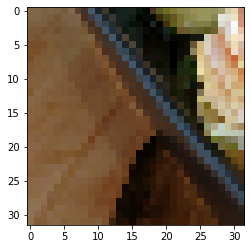

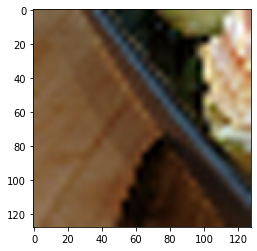

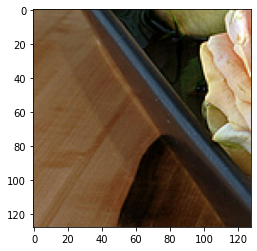

In [ ]:
train_dataset_mapped = train_data.map(build_data,num_parallel_calls=tf.data.AUTOTUNE)
for x in train_dataset_mapped.take(1):
  plt.imshow(x[0].numpy())
  plt.show()

  plt.imshow(bicubic_interpolate(x[0].numpy(),(128,128)))
  plt.show()
  plt.imshow(x[1].numpy())
  plt.show()

In [ ]:
def residual_block_gen(ch=64,k_s=3,st=1):
  model=tf.keras.Sequential([
    tf.keras.layers.Conv2D(ch,k_s,strides=(st,st),padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(),
    tf.keras.layers.Conv2D(ch,k_s,strides=(st,st),padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(),
  ])
  return model

def Upsample_block(x, ch=256, k_s=3, st=1):
    x = tf.keras.layers.Conv2D(ch,k_s, strides=(st,st), padding='same')(x)
    x = tf.nn.depth_to_space(x, 2) # Subpixel pixelshuffler
    x = tf.keras.layers.LeakyReLU()(x)
    return x

input_lr=tf.keras.layers.Input(shape=(32,32,3))
input_conv=tf.keras.layers.Conv2D(64,9,padding='same')(input_lr)
input_conv=tf.keras.layers.LeakyReLU()(input_conv)

SRRes=input_conv
for x in range(5):
  res_output=residual_block_gen()(SRRes)
  SRRes=tf.keras.layers.Add()([SRRes,res_output])

SRRes=tf.keras.layers.Conv2D(64,9,padding='same')(SRRes)
SRRes=tf.keras.layers.BatchNormalization()(SRRes)

SRRes=tf.keras.layers.Add()([SRRes,input_conv])

SRRes=Upsample_block(SRRes)
SRRes=Upsample_block(SRRes)

output_sr=tf.keras.layers.Conv2D(3,9,activation='tanh',padding='same')(SRRes)

SRResnet=tf.keras.models.Model(input_lr,output_sr)

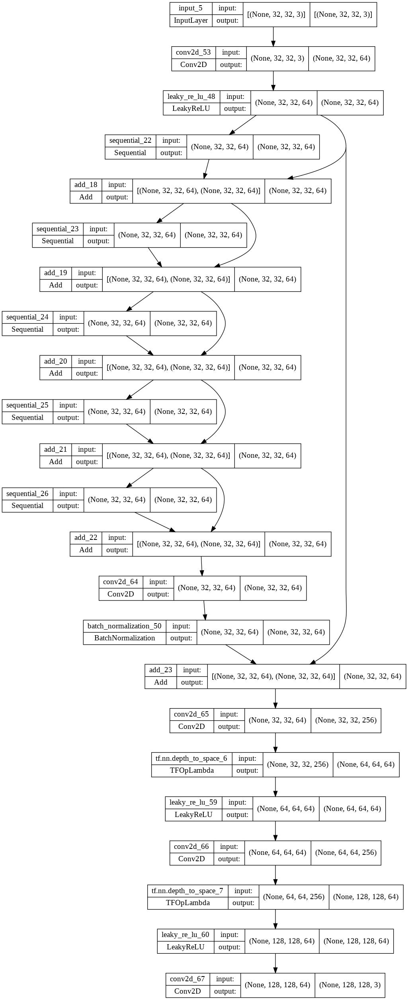

In [ ]:
tf.keras.utils.plot_model(SRResnet,show_shapes=True)

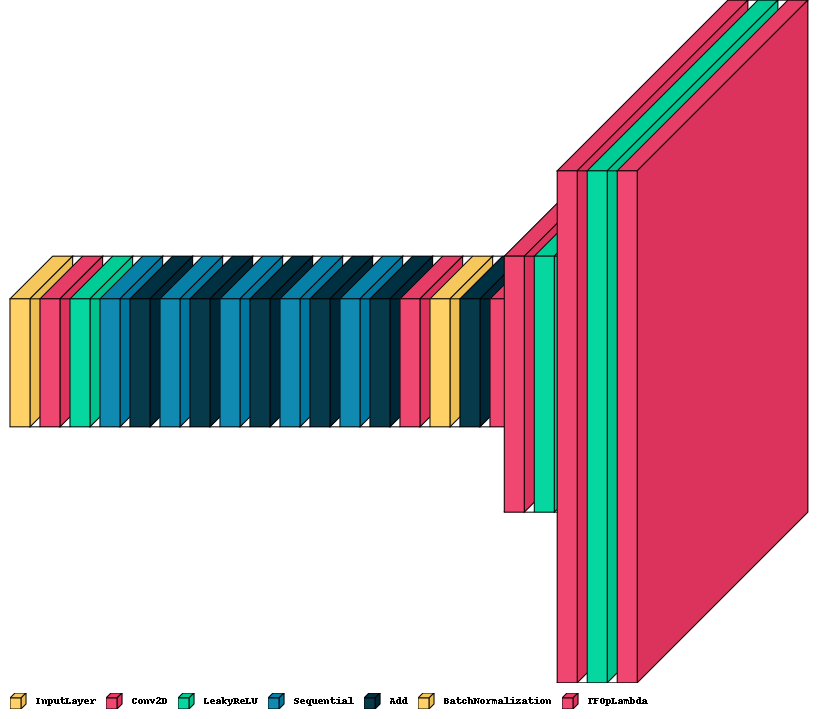

In [ ]:
!pip install visualkeras
import visualkeras
visualkeras.layered_view(SRResnet, to_file='SR-Generator.png', legend=True)

In [ ]:
def residual_block_disc(ch=64,k_s=3,st=1):
  model=tf.keras.Sequential([
    tf.keras.layers.Conv2D(ch,k_s,strides=(st,st),padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(),
  ])
  return model

input_lr=tf.keras.layers.Input(shape=(128,128,3))
input_conv=tf.keras.layers.Conv2D(64,3,padding='same')(input_lr)
input_conv=tf.keras.layers.LeakyReLU()(input_conv)

channel_nums=[64,128,128,256,256,512,512]
stride_sizes=[2,1,2,1,2,1,2]

disc=input_conv
for x in range(7):
  disc=residual_block_disc(ch=channel_nums[x],st=stride_sizes[x])(disc)
  
disc=tf.keras.layers.Flatten()(disc)

disc=tf.keras.layers.Dense(1024)(disc)
disc=tf.keras.layers.LeakyReLU()(disc)

disc_output=tf.keras.layers.Dense(1,activation='sigmoid')(disc)

discriminator=tf.keras.models.Model(input_lr,disc_output)

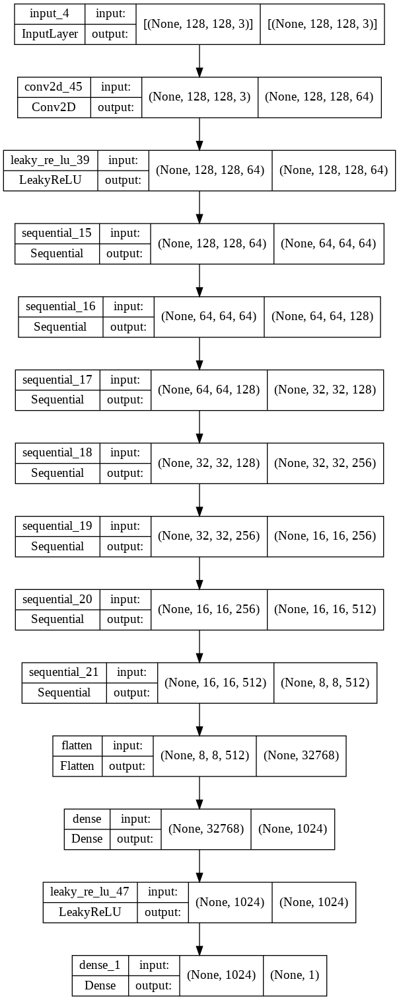

In [ ]:
tf.keras.utils.plot_model(discriminator,show_shapes=True,)#rankdir='LR')

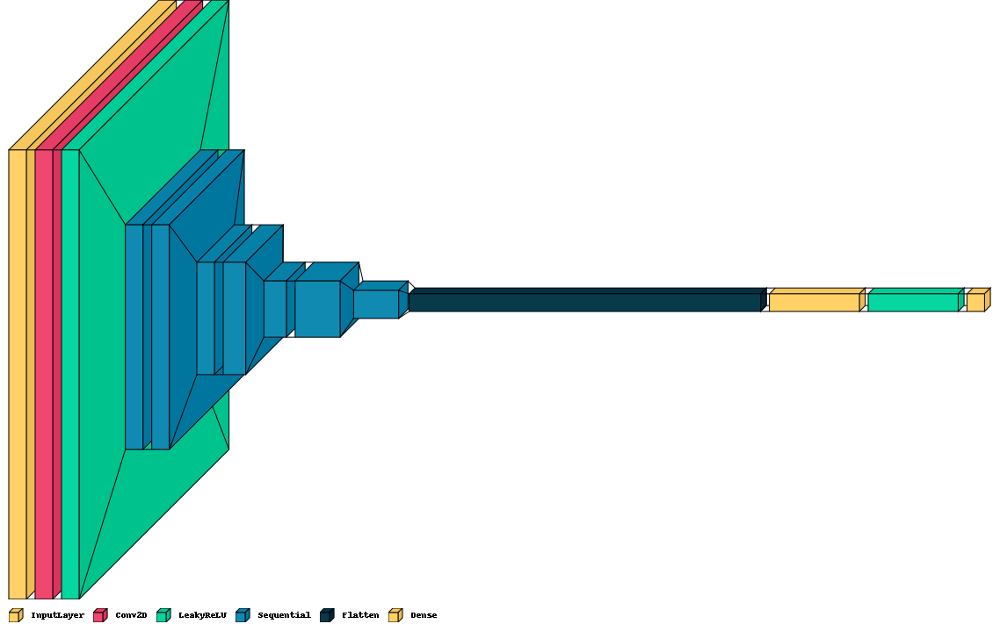

In [ ]:
visualkeras.layered_view(discriminator, to_file='SR_Discriminator.png', legend=True)

In [ ]:
def PSNR(y_true,y_pred):
  mse=tf.reduce_mean( (y_true - y_pred) ** 2 )
  return 20 * log10(1 / (mse ** 0.5))

def log10(x):
  numerator = tf.math.log(x)
  denominator = tf.math.log(tf.constant(10, dtype=numerator.dtype))
  return numerator / denominator

def pixel_MSE(y_true,y_pred):
  return tf.reduce_mean( (y_true - y_pred) ** 2 )

In [ ]:
VGG19=tf.keras.applications.VGG19(weights='imagenet',include_top=False,input_shape=(128,128,3))
VGG19.layers

80150528/80134624 [==============================] - 0s 0us/step


In [ ]:
VGG19=tf.keras.applications.VGG19(weights='imagenet',include_top=False,input_shape=(128,128,3))

VGG_i,VGG_j=2,2
def VGG_loss(y_hr,y_sr,i_m=2,j_m=2):
  i,j=0,0
  accumulated_loss=0.0
  for l in VGG19.layers:
    cl_name=l.__class__.__name__
    if cl_name=='Conv2D':
      j+=1
    if cl_name=='MaxPooling2D':
      i+=1
      j=0
    if i==i_m and j==j_m:
      break
    
    y_hr=l(y_hr)
    y_sr=l(y_sr)
    if cl_name=='Conv2D':
      accumulated_loss+=tf.reduce_mean((y_hr-y_sr)**2) * 0.006

  return accumulated_loss
def VGG_loss_intuitive(y_true,y_pred):
  accumulated_loss=0.0
  for l in VGG19.layers:
    y_true=l(y_true)
    y_pred=l(y_pred)
    accumulated_loss+=tf.reduce_mean((y_true-y_pred)**2) * 0.006
  return accumulated_loss

In [ ]:
generator_optimizer=tf.keras.optimizers.SGD(0.0001)
discriminator_optimizer=tf.keras.optimizers.SGD(0.0001)

adv_ratio=0.001
evaluate=['PSNR']
# MSE
loss_func,adv_learning = pixel_MSE,False
# VGG2.2
loss_func,adv_learning = lambda y_hr,y_sr:VGG_loss(y_hr,y_sr,i_m=2,j_m=2),False
# VGG 5.4
loss_func,adv_learning = lambda y_hr,y_sr:VGG_loss(y_hr,y_sr,i_m=5,j_m=4),False
# SRGAN-MSE
loss_func,adv_learning = pixel_MSE,True
# SRGAN-VGG 2.2
loss_func,adv_learning = lambda y_hr,y_sr:VGG_loss(y_hr,y_sr,i_m=2,j_m=2),True
# SRGAN-VGG 5.4
loss_func,adv_learning = lambda y_hr,y_sr:VGG_loss(y_hr,y_sr,i_m=5,j_m=4),True

#Real loss
loss_func,adv_learning = lambda y_hr,y_sr:VGG_loss(y_hr,y_sr,i_m=5,j_m=4),True

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy()
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

@tf.function()
def train_step(data,loss_func=pixel_MSE,adv_learning=True,evaluate=['PSNR'],adv_ratio=0.001):
  logs={}
  gen_loss,disc_loss=0,0

  low_resolution,high_resolution=data
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    super_resolution = SRResnet(low_resolution, training=True)
    gen_loss=loss_func(high_resolution,super_resolution)

    logs['reconstruction']=gen_loss

    if adv_learning:
      real_output = discriminator(high_resolution, training=True)
      fake_output = discriminator(super_resolution, training=True)
      
      adv_loss_g = generator_loss(fake_output) * adv_ratio
      gen_loss += adv_loss_g

      disc_loss = discriminator_loss(real_output, fake_output)
      
      logs['adv_g']=adv_loss_g
      logs['adv_d']=disc_loss

  gradients_of_generator = gen_tape.gradient(gen_loss, SRResnet.trainable_variables)
  generator_optimizer.apply_gradients(zip(gradients_of_generator, SRResnet.trainable_variables))

  if adv_learning:
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
  for x in evaluate:
    if x=='PSNR':
      logs[x]=PSNR(high_resolution,super_resolution)

  return logs

In [ ]:
SRResnet=tf.keras.models.load_model('/content/model (2).h5',compile=False)
discriminator=tf.keras.models.load_model('/content/model (2).h5',compile=False)

In [ ]:
for x in range(50):
  train_dataset_mapped = train_data.map(build_data,num_parallel_calls=tf.data.AUTOTUNE).batch(64)
  val_dataset_mapped = test_data.map(build_data,num_parallel_calls=tf.data.AUTOTUNE).batch(64)
  
  for image_batch in tqdm.tqdm(train_dataset_mapped, position=0, leave=True):
    logs=train_step(image_batch,loss_func,adv_learning,evaluate,adv_ratio)
    for k in logs.keys():
      print(k,':',logs[k],end='  ')
    print()

  2%|▏         | 1/48 [00:28<22:01, 28.11s/it]

reconstruction : tf.Tensor(4.807113, shape=(), dtype=float32)  adv_g : tf.Tensor(0.001085929, shape=(), dtype=float32)  adv_d : tf.Tensor(1.4637959, shape=(), dtype=float32)  PSNR : tf.Tensor(5.397826, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:29<09:21, 12.21s/it]

tf.Tensor(4.909986, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0009554804, shape=(), dtype=float32)  adv_d : tf.Tensor(1.5660708, shape=(), dtype=float32)  PSNR : tf.Tensor(5.330875, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:30<05:20,  7.12s/it]

tf.Tensor(5.038839, shape=(), dtype=float32)  adv_g : tf.Tensor(0.001024846, shape=(), dtype=float32)  adv_d : tf.Tensor(1.4667284, shape=(), dtype=float32)  PSNR : tf.Tensor(5.114939, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:31<03:28,  4.74s/it]

tf.Tensor(5.0549254, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0010901856, shape=(), dtype=float32)  adv_d : tf.Tensor(1.3500545, shape=(), dtype=float32)  PSNR : tf.Tensor(5.139013, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:32<02:27,  3.42s/it]

tf.Tensor(5.1044536, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0009984685, shape=(), dtype=float32)  adv_d : tf.Tensor(1.4914759, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9842224, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:33<01:50,  2.63s/it]

tf.Tensor(4.7846956, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0011640907, shape=(), dtype=float32)  adv_d : tf.Tensor(1.2817659, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3400497, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:34<01:26,  2.12s/it]

tf.Tensor(5.0297785, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0010981199, shape=(), dtype=float32)  adv_d : tf.Tensor(1.1906073, shape=(), dtype=float32)  PSNR : tf.Tensor(4.7012577, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:35<01:11,  1.79s/it]

tf.Tensor(4.9110827, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0012029131, shape=(), dtype=float32)  adv_d : tf.Tensor(1.0490108, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2658353, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:36<01:01,  1.57s/it]

tf.Tensor(4.8724375, shape=(), dtype=float32)  adv_g : tf.Tensor(0.001400353, shape=(), dtype=float32)  adv_d : tf.Tensor(1.0894557, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3082457, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:37<00:53,  1.42s/it]

tf.Tensor(4.8238854, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0011655797, shape=(), dtype=float32)  adv_d : tf.Tensor(1.2341006, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3416095, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:38<00:48,  1.32s/it]

tf.Tensor(4.7811966, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0012647307, shape=(), dtype=float32)  adv_d : tf.Tensor(1.0855547, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2751403, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:40<00:44,  1.25s/it]

tf.Tensor(4.8651547, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0013093441, shape=(), dtype=float32)  adv_d : tf.Tensor(1.0618958, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9416733, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:41<00:41,  1.20s/it]

tf.Tensor(4.6087856, shape=(), dtype=float32)  adv_g : tf.Tensor(0.001250435, shape=(), dtype=float32)  adv_d : tf.Tensor(1.0950263, shape=(), dtype=float32)  PSNR : tf.Tensor(4.7379313, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:42<00:39,  1.17s/it]

tf.Tensor(4.9982195, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0012496699, shape=(), dtype=float32)  adv_d : tf.Tensor(1.0632658, shape=(), dtype=float32)  PSNR : tf.Tensor(5.243818, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:43<00:37,  1.14s/it]

tf.Tensor(4.7789283, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0013381597, shape=(), dtype=float32)  adv_d : tf.Tensor(0.9656474, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0696263, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:44<00:36,  1.13s/it]

tf.Tensor(4.7768793, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0013471363, shape=(), dtype=float32)  adv_d : tf.Tensor(0.8899517, shape=(), dtype=float32)  PSNR : tf.Tensor(5.083487, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:45<00:34,  1.11s/it]

tf.Tensor(4.732336, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0014679898, shape=(), dtype=float32)  adv_d : tf.Tensor(0.85586894, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9839525, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:46<00:33,  1.11s/it]

tf.Tensor(4.839375, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0013648244, shape=(), dtype=float32)  adv_d : tf.Tensor(0.9269007, shape=(), dtype=float32)  PSNR : tf.Tensor(5.272855, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:47<00:31,  1.10s/it]

tf.Tensor(4.622272, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0015013546, shape=(), dtype=float32)  adv_d : tf.Tensor(0.88893145, shape=(), dtype=float32)  PSNR : tf.Tensor(5.140374, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:48<00:30,  1.09s/it]

tf.Tensor(4.731629, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0016303723, shape=(), dtype=float32)  adv_d : tf.Tensor(0.80217767, shape=(), dtype=float32)  PSNR : tf.Tensor(4.930792, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:49<00:29,  1.10s/it]

tf.Tensor(4.5851107, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0015099898, shape=(), dtype=float32)  adv_d : tf.Tensor(0.930896, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3693576, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:50<00:28,  1.10s/it]

tf.Tensor(4.883259, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0013607052, shape=(), dtype=float32)  adv_d : tf.Tensor(0.9252157, shape=(), dtype=float32)  PSNR : tf.Tensor(5.135047, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:51<00:27,  1.09s/it]

tf.Tensor(4.4661937, shape=(), dtype=float32)  adv_g : tf.Tensor(0.001395726, shape=(), dtype=float32)  adv_d : tf.Tensor(0.8664349, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2248745, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:53<00:26,  1.09s/it]

tf.Tensor(4.5181384, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0016141877, shape=(), dtype=float32)  adv_d : tf.Tensor(0.8361807, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3016415, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:54<00:25,  1.09s/it]

tf.Tensor(4.604371, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0016638353, shape=(), dtype=float32)  adv_d : tf.Tensor(0.7146146, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9212856, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:55<00:23,  1.09s/it]

tf.Tensor(4.5515676, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0015264658, shape=(), dtype=float32)  adv_d : tf.Tensor(0.8046849, shape=(), dtype=float32)  PSNR : tf.Tensor(5.372928, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:56<00:22,  1.09s/it]

tf.Tensor(4.4648366, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0016844696, shape=(), dtype=float32)  adv_d : tf.Tensor(0.6799713, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4728174, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:57<00:21,  1.09s/it]

tf.Tensor(4.36781, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0016943556, shape=(), dtype=float32)  adv_d : tf.Tensor(0.62396395, shape=(), dtype=float32)  PSNR : tf.Tensor(4.950818, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:58<00:20,  1.09s/it]

tf.Tensor(4.831287, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0015581711, shape=(), dtype=float32)  adv_d : tf.Tensor(0.7182559, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2982025, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:59<00:19,  1.09s/it]

tf.Tensor(4.6562395, shape=(), dtype=float32)  adv_g : tf.Tensor(0.001693797, shape=(), dtype=float32)  adv_d : tf.Tensor(0.6096462, shape=(), dtype=float32)  PSNR : tf.Tensor(5.116129, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [01:00<00:18,  1.09s/it]

tf.Tensor(4.4882474, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0017001241, shape=(), dtype=float32)  adv_d : tf.Tensor(0.6599249, shape=(), dtype=float32)  PSNR : tf.Tensor(4.6673737, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [01:01<00:17,  1.10s/it]

tf.Tensor(4.682271, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0017494108, shape=(), dtype=float32)  adv_d : tf.Tensor(0.6051155, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8572125, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [01:02<00:16,  1.10s/it]

tf.Tensor(4.7873383, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0018111707, shape=(), dtype=float32)  adv_d : tf.Tensor(0.5888653, shape=(), dtype=float32)  PSNR : tf.Tensor(4.792737, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [01:04<00:15,  1.10s/it]

tf.Tensor(4.5310483, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0017169697, shape=(), dtype=float32)  adv_d : tf.Tensor(0.5756097, shape=(), dtype=float32)  PSNR : tf.Tensor(5.325012, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [01:05<00:14,  1.10s/it]

tf.Tensor(4.55501, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0015405471, shape=(), dtype=float32)  adv_d : tf.Tensor(0.69903946, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6806436, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [01:06<00:13,  1.10s/it]

tf.Tensor(4.7174306, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0017892446, shape=(), dtype=float32)  adv_d : tf.Tensor(0.57510245, shape=(), dtype=float32)  PSNR : tf.Tensor(5.235002, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [01:07<00:12,  1.10s/it]

tf.Tensor(4.1709356, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0018643772, shape=(), dtype=float32)  adv_d : tf.Tensor(0.562866, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3717947, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [01:08<00:10,  1.10s/it]

tf.Tensor(4.394714, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0016887398, shape=(), dtype=float32)  adv_d : tf.Tensor(0.6292908, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2901793, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [01:09<00:09,  1.10s/it]

tf.Tensor(4.4428906, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0018184646, shape=(), dtype=float32)  adv_d : tf.Tensor(0.576889, shape=(), dtype=float32)  PSNR : tf.Tensor(5.17835, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [01:10<00:08,  1.10s/it]

tf.Tensor(4.5707955, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0018565055, shape=(), dtype=float32)  adv_d : tf.Tensor(0.53004223, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2237463, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [01:11<00:07,  1.11s/it]

tf.Tensor(4.370278, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0019065391, shape=(), dtype=float32)  adv_d : tf.Tensor(0.5742883, shape=(), dtype=float32)  PSNR : tf.Tensor(5.253684, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [01:12<00:06,  1.10s/it]

tf.Tensor(4.7283244, shape=(), dtype=float32)  adv_g : tf.Tensor(0.001978563, shape=(), dtype=float32)  adv_d : tf.Tensor(0.465649, shape=(), dtype=float32)  PSNR : tf.Tensor(4.6862197, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [01:13<00:05,  1.10s/it]

tf.Tensor(4.610586, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002006093, shape=(), dtype=float32)  adv_d : tf.Tensor(0.52312404, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1651964, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [01:15<00:04,  1.10s/it]

tf.Tensor(4.7004137, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0019656864, shape=(), dtype=float32)  adv_d : tf.Tensor(0.47189686, shape=(), dtype=float32)  PSNR : tf.Tensor(5.088311, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [01:16<00:03,  1.10s/it]

tf.Tensor(4.306005, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0021234683, shape=(), dtype=float32)  adv_d : tf.Tensor(0.4336428, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9981365, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [01:17<00:02,  1.10s/it]

tf.Tensor(4.5840774, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0021341357, shape=(), dtype=float32)  adv_d : tf.Tensor(0.42422637, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1669893, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [01:18<00:01,  1.10s/it]

tf.Tensor(4.6498003, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0019760155, shape=(), dtype=float32)  adv_d : tf.Tensor(0.51619, shape=(), dtype=float32)  PSNR : tf.Tensor(5.097646, shape=(), dtype=float32)  


100%|██████████| 48/48 [01:34<00:00,  1.96s/it]


reconstruction : tf.Tensor(4.501506, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0020355734, shape=(), dtype=float32)  adv_d : tf.Tensor(0.4385044, shape=(), dtype=float32)  PSNR : tf.Tensor(5.315006, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:54,  1.17s/it]

tf.Tensor(4.1401467, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002090067, shape=(), dtype=float32)  adv_d : tf.Tensor(0.3923384, shape=(), dtype=float32)  PSNR : tf.Tensor(5.324537, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:52,  1.14s/it]

tf.Tensor(4.373042, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0020039997, shape=(), dtype=float32)  adv_d : tf.Tensor(0.47030717, shape=(), dtype=float32)  PSNR : tf.Tensor(5.662703, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:50,  1.12s/it]

tf.Tensor(4.401634, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0020984847, shape=(), dtype=float32)  adv_d : tf.Tensor(0.42021316, shape=(), dtype=float32)  PSNR : tf.Tensor(5.224253, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:49,  1.12s/it]

tf.Tensor(4.5218678, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002206714, shape=(), dtype=float32)  adv_d : tf.Tensor(0.39479926, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0825343, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:48,  1.12s/it]

tf.Tensor(4.724009, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002070057, shape=(), dtype=float32)  adv_d : tf.Tensor(0.41805404, shape=(), dtype=float32)  PSNR : tf.Tensor(4.83088, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:46,  1.12s/it]

tf.Tensor(4.279679, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0020924746, shape=(), dtype=float32)  adv_d : tf.Tensor(0.42520884, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1672316, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:07<00:45,  1.12s/it]

tf.Tensor(4.667324, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0022997377, shape=(), dtype=float32)  adv_d : tf.Tensor(0.3904888, shape=(), dtype=float32)  PSNR : tf.Tensor(4.755431, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:08<00:44,  1.12s/it]

tf.Tensor(4.4926496, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0022156043, shape=(), dtype=float32)  adv_d : tf.Tensor(0.38705826, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0310483, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:43,  1.12s/it]

tf.Tensor(4.3338866, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00212813, shape=(), dtype=float32)  adv_d : tf.Tensor(0.37889102, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1957006, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:42,  1.12s/it]

tf.Tensor(4.487193, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002027481, shape=(), dtype=float32)  adv_d : tf.Tensor(0.40031654, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3905535, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:41,  1.12s/it]

tf.Tensor(4.360113, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0023454672, shape=(), dtype=float32)  adv_d : tf.Tensor(0.37750334, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1616106, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:40,  1.12s/it]

tf.Tensor(4.4553742, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002214084, shape=(), dtype=float32)  adv_d : tf.Tensor(0.3910209, shape=(), dtype=float32)  PSNR : tf.Tensor(5.296832, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:39,  1.12s/it]

tf.Tensor(4.1835656, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0024089194, shape=(), dtype=float32)  adv_d : tf.Tensor(0.28652257, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8870087, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:15<00:38,  1.12s/it]

tf.Tensor(4.6149616, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0022697125, shape=(), dtype=float32)  adv_d : tf.Tensor(0.32614723, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0363345, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:16<00:37,  1.12s/it]

tf.Tensor(4.3438253, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0024067604, shape=(), dtype=float32)  adv_d : tf.Tensor(0.3277564, shape=(), dtype=float32)  PSNR : tf.Tensor(4.997521, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:17<00:35,  1.12s/it]

tf.Tensor(4.3029346, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0025287182, shape=(), dtype=float32)  adv_d : tf.Tensor(0.29886752, shape=(), dtype=float32)  PSNR : tf.Tensor(5.005868, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:34,  1.12s/it]

tf.Tensor(4.254166, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0022675788, shape=(), dtype=float32)  adv_d : tf.Tensor(0.3533329, shape=(), dtype=float32)  PSNR : tf.Tensor(5.315779, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:33,  1.12s/it]

tf.Tensor(4.3042, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002345987, shape=(), dtype=float32)  adv_d : tf.Tensor(0.32456806, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4306536, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:32,  1.12s/it]

tf.Tensor(4.1324015, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0023293602, shape=(), dtype=float32)  adv_d : tf.Tensor(0.36188883, shape=(), dtype=float32)  PSNR : tf.Tensor(5.282643, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:22<00:31,  1.12s/it]

tf.Tensor(4.4307446, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0021981222, shape=(), dtype=float32)  adv_d : tf.Tensor(0.37329903, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8064957, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:23<00:30,  1.13s/it]

tf.Tensor(4.1446204, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0021454878, shape=(), dtype=float32)  adv_d : tf.Tensor(0.3459754, shape=(), dtype=float32)  PSNR : tf.Tensor(5.578553, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:24<00:29,  1.13s/it]

tf.Tensor(4.5589557, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002313076, shape=(), dtype=float32)  adv_d : tf.Tensor(0.35538048, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2622643, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:25<00:28,  1.13s/it]

tf.Tensor(4.0977902, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002260468, shape=(), dtype=float32)  adv_d : tf.Tensor(0.32922035, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2339883, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:26<00:27,  1.13s/it]

tf.Tensor(4.2416368, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00239914, shape=(), dtype=float32)  adv_d : tf.Tensor(0.33118746, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8793263, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:25,  1.13s/it]

tf.Tensor(4.2806783, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0023438148, shape=(), dtype=float32)  adv_d : tf.Tensor(0.3330329, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8852777, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:29<00:24,  1.13s/it]

tf.Tensor(4.3681, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0025287643, shape=(), dtype=float32)  adv_d : tf.Tensor(0.2699464, shape=(), dtype=float32)  PSNR : tf.Tensor(5.513356, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:30<00:23,  1.13s/it]

tf.Tensor(4.2280664, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0023311246, shape=(), dtype=float32)  adv_d : tf.Tensor(0.30102307, shape=(), dtype=float32)  PSNR : tf.Tensor(5.135436, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:31<00:22,  1.13s/it]

tf.Tensor(4.233389, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002572621, shape=(), dtype=float32)  adv_d : tf.Tensor(0.28880322, shape=(), dtype=float32)  PSNR : tf.Tensor(4.718043, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:32<00:21,  1.13s/it]

tf.Tensor(4.5731225, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0023814917, shape=(), dtype=float32)  adv_d : tf.Tensor(0.32515013, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3041143, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:33<00:20,  1.14s/it]

tf.Tensor(4.5141172, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0023460847, shape=(), dtype=float32)  adv_d : tf.Tensor(0.29468322, shape=(), dtype=float32)  PSNR : tf.Tensor(4.969695, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:34<00:19,  1.14s/it]

tf.Tensor(4.2178817, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002744909, shape=(), dtype=float32)  adv_d : tf.Tensor(0.25012302, shape=(), dtype=float32)  PSNR : tf.Tensor(4.702977, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:36<00:18,  1.13s/it]

tf.Tensor(4.2998447, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002532208, shape=(), dtype=float32)  adv_d : tf.Tensor(0.31355244, shape=(), dtype=float32)  PSNR : tf.Tensor(5.19719, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:37<00:17,  1.14s/it]

tf.Tensor(4.6145554, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0025625462, shape=(), dtype=float32)  adv_d : tf.Tensor(0.31613082, shape=(), dtype=float32)  PSNR : tf.Tensor(4.7265997, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:38<00:15,  1.14s/it]

tf.Tensor(4.283041, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0024413038, shape=(), dtype=float32)  adv_d : tf.Tensor(0.29770842, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9862356, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:39<00:14,  1.14s/it]

tf.Tensor(4.315209, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002509011, shape=(), dtype=float32)  adv_d : tf.Tensor(0.2909637, shape=(), dtype=float32)  PSNR : tf.Tensor(5.732318, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:40<00:13,  1.14s/it]

tf.Tensor(4.5318503, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0025417071, shape=(), dtype=float32)  adv_d : tf.Tensor(0.29530975, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8849564, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:41<00:12,  1.14s/it]

tf.Tensor(4.027569, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0025375898, shape=(), dtype=float32)  adv_d : tf.Tensor(0.2883368, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1838202, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:42<00:11,  1.14s/it]

tf.Tensor(4.189204, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0024951214, shape=(), dtype=float32)  adv_d : tf.Tensor(0.28796226, shape=(), dtype=float32)  PSNR : tf.Tensor(5.47349, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:44<00:10,  1.14s/it]

tf.Tensor(4.2862873, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0028038977, shape=(), dtype=float32)  adv_d : tf.Tensor(0.24147074, shape=(), dtype=float32)  PSNR : tf.Tensor(4.7544894, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:45<00:09,  1.14s/it]

tf.Tensor(4.2967544, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002575306, shape=(), dtype=float32)  adv_d : tf.Tensor(0.2383303, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1053963, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:46<00:08,  1.15s/it]

tf.Tensor(4.271856, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0025930316, shape=(), dtype=float32)  adv_d : tf.Tensor(0.21919659, shape=(), dtype=float32)  PSNR : tf.Tensor(4.813056, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:47<00:06,  1.15s/it]

tf.Tensor(4.3248477, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0027833953, shape=(), dtype=float32)  adv_d : tf.Tensor(0.23759753, shape=(), dtype=float32)  PSNR : tf.Tensor(4.719024, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:48<00:05,  1.15s/it]

tf.Tensor(4.42612, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0023867248, shape=(), dtype=float32)  adv_d : tf.Tensor(0.28407696, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1143303, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:49<00:04,  1.15s/it]

tf.Tensor(4.4391646, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002523584, shape=(), dtype=float32)  adv_d : tf.Tensor(0.2565779, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8350124, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:50<00:03,  1.15s/it]

tf.Tensor(4.094942, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002748747, shape=(), dtype=float32)  adv_d : tf.Tensor(0.20262004, shape=(), dtype=float32)  PSNR : tf.Tensor(4.83663, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:52<00:02,  1.15s/it]

tf.Tensor(4.500759, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0024626977, shape=(), dtype=float32)  adv_d : tf.Tensor(0.26240093, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1866975, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:53<00:01,  1.15s/it]

tf.Tensor(4.234798, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0026433254, shape=(), dtype=float32)  adv_d : tf.Tensor(0.2477628, shape=(), dtype=float32)  PSNR : tf.Tensor(5.33287, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:54<00:00,  1.13s/it]


tf.Tensor(4.468592, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002712137, shape=(), dtype=float32)  adv_d : tf.Tensor(0.24857153, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1828036, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:56,  1.21s/it]

tf.Tensor(3.8440654, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0027334844, shape=(), dtype=float32)  adv_d : tf.Tensor(0.20393313, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3902764, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.18s/it]

tf.Tensor(4.252017, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0028081862, shape=(), dtype=float32)  adv_d : tf.Tensor(0.23813188, shape=(), dtype=float32)  PSNR : tf.Tensor(5.167186, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.16s/it]

tf.Tensor(4.180971, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002623604, shape=(), dtype=float32)  adv_d : tf.Tensor(0.2444853, shape=(), dtype=float32)  PSNR : tf.Tensor(5.096073, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.16s/it]

tf.Tensor(4.4297905, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002818958, shape=(), dtype=float32)  adv_d : tf.Tensor(0.22179697, shape=(), dtype=float32)  PSNR : tf.Tensor(4.921726, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.15s/it]

tf.Tensor(4.4424534, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0026967684, shape=(), dtype=float32)  adv_d : tf.Tensor(0.25891232, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8572383, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(4.0677085, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002814136, shape=(), dtype=float32)  adv_d : tf.Tensor(0.2368746, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2860823, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(4.2755365, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0027960758, shape=(), dtype=float32)  adv_d : tf.Tensor(0.20579973, shape=(), dtype=float32)  PSNR : tf.Tensor(4.88715, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.15s/it]

tf.Tensor(4.082282, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0027874897, shape=(), dtype=float32)  adv_d : tf.Tensor(0.22361098, shape=(), dtype=float32)  PSNR : tf.Tensor(5.105905, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(4.193252, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0027571984, shape=(), dtype=float32)  adv_d : tf.Tensor(0.2317826, shape=(), dtype=float32)  PSNR : tf.Tensor(5.356258, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(4.3340335, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0028443974, shape=(), dtype=float32)  adv_d : tf.Tensor(0.1751301, shape=(), dtype=float32)  PSNR : tf.Tensor(4.981566, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(4.095772, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002927864, shape=(), dtype=float32)  adv_d : tf.Tensor(0.21119845, shape=(), dtype=float32)  PSNR : tf.Tensor(5.171594, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(4.3186946, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0027389799, shape=(), dtype=float32)  adv_d : tf.Tensor(0.24504618, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4416347, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:40,  1.15s/it]

tf.Tensor(4.1148725, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0028334416, shape=(), dtype=float32)  adv_d : tf.Tensor(0.2155211, shape=(), dtype=float32)  PSNR : tf.Tensor(4.599151, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(4.384334, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0027252906, shape=(), dtype=float32)  adv_d : tf.Tensor(0.23579592, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3977504, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.15s/it]

tf.Tensor(4.262751, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0029032377, shape=(), dtype=float32)  adv_d : tf.Tensor(0.18515387, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1168175, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(4.3522077, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002844264, shape=(), dtype=float32)  adv_d : tf.Tensor(0.21012801, shape=(), dtype=float32)  PSNR : tf.Tensor(5.31682, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(4.204322, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0027290918, shape=(), dtype=float32)  adv_d : tf.Tensor(0.23693821, shape=(), dtype=float32)  PSNR : tf.Tensor(5.054881, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(4.3452077, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0028170678, shape=(), dtype=float32)  adv_d : tf.Tensor(0.21633786, shape=(), dtype=float32)  PSNR : tf.Tensor(5.115258, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.16s/it]

tf.Tensor(4.0299273, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0031220939, shape=(), dtype=float32)  adv_d : tf.Tensor(0.1748487, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1148, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.15s/it]

tf.Tensor(4.1824636, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0030001495, shape=(), dtype=float32)  adv_d : tf.Tensor(0.20410892, shape=(), dtype=float32)  PSNR : tf.Tensor(5.054467, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.15s/it]

tf.Tensor(4.2443624, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002912112, shape=(), dtype=float32)  adv_d : tf.Tensor(0.18644524, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1644416, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:29,  1.15s/it]

tf.Tensor(4.479479, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0029578735, shape=(), dtype=float32)  adv_d : tf.Tensor(0.20661184, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9702373, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.15s/it]

tf.Tensor(4.097128, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0029532863, shape=(), dtype=float32)  adv_d : tf.Tensor(0.19029325, shape=(), dtype=float32)  PSNR : tf.Tensor(5.084268, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.15s/it]

tf.Tensor(4.117279, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0029185116, shape=(), dtype=float32)  adv_d : tf.Tensor(0.21072878, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8948674, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.15s/it]

tf.Tensor(4.169468, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0029263527, shape=(), dtype=float32)  adv_d : tf.Tensor(0.19551355, shape=(), dtype=float32)  PSNR : tf.Tensor(5.137151, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:29<00:25,  1.15s/it]

tf.Tensor(4.3247256, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0027731496, shape=(), dtype=float32)  adv_d : tf.Tensor(0.18980485, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3204775, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.15s/it]

tf.Tensor(3.930734, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0029735724, shape=(), dtype=float32)  adv_d : tf.Tensor(0.18563458, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0536733, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:22,  1.15s/it]

tf.Tensor(4.0373945, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003068325, shape=(), dtype=float32)  adv_d : tf.Tensor(0.15253279, shape=(), dtype=float32)  PSNR : tf.Tensor(4.92725, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:21,  1.15s/it]

tf.Tensor(4.4006257, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002706885, shape=(), dtype=float32)  adv_d : tf.Tensor(0.22088495, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1909056, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.15s/it]

tf.Tensor(4.3426366, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0029976864, shape=(), dtype=float32)  adv_d : tf.Tensor(0.20438978, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9674206, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.15s/it]

tf.Tensor(3.8773396, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0031956732, shape=(), dtype=float32)  adv_d : tf.Tensor(0.16314699, shape=(), dtype=float32)  PSNR : tf.Tensor(4.983412, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:36<00:18,  1.15s/it]

tf.Tensor(4.2210608, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0029839582, shape=(), dtype=float32)  adv_d : tf.Tensor(0.16542515, shape=(), dtype=float32)  PSNR : tf.Tensor(5.130367, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:37<00:17,  1.15s/it]

tf.Tensor(4.5359936, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0029346517, shape=(), dtype=float32)  adv_d : tf.Tensor(0.17458376, shape=(), dtype=float32)  PSNR : tf.Tensor(4.6051617, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.15s/it]

tf.Tensor(4.383904, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0029179375, shape=(), dtype=float32)  adv_d : tf.Tensor(0.1925596, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4434114, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:14,  1.15s/it]

tf.Tensor(4.05938, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002896935, shape=(), dtype=float32)  adv_d : tf.Tensor(0.19561177, shape=(), dtype=float32)  PSNR : tf.Tensor(5.606926, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.15s/it]

tf.Tensor(4.2553506, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0031059817, shape=(), dtype=float32)  adv_d : tf.Tensor(0.16015323, shape=(), dtype=float32)  PSNR : tf.Tensor(4.669419, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.15s/it]

tf.Tensor(3.8629165, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0031139439, shape=(), dtype=float32)  adv_d : tf.Tensor(0.173224, shape=(), dtype=float32)  PSNR : tf.Tensor(5.282414, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:43<00:11,  1.15s/it]

tf.Tensor(4.118661, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002817415, shape=(), dtype=float32)  adv_d : tf.Tensor(0.17291915, shape=(), dtype=float32)  PSNR : tf.Tensor(5.32999, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:44<00:10,  1.15s/it]

tf.Tensor(4.2937527, shape=(), dtype=float32)  adv_g : tf.Tensor(0.002913655, shape=(), dtype=float32)  adv_d : tf.Tensor(0.17469469, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1838746, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.15s/it]

tf.Tensor(4.0918026, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0030298678, shape=(), dtype=float32)  adv_d : tf.Tensor(0.15624644, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1425843, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.15s/it]

tf.Tensor(3.88035, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0032632055, shape=(), dtype=float32)  adv_d : tf.Tensor(0.13160256, shape=(), dtype=float32)  PSNR : tf.Tensor(4.820187, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.15s/it]

tf.Tensor(4.067177, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0030829594, shape=(), dtype=float32)  adv_d : tf.Tensor(0.14323324, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9570904, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.15s/it]

tf.Tensor(4.2611775, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0030787895, shape=(), dtype=float32)  adv_d : tf.Tensor(0.1576608, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1317883, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:50<00:04,  1.15s/it]

tf.Tensor(4.316455, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0027816917, shape=(), dtype=float32)  adv_d : tf.Tensor(0.1774146, shape=(), dtype=float32)  PSNR : tf.Tensor(5.161387, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:51<00:03,  1.15s/it]

tf.Tensor(4.107848, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0032528932, shape=(), dtype=float32)  adv_d : tf.Tensor(0.15386978, shape=(), dtype=float32)  PSNR : tf.Tensor(4.7950125, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:52<00:02,  1.15s/it]

tf.Tensor(4.3659973, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0027775085, shape=(), dtype=float32)  adv_d : tf.Tensor(0.18367256, shape=(), dtype=float32)  PSNR : tf.Tensor(5.10585, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.15s/it]

tf.Tensor(4.2690716, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003145418, shape=(), dtype=float32)  adv_d : tf.Tensor(0.13799548, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9413333, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.15s/it]


tf.Tensor(4.2575593, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0031070844, shape=(), dtype=float32)  adv_d : tf.Tensor(0.16152534, shape=(), dtype=float32)  PSNR : tf.Tensor(5.168142, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:57,  1.21s/it]

tf.Tensor(3.9002917, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003314094, shape=(), dtype=float32)  adv_d : tf.Tensor(0.14251633, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0960326, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.18s/it]

tf.Tensor(3.9456203, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0028916714, shape=(), dtype=float32)  adv_d : tf.Tensor(0.17765072, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3668885, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(4.1280537, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003210185, shape=(), dtype=float32)  adv_d : tf.Tensor(0.13647169, shape=(), dtype=float32)  PSNR : tf.Tensor(5.07935, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.16s/it]

tf.Tensor(4.2570157, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0031064434, shape=(), dtype=float32)  adv_d : tf.Tensor(0.16045138, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9553366, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:50,  1.16s/it]

tf.Tensor(4.3529496, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0030529925, shape=(), dtype=float32)  adv_d : tf.Tensor(0.16300038, shape=(), dtype=float32)  PSNR : tf.Tensor(4.917494, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.16s/it]

tf.Tensor(3.818684, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0032010428, shape=(), dtype=float32)  adv_d : tf.Tensor(0.15723345, shape=(), dtype=float32)  PSNR : tf.Tensor(5.26402, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.16s/it]

tf.Tensor(4.2253704, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0032141497, shape=(), dtype=float32)  adv_d : tf.Tensor(0.15835188, shape=(), dtype=float32)  PSNR : tf.Tensor(4.539219, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.16s/it]

tf.Tensor(4.020807, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0030253525, shape=(), dtype=float32)  adv_d : tf.Tensor(0.18341622, shape=(), dtype=float32)  PSNR : tf.Tensor(5.173441, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:45,  1.15s/it]

tf.Tensor(4.109127, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0032525165, shape=(), dtype=float32)  adv_d : tf.Tensor(0.12449896, shape=(), dtype=float32)  PSNR : tf.Tensor(5.229622, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.16s/it]

tf.Tensor(3.943119, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003240698, shape=(), dtype=float32)  adv_d : tf.Tensor(0.13867237, shape=(), dtype=float32)  PSNR : tf.Tensor(5.193174, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.16s/it]

tf.Tensor(4.056575, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003143275, shape=(), dtype=float32)  adv_d : tf.Tensor(0.16737309, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0844088, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.16s/it]

tf.Tensor(4.1189456, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003118196, shape=(), dtype=float32)  adv_d : tf.Tensor(0.14922696, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2085795, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.15s/it]

tf.Tensor(3.9393735, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0033948543, shape=(), dtype=float32)  adv_d : tf.Tensor(0.13117483, shape=(), dtype=float32)  PSNR : tf.Tensor(4.728941, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.16s/it]

tf.Tensor(4.4707417, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0030771357, shape=(), dtype=float32)  adv_d : tf.Tensor(0.13940775, shape=(), dtype=float32)  PSNR : tf.Tensor(5.039596, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.16s/it]

tf.Tensor(4.0319138, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035657282, shape=(), dtype=float32)  adv_d : tf.Tensor(0.109949164, shape=(), dtype=float32)  PSNR : tf.Tensor(4.809855, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.16s/it]

tf.Tensor(4.1499195, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003351109, shape=(), dtype=float32)  adv_d : tf.Tensor(0.16112864, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1001577, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.16s/it]

tf.Tensor(4.061989, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0030810626, shape=(), dtype=float32)  adv_d : tf.Tensor(0.14514777, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1354856, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.16s/it]

tf.Tensor(4.1947, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0028294474, shape=(), dtype=float32)  adv_d : tf.Tensor(0.16916738, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2798853, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.16s/it]

tf.Tensor(3.9753919, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0030514365, shape=(), dtype=float32)  adv_d : tf.Tensor(0.14733724, shape=(), dtype=float32)  PSNR : tf.Tensor(5.323245, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(3.8343353, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0033225652, shape=(), dtype=float32)  adv_d : tf.Tensor(0.13161492, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0303526, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.16s/it]

tf.Tensor(4.0259213, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0032160236, shape=(), dtype=float32)  adv_d : tf.Tensor(0.13824537, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3924537, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.16s/it]

tf.Tensor(4.3092074, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0031479562, shape=(), dtype=float32)  adv_d : tf.Tensor(0.1649665, shape=(), dtype=float32)  PSNR : tf.Tensor(5.235791, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.16s/it]

tf.Tensor(3.9611583, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0032787076, shape=(), dtype=float32)  adv_d : tf.Tensor(0.15147069, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1940813, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.16s/it]

tf.Tensor(3.9207048, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0033289294, shape=(), dtype=float32)  adv_d : tf.Tensor(0.14845926, shape=(), dtype=float32)  PSNR : tf.Tensor(5.237889, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.16s/it]

tf.Tensor(4.0029984, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0031377904, shape=(), dtype=float32)  adv_d : tf.Tensor(0.13500941, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0791163, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.16s/it]

tf.Tensor(4.1182356, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003364141, shape=(), dtype=float32)  adv_d : tf.Tensor(0.11551343, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0165896, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.16s/it]

tf.Tensor(3.8635838, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003342058, shape=(), dtype=float32)  adv_d : tf.Tensor(0.11739455, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4499807, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.16s/it]

tf.Tensor(4.100861, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003549946, shape=(), dtype=float32)  adv_d : tf.Tensor(0.11654948, shape=(), dtype=float32)  PSNR : tf.Tensor(4.799098, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.16s/it]

tf.Tensor(4.424797, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0031453322, shape=(), dtype=float32)  adv_d : tf.Tensor(0.123987034, shape=(), dtype=float32)  PSNR : tf.Tensor(5.20543, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.16s/it]

tf.Tensor(4.171877, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003217467, shape=(), dtype=float32)  adv_d : tf.Tensor(0.12952939, shape=(), dtype=float32)  PSNR : tf.Tensor(5.098354, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.16s/it]

tf.Tensor(3.9582922, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034929311, shape=(), dtype=float32)  adv_d : tf.Tensor(0.112668596, shape=(), dtype=float32)  PSNR : tf.Tensor(4.805126, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.16s/it]

tf.Tensor(4.0558233, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003180075, shape=(), dtype=float32)  adv_d : tf.Tensor(0.124403596, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2824087, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.16s/it]

tf.Tensor(4.34367, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0033018643, shape=(), dtype=float32)  adv_d : tf.Tensor(0.11199808, shape=(), dtype=float32)  PSNR : tf.Tensor(4.497665, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.16s/it]

tf.Tensor(4.0582776, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0030934531, shape=(), dtype=float32)  adv_d : tf.Tensor(0.14798559, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2909083, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.16s/it]

tf.Tensor(3.9541886, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00314286, shape=(), dtype=float32)  adv_d : tf.Tensor(0.13478512, shape=(), dtype=float32)  PSNR : tf.Tensor(5.791972, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.16s/it]

tf.Tensor(4.379542, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003299476, shape=(), dtype=float32)  adv_d : tf.Tensor(0.13258478, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8960114, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.16s/it]

tf.Tensor(3.8226383, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035581386, shape=(), dtype=float32)  adv_d : tf.Tensor(0.120216876, shape=(), dtype=float32)  PSNR : tf.Tensor(5.048996, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.15s/it]

tf.Tensor(4.1530776, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0031959622, shape=(), dtype=float32)  adv_d : tf.Tensor(0.13401175, shape=(), dtype=float32)  PSNR : tf.Tensor(5.18492, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.15s/it]

tf.Tensor(4.228144, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034922645, shape=(), dtype=float32)  adv_d : tf.Tensor(0.101232596, shape=(), dtype=float32)  PSNR : tf.Tensor(4.7482886, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.15s/it]

tf.Tensor(4.0534854, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034301234, shape=(), dtype=float32)  adv_d : tf.Tensor(0.10744766, shape=(), dtype=float32)  PSNR : tf.Tensor(4.964283, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.15s/it]

tf.Tensor(4.0273485, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035822976, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09088319, shape=(), dtype=float32)  PSNR : tf.Tensor(4.62509, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.15s/it]

tf.Tensor(4.0317345, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003512462, shape=(), dtype=float32)  adv_d : tf.Tensor(0.12970196, shape=(), dtype=float32)  PSNR : tf.Tensor(4.981119, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.15s/it]

tf.Tensor(4.0496035, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0031091592, shape=(), dtype=float32)  adv_d : tf.Tensor(0.15268444, shape=(), dtype=float32)  PSNR : tf.Tensor(5.257853, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:50<00:04,  1.15s/it]

tf.Tensor(4.2270226, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034396835, shape=(), dtype=float32)  adv_d : tf.Tensor(0.11128046, shape=(), dtype=float32)  PSNR : tf.Tensor(5.070725, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.15s/it]

tf.Tensor(3.9255397, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035659831, shape=(), dtype=float32)  adv_d : tf.Tensor(0.11735852, shape=(), dtype=float32)  PSNR : tf.Tensor(4.822905, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.15s/it]

tf.Tensor(4.098627, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0033157503, shape=(), dtype=float32)  adv_d : tf.Tensor(0.12399916, shape=(), dtype=float32)  PSNR : tf.Tensor(5.182093, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.15s/it]

tf.Tensor(4.2789683, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0033265208, shape=(), dtype=float32)  adv_d : tf.Tensor(0.11487223, shape=(), dtype=float32)  PSNR : tf.Tensor(5.23107, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.16s/it]


tf.Tensor(4.1868196, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035680232, shape=(), dtype=float32)  adv_d : tf.Tensor(0.12647547, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1202374, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:57,  1.21s/it]

tf.Tensor(3.7310917, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0032789572, shape=(), dtype=float32)  adv_d : tf.Tensor(0.11461994, shape=(), dtype=float32)  PSNR : tf.Tensor(5.489893, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.19s/it]

tf.Tensor(3.921803, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00332055, shape=(), dtype=float32)  adv_d : tf.Tensor(0.12041753, shape=(), dtype=float32)  PSNR : tf.Tensor(5.378151, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(4.013714, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034088246, shape=(), dtype=float32)  adv_d : tf.Tensor(0.12918025, shape=(), dtype=float32)  PSNR : tf.Tensor(5.066441, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.17s/it]

tf.Tensor(4.1976786, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0032957522, shape=(), dtype=float32)  adv_d : tf.Tensor(0.13284805, shape=(), dtype=float32)  PSNR : tf.Tensor(4.983303, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.16s/it]

tf.Tensor(4.131006, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036532404, shape=(), dtype=float32)  adv_d : tf.Tensor(0.08365252, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0687, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.16s/it]

tf.Tensor(3.821131, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003526908, shape=(), dtype=float32)  adv_d : tf.Tensor(0.114705496, shape=(), dtype=float32)  PSNR : tf.Tensor(5.363072, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.16s/it]

tf.Tensor(4.069684, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0033751042, shape=(), dtype=float32)  adv_d : tf.Tensor(0.10895105, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9310293, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.16s/it]

tf.Tensor(4.1682234, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0031940395, shape=(), dtype=float32)  adv_d : tf.Tensor(0.14004543, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0182223, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:45,  1.16s/it]

tf.Tensor(3.9912632, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034010177, shape=(), dtype=float32)  adv_d : tf.Tensor(0.11307245, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1389847, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(3.9866872, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034902098, shape=(), dtype=float32)  adv_d : tf.Tensor(0.12298888, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1553273, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(3.9478858, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034501192, shape=(), dtype=float32)  adv_d : tf.Tensor(0.11628027, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3245077, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(4.1965733, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034799397, shape=(), dtype=float32)  adv_d : tf.Tensor(0.13706917, shape=(), dtype=float32)  PSNR : tf.Tensor(5.111882, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.16s/it]

tf.Tensor(3.9865217, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036149055, shape=(), dtype=float32)  adv_d : tf.Tensor(0.10204081, shape=(), dtype=float32)  PSNR : tf.Tensor(4.7523966, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(4.2917624, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034170067, shape=(), dtype=float32)  adv_d : tf.Tensor(0.10637702, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1308894, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.16s/it]

tf.Tensor(3.8131752, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036193493, shape=(), dtype=float32)  adv_d : tf.Tensor(0.10490698, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3260736, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(4.1063437, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003766045, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07832763, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9045343, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(3.9290311, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0033400818, shape=(), dtype=float32)  adv_d : tf.Tensor(0.11817905, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3521075, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(4.052415, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003313626, shape=(), dtype=float32)  adv_d : tf.Tensor(0.108777866, shape=(), dtype=float32)  PSNR : tf.Tensor(5.387961, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.15s/it]

tf.Tensor(3.874368, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034973177, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09972645, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4315224, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.15s/it]

tf.Tensor(3.9114242, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035985038, shape=(), dtype=float32)  adv_d : tf.Tensor(0.109728575, shape=(), dtype=float32)  PSNR : tf.Tensor(4.906869, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.15s/it]

tf.Tensor(4.10834, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0032729788, shape=(), dtype=float32)  adv_d : tf.Tensor(0.12995067, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3360057, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:29,  1.15s/it]

tf.Tensor(4.2076178, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003600875, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09702976, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9517565, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.15s/it]

tf.Tensor(3.8010082, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003491429, shape=(), dtype=float32)  adv_d : tf.Tensor(0.10720412, shape=(), dtype=float32)  PSNR : tf.Tensor(5.237527, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.16s/it]

tf.Tensor(4.0193806, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035107788, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09927736, shape=(), dtype=float32)  PSNR : tf.Tensor(4.874312, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.16s/it]

tf.Tensor(3.8736305, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035709627, shape=(), dtype=float32)  adv_d : tf.Tensor(0.08960943, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9223304, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.15s/it]

tf.Tensor(4.0373406, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034014604, shape=(), dtype=float32)  adv_d : tf.Tensor(0.092677176, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3173842, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.15s/it]

tf.Tensor(3.6886532, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037486542, shape=(), dtype=float32)  adv_d : tf.Tensor(0.08091752, shape=(), dtype=float32)  PSNR : tf.Tensor(5.155429, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.15s/it]

tf.Tensor(3.90064, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003504909, shape=(), dtype=float32)  adv_d : tf.Tensor(0.08393893, shape=(), dtype=float32)  PSNR : tf.Tensor(4.883363, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:21,  1.15s/it]

tf.Tensor(4.359957, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035911696, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09647652, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0182266, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.15s/it]

tf.Tensor(4.1020327, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0032993967, shape=(), dtype=float32)  adv_d : tf.Tensor(0.11845778, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2557087, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.15s/it]

tf.Tensor(3.7271926, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037824656, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07806237, shape=(), dtype=float32)  PSNR : tf.Tensor(4.900059, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.16s/it]

tf.Tensor(3.9001184, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037062813, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09000266, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1164427, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.16s/it]

tf.Tensor(4.295391, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035435145, shape=(), dtype=float32)  adv_d : tf.Tensor(0.10252294, shape=(), dtype=float32)  PSNR : tf.Tensor(4.752553, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.15s/it]

tf.Tensor(4.0228777, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035025731, shape=(), dtype=float32)  adv_d : tf.Tensor(0.10413334, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2593627, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:14,  1.15s/it]

tf.Tensor(4.131479, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0033576505, shape=(), dtype=float32)  adv_d : tf.Tensor(0.118264586, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7953496, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.15s/it]

tf.Tensor(4.172119, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035409085, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09951635, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0844865, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.16s/it]

tf.Tensor(3.526969, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035817896, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09673985, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4908533, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:43<00:11,  1.16s/it]

tf.Tensor(3.9503222, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034158372, shape=(), dtype=float32)  adv_d : tf.Tensor(0.10084574, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5807076, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.16s/it]

tf.Tensor(3.975971, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003687078, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09969558, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1070547, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(3.982133, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036177894, shape=(), dtype=float32)  adv_d : tf.Tensor(0.092813924, shape=(), dtype=float32)  PSNR : tf.Tensor(5.118591, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(4.103025, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00380951, shape=(), dtype=float32)  adv_d : tf.Tensor(0.08329435, shape=(), dtype=float32)  PSNR : tf.Tensor(4.766226, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(3.9594336, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003965304, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07487582, shape=(), dtype=float32)  PSNR : tf.Tensor(4.856302, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.16s/it]

tf.Tensor(4.143167, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036585585, shape=(), dtype=float32)  adv_d : tf.Tensor(0.08833821, shape=(), dtype=float32)  PSNR : tf.Tensor(5.143075, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:50<00:04,  1.16s/it]

tf.Tensor(4.170744, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034413093, shape=(), dtype=float32)  adv_d : tf.Tensor(0.10422273, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3050694, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(3.844698, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003968588, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07406978, shape=(), dtype=float32)  PSNR : tf.Tensor(4.827298, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(4.114315, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003494861, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09471297, shape=(), dtype=float32)  PSNR : tf.Tensor(5.038737, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.15s/it]

tf.Tensor(4.071981, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036272437, shape=(), dtype=float32)  adv_d : tf.Tensor(0.094798, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1373067, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.9588382, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036510904, shape=(), dtype=float32)  adv_d : tf.Tensor(0.08600126, shape=(), dtype=float32)  PSNR : tf.Tensor(5.227076, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.24s/it]

tf.Tensor(3.6474037, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034932606, shape=(), dtype=float32)  adv_d : tf.Tensor(0.089938074, shape=(), dtype=float32)  PSNR : tf.Tensor(5.375226, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.18s/it]

tf.Tensor(3.701591, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003437023, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09227811, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3998623, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.16s/it]

tf.Tensor(3.8631651, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037801382, shape=(), dtype=float32)  adv_d : tf.Tensor(0.086863644, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9250474, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.15s/it]

tf.Tensor(4.0501337, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037285683, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0840821, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1770973, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.15s/it]

tf.Tensor(4.0513463, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034497888, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09907095, shape=(), dtype=float32)  PSNR : tf.Tensor(5.18008, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(3.8044374, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036571436, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0856515, shape=(), dtype=float32)  PSNR : tf.Tensor(5.241432, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(4.063821, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037226335, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07435446, shape=(), dtype=float32)  PSNR : tf.Tensor(4.580794, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.15s/it]

tf.Tensor(3.9081264, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003530945, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09565364, shape=(), dtype=float32)  PSNR : tf.Tensor(4.930294, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(4.0025883, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037333071, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07421863, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0620713, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(3.9886234, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035149981, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0959456, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2639155, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(3.7663155, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003824049, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07242791, shape=(), dtype=float32)  PSNR : tf.Tensor(4.997467, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(4.0932527, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034946124, shape=(), dtype=float32)  adv_d : tf.Tensor(0.11377363, shape=(), dtype=float32)  PSNR : tf.Tensor(5.199382, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:40,  1.15s/it]

tf.Tensor(3.8205929, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038694271, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06907573, shape=(), dtype=float32)  PSNR : tf.Tensor(4.810082, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.16s/it]

tf.Tensor(4.224602, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035279405, shape=(), dtype=float32)  adv_d : tf.Tensor(0.093073964, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2641196, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.16s/it]

tf.Tensor(3.8122993, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037407647, shape=(), dtype=float32)  adv_d : tf.Tensor(0.075573355, shape=(), dtype=float32)  PSNR : tf.Tensor(4.947558, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(3.947576, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038814659, shape=(), dtype=float32)  adv_d : tf.Tensor(0.084136866, shape=(), dtype=float32)  PSNR : tf.Tensor(5.089287, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.16s/it]

tf.Tensor(3.7034626, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0034498284, shape=(), dtype=float32)  adv_d : tf.Tensor(0.10006417, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6839952, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.16s/it]

tf.Tensor(4.0237174, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037855888, shape=(), dtype=float32)  adv_d : tf.Tensor(0.089571625, shape=(), dtype=float32)  PSNR : tf.Tensor(5.085851, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.16s/it]

tf.Tensor(3.7597744, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003579721, shape=(), dtype=float32)  adv_d : tf.Tensor(0.10024546, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2165756, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(3.8592374, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036824043, shape=(), dtype=float32)  adv_d : tf.Tensor(0.08712395, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2027884, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.17s/it]

tf.Tensor(3.917122, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035943673, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0883749, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0519376, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.17s/it]

tf.Tensor(4.0819516, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035547316, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09691535, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3066015, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.17s/it]

tf.Tensor(3.755427, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037978427, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07956289, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1307383, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:28,  1.17s/it]

tf.Tensor(3.945656, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038958155, shape=(), dtype=float32)  adv_d : tf.Tensor(0.069053, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8057647, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:27,  1.18s/it]

tf.Tensor(3.8467236, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0039324467, shape=(), dtype=float32)  adv_d : tf.Tensor(0.066118084, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8544803, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.18s/it]

tf.Tensor(3.9562957, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036906863, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0830113, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5637374, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.18s/it]

tf.Tensor(3.7907324, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038276636, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07159249, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1830697, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.18s/it]

tf.Tensor(3.7177997, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038182132, shape=(), dtype=float32)  adv_d : tf.Tensor(0.074138924, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9314156, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(4.1690946, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036507985, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09370079, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6057615, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.18s/it]

tf.Tensor(4.3298545, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036313038, shape=(), dtype=float32)  adv_d : tf.Tensor(0.08859436, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0430646, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:20,  1.18s/it]

tf.Tensor(3.7735324, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0039919824, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07254741, shape=(), dtype=float32)  PSNR : tf.Tensor(5.050865, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(3.9689677, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038149892, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07307114, shape=(), dtype=float32)  PSNR : tf.Tensor(5.127254, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(4.155342, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038045503, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07755551, shape=(), dtype=float32)  PSNR : tf.Tensor(4.881946, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.17s/it]

tf.Tensor(3.872879, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036587408, shape=(), dtype=float32)  adv_d : tf.Tensor(0.08317405, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4287105, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.17s/it]

tf.Tensor(3.7684665, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035496526, shape=(), dtype=float32)  adv_d : tf.Tensor(0.08671767, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9531837, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:14,  1.17s/it]

tf.Tensor(4.0669794, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038936257, shape=(), dtype=float32)  adv_d : tf.Tensor(0.070530385, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8452053, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.17s/it]

tf.Tensor(3.6307764, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004057209, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07576401, shape=(), dtype=float32)  PSNR : tf.Tensor(5.385052, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.17s/it]

tf.Tensor(3.815519, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00382117, shape=(), dtype=float32)  adv_d : tf.Tensor(0.08280462, shape=(), dtype=float32)  PSNR : tf.Tensor(5.357015, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.16s/it]

tf.Tensor(3.793326, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003978692, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06530756, shape=(), dtype=float32)  PSNR : tf.Tensor(4.740011, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(3.8124697, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036787004, shape=(), dtype=float32)  adv_d : tf.Tensor(0.08821358, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3566437, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.17s/it]

tf.Tensor(3.8498793, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043060496, shape=(), dtype=float32)  adv_d : tf.Tensor(0.043482047, shape=(), dtype=float32)  PSNR : tf.Tensor(4.5831084, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(3.9041557, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003870164, shape=(), dtype=float32)  adv_d : tf.Tensor(0.08381982, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9171004, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.17s/it]

tf.Tensor(3.6727688, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003802387, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07277991, shape=(), dtype=float32)  PSNR : tf.Tensor(5.243827, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(3.9817169, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003833301, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06634704, shape=(), dtype=float32)  PSNR : tf.Tensor(5.340918, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(3.9098213, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003847748, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07398056, shape=(), dtype=float32)  PSNR : tf.Tensor(4.819494, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.9539647, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036724173, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09161155, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3538666, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.9582946, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040202206, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06261434, shape=(), dtype=float32)  PSNR : tf.Tensor(4.856867, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.16s/it]


tf.Tensor(4.1355295, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037455116, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07741489, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0781765, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:56,  1.21s/it]

tf.Tensor(3.5545995, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004009387, shape=(), dtype=float32)  adv_d : tf.Tensor(0.056852285, shape=(), dtype=float32)  PSNR : tf.Tensor(5.36201, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:53,  1.17s/it]

tf.Tensor(3.7516084, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036701907, shape=(), dtype=float32)  adv_d : tf.Tensor(0.079654515, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4610567, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(3.9795632, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037655213, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06912564, shape=(), dtype=float32)  PSNR : tf.Tensor(5.177619, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.16s/it]

tf.Tensor(4.1172667, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003594396, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09576276, shape=(), dtype=float32)  PSNR : tf.Tensor(5.141716, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.16s/it]

tf.Tensor(3.9824176, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003843114, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06941971, shape=(), dtype=float32)  PSNR : tf.Tensor(5.196777, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(3.6290338, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040179444, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06497827, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0317125, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(4.072585, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037895753, shape=(), dtype=float32)  adv_d : tf.Tensor(0.077752635, shape=(), dtype=float32)  PSNR : tf.Tensor(4.705052, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.15s/it]

tf.Tensor(3.899249, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037740604, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09001351, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1284304, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(3.9554524, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037395728, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07647155, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2407265, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(3.709989, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003659537, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07781646, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5338774, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(3.920774, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0039508436, shape=(), dtype=float32)  adv_d : tf.Tensor(0.076418415, shape=(), dtype=float32)  PSNR : tf.Tensor(5.095311, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(3.9494374, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038314736, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07866086, shape=(), dtype=float32)  PSNR : tf.Tensor(5.448002, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:40,  1.15s/it]

tf.Tensor(3.7307906, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004042498, shape=(), dtype=float32)  adv_d : tf.Tensor(0.059515506, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0496974, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(4.1966124, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0035004204, shape=(), dtype=float32)  adv_d : tf.Tensor(0.09579498, shape=(), dtype=float32)  PSNR : tf.Tensor(5.181034, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:37,  1.15s/it]

tf.Tensor(3.822357, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004012226, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07293265, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1924095, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(3.7705176, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040699546, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06443022, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2490487, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(3.805827, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038591877, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07810338, shape=(), dtype=float32)  PSNR : tf.Tensor(5.098305, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(3.9264567, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003854159, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07261835, shape=(), dtype=float32)  PSNR : tf.Tensor(5.210322, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.15s/it]

tf.Tensor(3.6050644, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037896624, shape=(), dtype=float32)  adv_d : tf.Tensor(0.077354476, shape=(), dtype=float32)  PSNR : tf.Tensor(5.536592, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.15s/it]

tf.Tensor(3.8214767, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004210415, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06334283, shape=(), dtype=float32)  PSNR : tf.Tensor(5.070086, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.15s/it]

tf.Tensor(3.8344746, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003743765, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07706563, shape=(), dtype=float32)  PSNR : tf.Tensor(5.597258, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:29,  1.15s/it]

tf.Tensor(4.078467, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036554995, shape=(), dtype=float32)  adv_d : tf.Tensor(0.084289685, shape=(), dtype=float32)  PSNR : tf.Tensor(5.613016, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.15s/it]

tf.Tensor(3.8177743, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038080409, shape=(), dtype=float32)  adv_d : tf.Tensor(0.076257594, shape=(), dtype=float32)  PSNR : tf.Tensor(5.163196, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.15s/it]

tf.Tensor(3.941751, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00399734, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07217312, shape=(), dtype=float32)  PSNR : tf.Tensor(5.046945, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.15s/it]

tf.Tensor(3.833928, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0039333184, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06154079, shape=(), dtype=float32)  PSNR : tf.Tensor(5.060266, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:29<00:25,  1.15s/it]

tf.Tensor(3.8491144, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003918198, shape=(), dtype=float32)  adv_d : tf.Tensor(0.060413215, shape=(), dtype=float32)  PSNR : tf.Tensor(5.09113, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.15s/it]

tf.Tensor(3.7307072, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040248013, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07799579, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3211026, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:22,  1.15s/it]

tf.Tensor(3.8938038, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00414909, shape=(), dtype=float32)  adv_d : tf.Tensor(0.049082667, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8272886, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:21,  1.15s/it]

tf.Tensor(4.1081624, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036960938, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07735783, shape=(), dtype=float32)  PSNR : tf.Tensor(5.215979, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.15s/it]

tf.Tensor(3.9758162, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0039162906, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06990826, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0030503, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.15s/it]

tf.Tensor(3.7573328, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00416754, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06240385, shape=(), dtype=float32)  PSNR : tf.Tensor(4.6830897, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:36<00:18,  1.15s/it]

tf.Tensor(3.8618402, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037565022, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06239704, shape=(), dtype=float32)  PSNR : tf.Tensor(5.251984, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.15s/it]

tf.Tensor(4.067737, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041413107, shape=(), dtype=float32)  adv_d : tf.Tensor(0.061026484, shape=(), dtype=float32)  PSNR : tf.Tensor(4.798664, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.15s/it]

tf.Tensor(3.885929, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038081938, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07087195, shape=(), dtype=float32)  PSNR : tf.Tensor(5.461351, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.15s/it]

tf.Tensor(3.8217974, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003705683, shape=(), dtype=float32)  adv_d : tf.Tensor(0.086298585, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9506903, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.16s/it]

tf.Tensor(4.0141406, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040110843, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06308668, shape=(), dtype=float32)  PSNR : tf.Tensor(4.990333, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.16s/it]

tf.Tensor(3.494072, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003928643, shape=(), dtype=float32)  adv_d : tf.Tensor(0.060370397, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3974113, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:43<00:11,  1.16s/it]

tf.Tensor(3.698756, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003947781, shape=(), dtype=float32)  adv_d : tf.Tensor(0.066470146, shape=(), dtype=float32)  PSNR : tf.Tensor(5.457371, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:44<00:10,  1.16s/it]

tf.Tensor(3.7405863, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004103736, shape=(), dtype=float32)  adv_d : tf.Tensor(0.053698666, shape=(), dtype=float32)  PSNR : tf.Tensor(5.000939, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(3.98213, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00392943, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06075232, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0754466, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(3.8360023, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044601145, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04341297, shape=(), dtype=float32)  PSNR : tf.Tensor(4.4800534, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(3.8857288, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040632733, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05986922, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0908384, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.16s/it]

tf.Tensor(3.7891855, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038500268, shape=(), dtype=float32)  adv_d : tf.Tensor(0.068377554, shape=(), dtype=float32)  PSNR : tf.Tensor(5.269815, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:50<00:04,  1.15s/it]

tf.Tensor(4.0433917, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0039128563, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07449504, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2103734, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:51<00:03,  1.15s/it]

tf.Tensor(3.7164574, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004257804, shape=(), dtype=float32)  adv_d : tf.Tensor(0.053058945, shape=(), dtype=float32)  PSNR : tf.Tensor(4.694869, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.15s/it]

tf.Tensor(3.9177778, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038581411, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06441283, shape=(), dtype=float32)  PSNR : tf.Tensor(5.225571, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.845202, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00398663, shape=(), dtype=float32)  adv_d : tf.Tensor(0.057044182, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2373233, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.15s/it]


tf.Tensor(4.0556836, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004137781, shape=(), dtype=float32)  adv_d : tf.Tensor(0.050567202, shape=(), dtype=float32)  PSNR : tf.Tensor(5.158034, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:57,  1.22s/it]

tf.Tensor(3.5417285, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042805914, shape=(), dtype=float32)  adv_d : tf.Tensor(0.053104274, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4015064, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.18s/it]

tf.Tensor(3.6425238, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003808985, shape=(), dtype=float32)  adv_d : tf.Tensor(0.078903735, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4589186, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(3.8229423, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041003535, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05869014, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2038474, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.17s/it]

tf.Tensor(3.934489, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038101908, shape=(), dtype=float32)  adv_d : tf.Tensor(0.059932046, shape=(), dtype=float32)  PSNR : tf.Tensor(5.279443, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:50,  1.17s/it]

tf.Tensor(4.049224, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004010526, shape=(), dtype=float32)  adv_d : tf.Tensor(0.069989964, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8162193, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:07<00:48,  1.16s/it]

tf.Tensor(3.5664968, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004207023, shape=(), dtype=float32)  adv_d : tf.Tensor(0.058086865, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2004867, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.16s/it]

tf.Tensor(3.9932508, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004202671, shape=(), dtype=float32)  adv_d : tf.Tensor(0.055630192, shape=(), dtype=float32)  PSNR : tf.Tensor(4.802307, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.16s/it]

tf.Tensor(3.7645457, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004071967, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06335282, shape=(), dtype=float32)  PSNR : tf.Tensor(5.10747, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:45,  1.16s/it]

tf.Tensor(3.795936, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00390861, shape=(), dtype=float32)  adv_d : tf.Tensor(0.059456084, shape=(), dtype=float32)  PSNR : tf.Tensor(5.268766, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:44,  1.16s/it]

tf.Tensor(3.7526016, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004055814, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05600188, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2760863, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.16s/it]

tf.Tensor(3.8494287, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004075659, shape=(), dtype=float32)  adv_d : tf.Tensor(0.060241982, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1636534, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.16s/it]

tf.Tensor(3.9961464, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0039639007, shape=(), dtype=float32)  adv_d : tf.Tensor(0.068548635, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3932686, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.16s/it]

tf.Tensor(3.8007262, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040911213, shape=(), dtype=float32)  adv_d : tf.Tensor(0.08397157, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9348335, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.16s/it]

tf.Tensor(4.039729, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004037696, shape=(), dtype=float32)  adv_d : tf.Tensor(0.066910684, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1033, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.16s/it]

tf.Tensor(3.9156737, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00402637, shape=(), dtype=float32)  adv_d : tf.Tensor(0.059900794, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2881165, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(3.8669922, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042459927, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0476666, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4166913, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.16s/it]

tf.Tensor(3.8885875, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038619763, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07093878, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2622824, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.16s/it]

tf.Tensor(3.900875, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0037950457, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05509565, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4122963, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.16s/it]

tf.Tensor(3.7415164, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004214446, shape=(), dtype=float32)  adv_d : tf.Tensor(0.055511564, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2187963, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.15s/it]

tf.Tensor(3.7445726, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004169345, shape=(), dtype=float32)  adv_d : tf.Tensor(0.052370656, shape=(), dtype=float32)  PSNR : tf.Tensor(5.178954, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.15s/it]

tf.Tensor(3.838935, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040200055, shape=(), dtype=float32)  adv_d : tf.Tensor(0.053708658, shape=(), dtype=float32)  PSNR : tf.Tensor(5.298576, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.15s/it]

tf.Tensor(3.9168518, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003985463, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05988455, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4060082, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.15s/it]

tf.Tensor(3.666862, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00408752, shape=(), dtype=float32)  adv_d : tf.Tensor(0.055145107, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2406187, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.16s/it]

tf.Tensor(3.740785, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004191586, shape=(), dtype=float32)  adv_d : tf.Tensor(0.054223277, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1007066, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.16s/it]

tf.Tensor(3.631001, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004075025, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06412001, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1459374, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.16s/it]

tf.Tensor(3.9118485, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003935178, shape=(), dtype=float32)  adv_d : tf.Tensor(0.059706286, shape=(), dtype=float32)  PSNR : tf.Tensor(5.37322, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.15s/it]

tf.Tensor(3.401382, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004300526, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05449259, shape=(), dtype=float32)  PSNR : tf.Tensor(5.418182, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.16s/it]

tf.Tensor(3.4705336, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041096928, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05425721, shape=(), dtype=float32)  PSNR : tf.Tensor(5.135943, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:21,  1.15s/it]

tf.Tensor(3.9838054, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003858441, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06935185, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4945326, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.16s/it]

tf.Tensor(4.157337, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038134502, shape=(), dtype=float32)  adv_d : tf.Tensor(0.064937115, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9858274, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.16s/it]

tf.Tensor(3.6268451, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004311472, shape=(), dtype=float32)  adv_d : tf.Tensor(0.048169043, shape=(), dtype=float32)  PSNR : tf.Tensor(5.008008, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.16s/it]

tf.Tensor(3.899438, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040175533, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05960062, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8954844, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.16s/it]

tf.Tensor(4.0793486, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004112175, shape=(), dtype=float32)  adv_d : tf.Tensor(0.050859936, shape=(), dtype=float32)  PSNR : tf.Tensor(4.7661524, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.15s/it]

tf.Tensor(3.7220435, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036809556, shape=(), dtype=float32)  adv_d : tf.Tensor(0.073878735, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5889854, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:14,  1.15s/it]

tf.Tensor(3.6320143, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0036531454, shape=(), dtype=float32)  adv_d : tf.Tensor(0.095513254, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4194407, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.15s/it]

tf.Tensor(3.8062577, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041952725, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06361647, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1031275, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.15s/it]

tf.Tensor(3.6290207, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041927197, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0551286, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2022834, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.16s/it]

tf.Tensor(3.7668557, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003927337, shape=(), dtype=float32)  adv_d : tf.Tensor(0.058347046, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4065495, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.15s/it]

tf.Tensor(3.6283336, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040049287, shape=(), dtype=float32)  adv_d : tf.Tensor(0.058500543, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0876684, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.15s/it]

tf.Tensor(3.810816, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004189117, shape=(), dtype=float32)  adv_d : tf.Tensor(0.056959666, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1468143, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.15s/it]

tf.Tensor(3.9061306, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042520883, shape=(), dtype=float32)  adv_d : tf.Tensor(0.044856127, shape=(), dtype=float32)  PSNR : tf.Tensor(4.6820946, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.15s/it]

tf.Tensor(3.8640695, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044638063, shape=(), dtype=float32)  adv_d : tf.Tensor(0.046396177, shape=(), dtype=float32)  PSNR : tf.Tensor(4.801769, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.15s/it]

tf.Tensor(3.8254337, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003736903, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06828858, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3339963, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:50<00:04,  1.16s/it]

tf.Tensor(3.919057, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038833648, shape=(), dtype=float32)  adv_d : tf.Tensor(0.064739555, shape=(), dtype=float32)  PSNR : tf.Tensor(5.486734, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.15s/it]

tf.Tensor(3.472084, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004396724, shape=(), dtype=float32)  adv_d : tf.Tensor(0.044862613, shape=(), dtype=float32)  PSNR : tf.Tensor(4.7347236, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.15s/it]

tf.Tensor(3.8070803, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00378223, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07831377, shape=(), dtype=float32)  PSNR : tf.Tensor(5.667534, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.15s/it]

tf.Tensor(3.869527, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038339312, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06827961, shape=(), dtype=float32)  PSNR : tf.Tensor(5.165519, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.9950187, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004111101, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06622514, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1126094, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:57,  1.23s/it]

tf.Tensor(3.465692, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041191187, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04950781, shape=(), dtype=float32)  PSNR : tf.Tensor(5.437533, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:53,  1.17s/it]

tf.Tensor(3.5972748, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040333895, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05708519, shape=(), dtype=float32)  PSNR : tf.Tensor(5.367824, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:51,  1.15s/it]

tf.Tensor(3.730229, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004131486, shape=(), dtype=float32)  adv_d : tf.Tensor(0.054769363, shape=(), dtype=float32)  PSNR : tf.Tensor(5.208924, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.15s/it]

tf.Tensor(3.9544659, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040111844, shape=(), dtype=float32)  adv_d : tf.Tensor(0.051147267, shape=(), dtype=float32)  PSNR : tf.Tensor(4.998641, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.15s/it]

tf.Tensor(4.1625185, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004245209, shape=(), dtype=float32)  adv_d : tf.Tensor(0.051329695, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8010345, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(3.4402032, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042075454, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04805494, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2251, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(3.7337794, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040762504, shape=(), dtype=float32)  adv_d : tf.Tensor(0.059642754, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9684057, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.14s/it]

tf.Tensor(3.6602108, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004030004, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06650087, shape=(), dtype=float32)  PSNR : tf.Tensor(5.084602, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(3.8126087, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041545574, shape=(), dtype=float32)  adv_d : tf.Tensor(0.063016504, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4311495, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(3.8027442, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004030018, shape=(), dtype=float32)  adv_d : tf.Tensor(0.061579295, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2353287, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(3.7207253, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004278824, shape=(), dtype=float32)  adv_d : tf.Tensor(0.052161887, shape=(), dtype=float32)  PSNR : tf.Tensor(5.151263, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(3.7915819, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004138505, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06074213, shape=(), dtype=float32)  PSNR : tf.Tensor(5.190046, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:40,  1.16s/it]

tf.Tensor(3.5579844, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043148235, shape=(), dtype=float32)  adv_d : tf.Tensor(0.048402965, shape=(), dtype=float32)  PSNR : tf.Tensor(5.075231, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(4.034231, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004227574, shape=(), dtype=float32)  adv_d : tf.Tensor(0.049959093, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1894593, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.16s/it]

tf.Tensor(3.6842453, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043045045, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05794212, shape=(), dtype=float32)  PSNR : tf.Tensor(5.101609, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(3.7441728, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040350254, shape=(), dtype=float32)  adv_d : tf.Tensor(0.053172637, shape=(), dtype=float32)  PSNR : tf.Tensor(5.304631, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.16s/it]

tf.Tensor(3.7063198, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0039014241, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06247744, shape=(), dtype=float32)  PSNR : tf.Tensor(5.416215, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.16s/it]

tf.Tensor(3.8741045, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040423945, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05908791, shape=(), dtype=float32)  PSNR : tf.Tensor(5.777918, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.16s/it]

tf.Tensor(3.604102, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004216102, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04875491, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3730683, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.17s/it]

tf.Tensor(3.6398442, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041714148, shape=(), dtype=float32)  adv_d : tf.Tensor(0.047153234, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1752872, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.17s/it]

tf.Tensor(3.7367382, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003929082, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05732121, shape=(), dtype=float32)  PSNR : tf.Tensor(5.584456, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.17s/it]

tf.Tensor(3.8311222, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042428486, shape=(), dtype=float32)  adv_d : tf.Tensor(0.052631363, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5862384, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.17s/it]

tf.Tensor(3.719489, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040714126, shape=(), dtype=float32)  adv_d : tf.Tensor(0.050607417, shape=(), dtype=float32)  PSNR : tf.Tensor(5.239844, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:28,  1.17s/it]

tf.Tensor(3.8141453, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00420373, shape=(), dtype=float32)  adv_d : tf.Tensor(0.052517306, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0390844, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:26,  1.17s/it]

tf.Tensor(3.5810995, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042166677, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04881012, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1487303, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.17s/it]

tf.Tensor(3.7686653, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040789125, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04918784, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2710395, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.18s/it]

tf.Tensor(3.7126837, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040803268, shape=(), dtype=float32)  adv_d : tf.Tensor(0.057855703, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2456145, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.18s/it]

tf.Tensor(3.4943652, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004222179, shape=(), dtype=float32)  adv_d : tf.Tensor(0.053316917, shape=(), dtype=float32)  PSNR : tf.Tensor(5.000545, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(3.9557502, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040873606, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06372135, shape=(), dtype=float32)  PSNR : tf.Tensor(5.431953, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.18s/it]

tf.Tensor(3.82127, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004327781, shape=(), dtype=float32)  adv_d : tf.Tensor(0.056122214, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0747924, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:20,  1.18s/it]

tf.Tensor(3.6088703, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004565366, shape=(), dtype=float32)  adv_d : tf.Tensor(0.038616873, shape=(), dtype=float32)  PSNR : tf.Tensor(4.849049, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(3.765193, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004155208, shape=(), dtype=float32)  adv_d : tf.Tensor(0.046545018, shape=(), dtype=float32)  PSNR : tf.Tensor(5.138684, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.17s/it]

tf.Tensor(3.9950967, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043118545, shape=(), dtype=float32)  adv_d : tf.Tensor(0.047139585, shape=(), dtype=float32)  PSNR : tf.Tensor(4.8066735, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.17s/it]

tf.Tensor(3.7288432, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004050028, shape=(), dtype=float32)  adv_d : tf.Tensor(0.052462555, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2483664, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.17s/it]

tf.Tensor(3.7808852, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003738186, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06481527, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9063663, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:14,  1.17s/it]

tf.Tensor(3.8577123, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004296935, shape=(), dtype=float32)  adv_d : tf.Tensor(0.044911757, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0388675, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.17s/it]

tf.Tensor(3.6547017, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044218954, shape=(), dtype=float32)  adv_d : tf.Tensor(0.045421775, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3495007, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.17s/it]

tf.Tensor(3.5802197, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004057243, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04940442, shape=(), dtype=float32)  PSNR : tf.Tensor(5.539653, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.17s/it]

tf.Tensor(3.701851, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044720913, shape=(), dtype=float32)  adv_d : tf.Tensor(0.042457856, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0343666, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(3.7318788, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041733133, shape=(), dtype=float32)  adv_d : tf.Tensor(0.051194645, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3669724, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(3.7487664, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043589436, shape=(), dtype=float32)  adv_d : tf.Tensor(0.045213334, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9535427, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(3.747418, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042621116, shape=(), dtype=float32)  adv_d : tf.Tensor(0.045301598, shape=(), dtype=float32)  PSNR : tf.Tensor(4.91263, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.16s/it]

tf.Tensor(3.55957, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0038587763, shape=(), dtype=float32)  adv_d : tf.Tensor(0.065482214, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4314804, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(3.9146144, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041894447, shape=(), dtype=float32)  adv_d : tf.Tensor(0.055960547, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4049373, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(3.5325701, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044774353, shape=(), dtype=float32)  adv_d : tf.Tensor(0.036715128, shape=(), dtype=float32)  PSNR : tf.Tensor(4.849439, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.879256, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004119881, shape=(), dtype=float32)  adv_d : tf.Tensor(0.048275884, shape=(), dtype=float32)  PSNR : tf.Tensor(5.437706, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.15s/it]

tf.Tensor(3.8138163, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042127953, shape=(), dtype=float32)  adv_d : tf.Tensor(0.056420278, shape=(), dtype=float32)  PSNR : tf.Tensor(5.351086, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.16s/it]


tf.Tensor(3.706091, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004267798, shape=(), dtype=float32)  adv_d : tf.Tensor(0.054737568, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2137723, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:56,  1.21s/it]

tf.Tensor(3.329272, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004116164, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04858023, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6714597, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:53,  1.17s/it]

tf.Tensor(3.638002, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041698357, shape=(), dtype=float32)  adv_d : tf.Tensor(0.061013326, shape=(), dtype=float32)  PSNR : tf.Tensor(5.469375, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(3.746571, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004207762, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05091212, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9742002, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.16s/it]

tf.Tensor(3.9493523, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042918692, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05075159, shape=(), dtype=float32)  PSNR : tf.Tensor(5.121901, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.16s/it]

tf.Tensor(3.7617579, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042899316, shape=(), dtype=float32)  adv_d : tf.Tensor(0.043612644, shape=(), dtype=float32)  PSNR : tf.Tensor(5.052796, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.16s/it]

tf.Tensor(3.4316957, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004406042, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03952153, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3026657, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.16s/it]

tf.Tensor(3.7150407, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004369056, shape=(), dtype=float32)  adv_d : tf.Tensor(0.048504263, shape=(), dtype=float32)  PSNR : tf.Tensor(4.941243, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.15s/it]

tf.Tensor(3.728405, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0039802534, shape=(), dtype=float32)  adv_d : tf.Tensor(0.06644717, shape=(), dtype=float32)  PSNR : tf.Tensor(5.436843, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(3.8170228, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040973835, shape=(), dtype=float32)  adv_d : tf.Tensor(0.055255778, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3132544, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(3.7965894, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040738387, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04369442, shape=(), dtype=float32)  PSNR : tf.Tensor(5.346918, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(3.5510554, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004222745, shape=(), dtype=float32)  adv_d : tf.Tensor(0.047342107, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2166743, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(3.76291, shape=(), dtype=float32)  adv_g : tf.Tensor(0.003965669, shape=(), dtype=float32)  adv_d : tf.Tensor(0.07237679, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6112165, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.15s/it]

tf.Tensor(3.6760638, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045186705, shape=(), dtype=float32)  adv_d : tf.Tensor(0.039610382, shape=(), dtype=float32)  PSNR : tf.Tensor(4.934081, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(3.957666, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040693902, shape=(), dtype=float32)  adv_d : tf.Tensor(0.059310403, shape=(), dtype=float32)  PSNR : tf.Tensor(5.57959, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.15s/it]

tf.Tensor(3.7794228, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042581977, shape=(), dtype=float32)  adv_d : tf.Tensor(0.044761736, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0437546, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(3.720076, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004340256, shape=(), dtype=float32)  adv_d : tf.Tensor(0.041133933, shape=(), dtype=float32)  PSNR : tf.Tensor(5.497727, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(3.7006614, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004255441, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04442559, shape=(), dtype=float32)  PSNR : tf.Tensor(5.38506, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(3.7262774, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041804835, shape=(), dtype=float32)  adv_d : tf.Tensor(0.056033343, shape=(), dtype=float32)  PSNR : tf.Tensor(5.366026, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.15s/it]

tf.Tensor(3.667081, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004178449, shape=(), dtype=float32)  adv_d : tf.Tensor(0.056998253, shape=(), dtype=float32)  PSNR : tf.Tensor(5.326077, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(3.6270177, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044765905, shape=(), dtype=float32)  adv_d : tf.Tensor(0.045602247, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9679875, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.16s/it]

tf.Tensor(3.7224069, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041358657, shape=(), dtype=float32)  adv_d : tf.Tensor(0.052632593, shape=(), dtype=float32)  PSNR : tf.Tensor(5.675772, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:29,  1.15s/it]

tf.Tensor(3.749245, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004267284, shape=(), dtype=float32)  adv_d : tf.Tensor(0.047890287, shape=(), dtype=float32)  PSNR : tf.Tensor(5.358562, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.15s/it]

tf.Tensor(3.5255437, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042201127, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04898833, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2486205, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.15s/it]

tf.Tensor(3.6526637, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045053526, shape=(), dtype=float32)  adv_d : tf.Tensor(0.043629322, shape=(), dtype=float32)  PSNR : tf.Tensor(5.184888, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.15s/it]

tf.Tensor(3.5418434, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043182876, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04022627, shape=(), dtype=float32)  PSNR : tf.Tensor(5.175261, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.15s/it]

tf.Tensor(3.5917919, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042237877, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04253663, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2930098, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.15s/it]

tf.Tensor(3.5722878, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041362946, shape=(), dtype=float32)  adv_d : tf.Tensor(0.048080817, shape=(), dtype=float32)  PSNR : tf.Tensor(5.311607, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:22,  1.15s/it]

tf.Tensor(3.4847696, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042607174, shape=(), dtype=float32)  adv_d : tf.Tensor(0.042298783, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1298666, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:21,  1.15s/it]

tf.Tensor(3.9826686, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004053983, shape=(), dtype=float32)  adv_d : tf.Tensor(0.058638114, shape=(), dtype=float32)  PSNR : tf.Tensor(5.641146, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.15s/it]

tf.Tensor(3.9858122, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042955633, shape=(), dtype=float32)  adv_d : tf.Tensor(0.047711715, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2475586, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.15s/it]

tf.Tensor(3.5419238, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044232244, shape=(), dtype=float32)  adv_d : tf.Tensor(0.036852922, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0439863, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:36<00:18,  1.15s/it]

tf.Tensor(3.8245392, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040418366, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05173517, shape=(), dtype=float32)  PSNR : tf.Tensor(5.375904, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.15s/it]

tf.Tensor(3.9672978, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043595326, shape=(), dtype=float32)  adv_d : tf.Tensor(0.043096237, shape=(), dtype=float32)  PSNR : tf.Tensor(5.011928, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.15s/it]

tf.Tensor(3.7871225, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004533136, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04374624, shape=(), dtype=float32)  PSNR : tf.Tensor(5.221034, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.16s/it]

tf.Tensor(3.7028508, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0039942064, shape=(), dtype=float32)  adv_d : tf.Tensor(0.055976953, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9568653, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.16s/it]

tf.Tensor(3.9622424, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004212269, shape=(), dtype=float32)  adv_d : tf.Tensor(0.043878257, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9125447, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.16s/it]

tf.Tensor(3.3678112, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046342127, shape=(), dtype=float32)  adv_d : tf.Tensor(0.042656068, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1012325, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:43<00:11,  1.15s/it]

tf.Tensor(3.6370652, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004280695, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04501622, shape=(), dtype=float32)  PSNR : tf.Tensor(5.247081, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.15s/it]

tf.Tensor(3.6468487, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004287251, shape=(), dtype=float32)  adv_d : tf.Tensor(0.040405154, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1356916, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(3.6289108, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041814917, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04897124, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3894677, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(3.6599314, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004563165, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03153322, shape=(), dtype=float32)  PSNR : tf.Tensor(4.828847, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(3.6500466, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004584038, shape=(), dtype=float32)  adv_d : tf.Tensor(0.037799634, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1771426, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.16s/it]

tf.Tensor(3.7960489, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042636674, shape=(), dtype=float32)  adv_d : tf.Tensor(0.050974697, shape=(), dtype=float32)  PSNR : tf.Tensor(5.256017, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:50<00:04,  1.16s/it]

tf.Tensor(3.829113, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004073687, shape=(), dtype=float32)  adv_d : tf.Tensor(0.054144938, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6610923, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:51<00:03,  1.16s/it]

tf.Tensor(3.534912, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044837277, shape=(), dtype=float32)  adv_d : tf.Tensor(0.038094804, shape=(), dtype=float32)  PSNR : tf.Tensor(4.904912, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.8029063, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004058855, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05009871, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2656026, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.6958055, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042910944, shape=(), dtype=float32)  adv_d : tf.Tensor(0.037672896, shape=(), dtype=float32)  PSNR : tf.Tensor(5.257845, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.8328261, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043143975, shape=(), dtype=float32)  adv_d : tf.Tensor(0.048528828, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3236046, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.25s/it]

tf.Tensor(3.2875924, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043247454, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04228275, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5191083, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.19s/it]

tf.Tensor(3.6136994, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040201135, shape=(), dtype=float32)  adv_d : tf.Tensor(0.060807113, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5680046, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(3.5637033, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004318252, shape=(), dtype=float32)  adv_d : tf.Tensor(0.042500075, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2592015, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.16s/it]

tf.Tensor(3.7896354, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004174656, shape=(), dtype=float32)  adv_d : tf.Tensor(0.059291705, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2876353, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.15s/it]

tf.Tensor(3.8103013, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043748193, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04220164, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3006244, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(3.4841022, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044839107, shape=(), dtype=float32)  adv_d : tf.Tensor(0.038988832, shape=(), dtype=float32)  PSNR : tf.Tensor(5.183662, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(3.7035265, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004337204, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04063974, shape=(), dtype=float32)  PSNR : tf.Tensor(5.136097, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.15s/it]

tf.Tensor(3.620899, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004135877, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05030284, shape=(), dtype=float32)  PSNR : tf.Tensor(5.415388, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(3.7179627, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004385542, shape=(), dtype=float32)  adv_d : tf.Tensor(0.052167166, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2438073, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(3.600106, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044304975, shape=(), dtype=float32)  adv_d : tf.Tensor(0.036548205, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1269355, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(3.5023046, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043176, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04117662, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5888762, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.16s/it]

tf.Tensor(3.7789466, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043519526, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04298006, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4234185, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.16s/it]

tf.Tensor(3.4246497, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045313817, shape=(), dtype=float32)  adv_d : tf.Tensor(0.042417526, shape=(), dtype=float32)  PSNR : tf.Tensor(4.930405, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.16s/it]

tf.Tensor(3.9482665, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004039719, shape=(), dtype=float32)  adv_d : tf.Tensor(0.054194935, shape=(), dtype=float32)  PSNR : tf.Tensor(5.400669, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.16s/it]

tf.Tensor(3.5993962, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043163663, shape=(), dtype=float32)  adv_d : tf.Tensor(0.040304445, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1912513, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(3.6383643, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041691246, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04658038, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5128894, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:36,  1.16s/it]

tf.Tensor(3.6261091, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043910383, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04500436, shape=(), dtype=float32)  PSNR : tf.Tensor(5.373106, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.16s/it]

tf.Tensor(3.7555146, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041386522, shape=(), dtype=float32)  adv_d : tf.Tensor(0.046991907, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5374765, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.16s/it]

tf.Tensor(3.5038052, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004331524, shape=(), dtype=float32)  adv_d : tf.Tensor(0.039393786, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4073706, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.17s/it]

tf.Tensor(3.519638, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004308078, shape=(), dtype=float32)  adv_d : tf.Tensor(0.043645427, shape=(), dtype=float32)  PSNR : tf.Tensor(5.526831, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.17s/it]

tf.Tensor(3.5961223, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004338072, shape=(), dtype=float32)  adv_d : tf.Tensor(0.047394164, shape=(), dtype=float32)  PSNR : tf.Tensor(5.440535, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.17s/it]

tf.Tensor(3.8456092, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004484338, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04380034, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3592615, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.18s/it]

tf.Tensor(3.4705155, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045009, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03950741, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1238756, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:28,  1.18s/it]

tf.Tensor(3.7356422, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004138095, shape=(), dtype=float32)  adv_d : tf.Tensor(0.047757678, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2735944, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:27,  1.18s/it]

tf.Tensor(3.3974216, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004522949, shape=(), dtype=float32)  adv_d : tf.Tensor(0.036838226, shape=(), dtype=float32)  PSNR : tf.Tensor(5.289679, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.18s/it]

tf.Tensor(3.6555505, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041356958, shape=(), dtype=float32)  adv_d : tf.Tensor(0.047113206, shape=(), dtype=float32)  PSNR : tf.Tensor(5.173151, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.18s/it]

tf.Tensor(3.3356702, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045598983, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03854362, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4240913, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.18s/it]

tf.Tensor(3.5279112, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004653454, shape=(), dtype=float32)  adv_d : tf.Tensor(0.032556742, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0886106, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(3.67178, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041886875, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05658538, shape=(), dtype=float32)  PSNR : tf.Tensor(5.689067, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.18s/it]

tf.Tensor(3.9306028, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041273264, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0488609, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2038393, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:20,  1.18s/it]

tf.Tensor(3.4346178, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047545675, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02909635, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1446795, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.17s/it]

tf.Tensor(3.6695518, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043161893, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04336607, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2537065, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.17s/it]

tf.Tensor(3.8404522, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004475675, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03916334, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9325733, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.17s/it]

tf.Tensor(3.6757028, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004095921, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05140452, shape=(), dtype=float32)  PSNR : tf.Tensor(5.474685, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.17s/it]

tf.Tensor(3.6328506, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040850258, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05061254, shape=(), dtype=float32)  PSNR : tf.Tensor(6.035358, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:42<00:14,  1.17s/it]

tf.Tensor(3.7511666, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004366843, shape=(), dtype=float32)  adv_d : tf.Tensor(0.033656012, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2257433, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.17s/it]

tf.Tensor(3.312035, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046035876, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03742341, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3972473, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.17s/it]

tf.Tensor(3.6465206, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004372954, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04274047, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3499904, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.17s/it]

tf.Tensor(3.5615144, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040848204, shape=(), dtype=float32)  adv_d : tf.Tensor(0.051459566, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5982385, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(3.469243, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041986494, shape=(), dtype=float32)  adv_d : tf.Tensor(0.047850832, shape=(), dtype=float32)  PSNR : tf.Tensor(5.467924, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(3.4204102, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00458406, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030674577, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9635706, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(3.623768, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004576954, shape=(), dtype=float32)  adv_d : tf.Tensor(0.037660737, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0249224, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.16s/it]

tf.Tensor(3.6070888, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004444355, shape=(), dtype=float32)  adv_d : tf.Tensor(0.038318448, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4427257, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.15s/it]

tf.Tensor(3.7304077, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004365493, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03920028, shape=(), dtype=float32)  PSNR : tf.Tensor(5.370652, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(3.582148, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042937812, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04586027, shape=(), dtype=float32)  PSNR : tf.Tensor(5.117457, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.15s/it]

tf.Tensor(3.8049088, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043033995, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04173693, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3470335, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.15s/it]

tf.Tensor(3.6006653, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046153204, shape=(), dtype=float32)  adv_d : tf.Tensor(0.038243216, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2842336, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.9384973, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004376925, shape=(), dtype=float32)  adv_d : tf.Tensor(0.053652197, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3283935, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.24s/it]

tf.Tensor(3.3414369, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00438393, shape=(), dtype=float32)  adv_d : tf.Tensor(0.038557537, shape=(), dtype=float32)  PSNR : tf.Tensor(5.356873, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:53,  1.17s/it]

tf.Tensor(3.5375152, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042747096, shape=(), dtype=float32)  adv_d : tf.Tensor(0.046815723, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6217237, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:51,  1.16s/it]

tf.Tensor(3.601951, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042629167, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04433979, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3390656, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.15s/it]

tf.Tensor(3.8072135, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042314366, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05273916, shape=(), dtype=float32)  PSNR : tf.Tensor(5.35118, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.14s/it]

tf.Tensor(3.7537758, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043334393, shape=(), dtype=float32)  adv_d : tf.Tensor(0.043048657, shape=(), dtype=float32)  PSNR : tf.Tensor(5.320358, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:47,  1.14s/it]

tf.Tensor(3.1463325, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046863956, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03219742, shape=(), dtype=float32)  PSNR : tf.Tensor(5.491589, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:46,  1.14s/it]

tf.Tensor(3.6268888, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047025606, shape=(), dtype=float32)  adv_d : tf.Tensor(0.036571875, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0449657, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.14s/it]

tf.Tensor(3.4766972, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004064596, shape=(), dtype=float32)  adv_d : tf.Tensor(0.049870927, shape=(), dtype=float32)  PSNR : tf.Tensor(5.774881, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.14s/it]

tf.Tensor(3.5727785, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004469104, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03520578, shape=(), dtype=float32)  PSNR : tf.Tensor(5.395775, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.14s/it]

tf.Tensor(3.4556997, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004462629, shape=(), dtype=float32)  adv_d : tf.Tensor(0.033389814, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3282394, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.14s/it]

tf.Tensor(3.4669771, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004464135, shape=(), dtype=float32)  adv_d : tf.Tensor(0.037451133, shape=(), dtype=float32)  PSNR : tf.Tensor(5.471042, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.14s/it]

tf.Tensor(3.6934674, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004423214, shape=(), dtype=float32)  adv_d : tf.Tensor(0.046265647, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3268223, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:40,  1.15s/it]

tf.Tensor(3.607595, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00444156, shape=(), dtype=float32)  adv_d : tf.Tensor(0.043567352, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0379725, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(3.8838897, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043454114, shape=(), dtype=float32)  adv_d : tf.Tensor(0.042577565, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3302164, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:37,  1.15s/it]

tf.Tensor(3.5762477, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047396203, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03144203, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1441073, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(3.5828955, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044968086, shape=(), dtype=float32)  adv_d : tf.Tensor(0.037502185, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5399203, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(3.6063373, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004082163, shape=(), dtype=float32)  adv_d : tf.Tensor(0.052455824, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5216055, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.16s/it]

tf.Tensor(3.6354887, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043565817, shape=(), dtype=float32)  adv_d : tf.Tensor(0.039289597, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4294167, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.16s/it]

tf.Tensor(3.427246, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047937245, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03013801, shape=(), dtype=float32)  PSNR : tf.Tensor(5.44044, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(3.4318979, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004581394, shape=(), dtype=float32)  adv_d : tf.Tensor(0.034335222, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1183696, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.16s/it]

tf.Tensor(3.4241288, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042687235, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04460308, shape=(), dtype=float32)  PSNR : tf.Tensor(5.583554, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.16s/it]

tf.Tensor(3.7204869, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045349197, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03231792, shape=(), dtype=float32)  PSNR : tf.Tensor(5.29296, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.16s/it]

tf.Tensor(3.4570587, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004599266, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03520426, shape=(), dtype=float32)  PSNR : tf.Tensor(5.200136, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.16s/it]

tf.Tensor(3.6022139, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043667234, shape=(), dtype=float32)  adv_d : tf.Tensor(0.037357688, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2979627, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.16s/it]

tf.Tensor(3.3702276, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004620822, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027518231, shape=(), dtype=float32)  PSNR : tf.Tensor(5.285976, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.17s/it]

tf.Tensor(3.5674896, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042164163, shape=(), dtype=float32)  adv_d : tf.Tensor(0.045663867, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5283556, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.17s/it]

tf.Tensor(3.4329593, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045765587, shape=(), dtype=float32)  adv_d : tf.Tensor(0.040362086, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5619926, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.17s/it]

tf.Tensor(3.4024496, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004482992, shape=(), dtype=float32)  adv_d : tf.Tensor(0.035411704, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3407965, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(3.8238251, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043095537, shape=(), dtype=float32)  adv_d : tf.Tensor(0.049130782, shape=(), dtype=float32)  PSNR : tf.Tensor(5.726595, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.18s/it]

tf.Tensor(3.758761, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044843103, shape=(), dtype=float32)  adv_d : tf.Tensor(0.038240135, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1064854, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.18s/it]

tf.Tensor(3.3027263, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046590157, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03378337, shape=(), dtype=float32)  PSNR : tf.Tensor(5.079101, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(3.6187544, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004438785, shape=(), dtype=float32)  adv_d : tf.Tensor(0.038583495, shape=(), dtype=float32)  PSNR : tf.Tensor(5.304413, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(3.8177142, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046459744, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03734922, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9456673, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(3.6227527, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004297186, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03963743, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4153485, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.18s/it]

tf.Tensor(3.6154516, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042724493, shape=(), dtype=float32)  adv_d : tf.Tensor(0.044993564, shape=(), dtype=float32)  PSNR : tf.Tensor(5.850877, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:14,  1.18s/it]

tf.Tensor(3.8040347, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042861835, shape=(), dtype=float32)  adv_d : tf.Tensor(0.044059392, shape=(), dtype=float32)  PSNR : tf.Tensor(5.549406, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.18s/it]

tf.Tensor(3.31914, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047361725, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027485296, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3387976, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.18s/it]

tf.Tensor(3.5919337, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041234684, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04831753, shape=(), dtype=float32)  PSNR : tf.Tensor(5.716689, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.17s/it]

tf.Tensor(3.4961407, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004382848, shape=(), dtype=float32)  adv_d : tf.Tensor(0.039553784, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4176188, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(3.5067399, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004250105, shape=(), dtype=float32)  adv_d : tf.Tensor(0.056371883, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4822254, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.17s/it]

tf.Tensor(3.5191486, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004686634, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03167127, shape=(), dtype=float32)  PSNR : tf.Tensor(4.965878, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:07,  1.17s/it]

tf.Tensor(3.6326244, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00435779, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04100928, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2841964, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.16s/it]

tf.Tensor(3.680852, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00438895, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03863784, shape=(), dtype=float32)  PSNR : tf.Tensor(5.267118, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(3.6348383, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0040626307, shape=(), dtype=float32)  adv_d : tf.Tensor(0.050852075, shape=(), dtype=float32)  PSNR : tf.Tensor(5.586655, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(3.4480371, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044781263, shape=(), dtype=float32)  adv_d : tf.Tensor(0.035060063, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2984877, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.5805643, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004181316, shape=(), dtype=float32)  adv_d : tf.Tensor(0.046803072, shape=(), dtype=float32)  PSNR : tf.Tensor(5.692888, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.7080572, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044900067, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03546747, shape=(), dtype=float32)  PSNR : tf.Tensor(5.312905, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.6938312, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004382994, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04228639, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3290553, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.24s/it]

tf.Tensor(3.3237557, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045404998, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03152517, shape=(), dtype=float32)  PSNR : tf.Tensor(5.51696, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.17s/it]

tf.Tensor(3.427844, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041410574, shape=(), dtype=float32)  adv_d : tf.Tensor(0.053281054, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5408874, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:51,  1.15s/it]

tf.Tensor(3.3068366, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004485652, shape=(), dtype=float32)  adv_d : tf.Tensor(0.036677495, shape=(), dtype=float32)  PSNR : tf.Tensor(5.452523, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.15s/it]

tf.Tensor(3.7800043, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00447532, shape=(), dtype=float32)  adv_d : tf.Tensor(0.033093043, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0636587, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.14s/it]

tf.Tensor(3.7075725, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044856523, shape=(), dtype=float32)  adv_d : tf.Tensor(0.040123254, shape=(), dtype=float32)  PSNR : tf.Tensor(5.079125, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:47,  1.14s/it]

tf.Tensor(3.3522346, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046420144, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03672256, shape=(), dtype=float32)  PSNR : tf.Tensor(5.483356, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:46,  1.14s/it]

tf.Tensor(3.450208, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004697239, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03141789, shape=(), dtype=float32)  PSNR : tf.Tensor(5.034401, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.14s/it]

tf.Tensor(3.5908496, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00420677, shape=(), dtype=float32)  adv_d : tf.Tensor(0.043855876, shape=(), dtype=float32)  PSNR : tf.Tensor(5.591854, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.14s/it]

tf.Tensor(3.5621908, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042124046, shape=(), dtype=float32)  adv_d : tf.Tensor(0.042289037, shape=(), dtype=float32)  PSNR : tf.Tensor(5.543501, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(3.4386363, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044045583, shape=(), dtype=float32)  adv_d : tf.Tensor(0.038255192, shape=(), dtype=float32)  PSNR : tf.Tensor(5.485213, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(3.4019468, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044973087, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03534966, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4242487, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(3.5718272, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043877033, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03797456, shape=(), dtype=float32)  PSNR : tf.Tensor(5.448663, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:40,  1.15s/it]

tf.Tensor(3.4603665, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004493479, shape=(), dtype=float32)  adv_d : tf.Tensor(0.035194024, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1736054, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:38,  1.15s/it]

tf.Tensor(3.8600254, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042617572, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05449923, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2818594, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:37,  1.15s/it]

tf.Tensor(3.5589106, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047044843, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03203001, shape=(), dtype=float32)  PSNR : tf.Tensor(5.221094, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(3.4489927, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046650195, shape=(), dtype=float32)  adv_d : tf.Tensor(0.032619108, shape=(), dtype=float32)  PSNR : tf.Tensor(5.281725, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(3.6035678, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045102118, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04542626, shape=(), dtype=float32)  PSNR : tf.Tensor(5.157019, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(3.523279, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004359997, shape=(), dtype=float32)  adv_d : tf.Tensor(0.034549695, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4527965, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.15s/it]

tf.Tensor(3.5240517, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042458777, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03892501, shape=(), dtype=float32)  PSNR : tf.Tensor(5.573641, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(3.4135966, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004584966, shape=(), dtype=float32)  adv_d : tf.Tensor(0.034729593, shape=(), dtype=float32)  PSNR : tf.Tensor(5.540358, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.16s/it]

tf.Tensor(3.627555, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042817, shape=(), dtype=float32)  adv_d : tf.Tensor(0.047107562, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7610335, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.17s/it]

tf.Tensor(3.718461, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004653621, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03209673, shape=(), dtype=float32)  PSNR : tf.Tensor(5.183212, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.17s/it]

tf.Tensor(3.471661, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004153863, shape=(), dtype=float32)  adv_d : tf.Tensor(0.043272942, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4137797, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.17s/it]

tf.Tensor(3.4575772, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046513425, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03418991, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2335496, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.17s/it]

tf.Tensor(3.4181209, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00443948, shape=(), dtype=float32)  adv_d : tf.Tensor(0.031551994, shape=(), dtype=float32)  PSNR : tf.Tensor(5.249996, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.17s/it]

tf.Tensor(3.4345908, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00439993, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04061232, shape=(), dtype=float32)  PSNR : tf.Tensor(5.610243, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.17s/it]

tf.Tensor(3.2364995, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045799497, shape=(), dtype=float32)  adv_d : tf.Tensor(0.034814686, shape=(), dtype=float32)  PSNR : tf.Tensor(5.511676, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.17s/it]

tf.Tensor(3.421148, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047849864, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026396008, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1343904, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(3.6898386, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044072657, shape=(), dtype=float32)  adv_d : tf.Tensor(0.041679107, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4795713, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.17s/it]

tf.Tensor(3.6415668, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043882555, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03841474, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3616867, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.17s/it]

tf.Tensor(3.3056407, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048921998, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026668813, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1760707, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.17s/it]

tf.Tensor(3.5419211, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047063706, shape=(), dtype=float32)  adv_d : tf.Tensor(0.031062495, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2781777, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.17s/it]

tf.Tensor(3.8213906, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047530653, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028327089, shape=(), dtype=float32)  PSNR : tf.Tensor(4.86198, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(3.6569123, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004402287, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03591474, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4737597, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.17s/it]

tf.Tensor(3.4307451, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043639676, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04204586, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9453335, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:14,  1.17s/it]

tf.Tensor(3.7535336, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004590152, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03277622, shape=(), dtype=float32)  PSNR : tf.Tensor(5.11037, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.17s/it]

tf.Tensor(3.297095, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046893484, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026745133, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4075537, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.17s/it]

tf.Tensor(3.5228438, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004534824, shape=(), dtype=float32)  adv_d : tf.Tensor(0.037418224, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4950814, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.17s/it]

tf.Tensor(3.500258, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046704323, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029689914, shape=(), dtype=float32)  PSNR : tf.Tensor(5.042663, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(3.5053132, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044622575, shape=(), dtype=float32)  adv_d : tf.Tensor(0.035759464, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4645395, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.17s/it]

tf.Tensor(3.572131, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047399057, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025642049, shape=(), dtype=float32)  PSNR : tf.Tensor(5.112884, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:07,  1.17s/it]

tf.Tensor(3.3631637, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004617143, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0281963, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1309834, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.16s/it]

tf.Tensor(3.4786768, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042574913, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04525117, shape=(), dtype=float32)  PSNR : tf.Tensor(5.480915, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(3.6783133, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042171823, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03861087, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5549746, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(3.37363, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044311034, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03697429, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3209543, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.4474676, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042063566, shape=(), dtype=float32)  adv_d : tf.Tensor(0.044929378, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8806763, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.65693, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004485022, shape=(), dtype=float32)  adv_d : tf.Tensor(0.041888803, shape=(), dtype=float32)  PSNR : tf.Tensor(5.490268, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.16s/it]


tf.Tensor(3.6181166, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043989224, shape=(), dtype=float32)  adv_d : tf.Tensor(0.038668342, shape=(), dtype=float32)  PSNR : tf.Tensor(5.544312, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:57,  1.23s/it]

tf.Tensor(3.2721052, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046027764, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03139295, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5084276, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.18s/it]

tf.Tensor(3.3784118, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004300445, shape=(), dtype=float32)  adv_d : tf.Tensor(0.05470127, shape=(), dtype=float32)  PSNR : tf.Tensor(5.785276, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(3.459665, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044103046, shape=(), dtype=float32)  adv_d : tf.Tensor(0.045374867, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6954966, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.16s/it]

tf.Tensor(3.7720177, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043032654, shape=(), dtype=float32)  adv_d : tf.Tensor(0.038747106, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1963754, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.16s/it]

tf.Tensor(3.7495868, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004724986, shape=(), dtype=float32)  adv_d : tf.Tensor(0.033192772, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1741056, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(3.2824557, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004828858, shape=(), dtype=float32)  adv_d : tf.Tensor(0.031125091, shape=(), dtype=float32)  PSNR : tf.Tensor(5.493596, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(3.5758405, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044651586, shape=(), dtype=float32)  adv_d : tf.Tensor(0.036923815, shape=(), dtype=float32)  PSNR : tf.Tensor(5.15503, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.16s/it]

tf.Tensor(3.5600755, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004249335, shape=(), dtype=float32)  adv_d : tf.Tensor(0.046994288, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4846396, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:45,  1.16s/it]

tf.Tensor(3.5493047, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043464326, shape=(), dtype=float32)  adv_d : tf.Tensor(0.038123365, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7450953, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(3.3361292, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045752013, shape=(), dtype=float32)  adv_d : tf.Tensor(0.031837635, shape=(), dtype=float32)  PSNR : tf.Tensor(5.730422, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(3.3730664, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004310902, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04317116, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7780657, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(3.5991688, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043213814, shape=(), dtype=float32)  adv_d : tf.Tensor(0.042115614, shape=(), dtype=float32)  PSNR : tf.Tensor(5.603263, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.15s/it]

tf.Tensor(3.4126842, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047747158, shape=(), dtype=float32)  adv_d : tf.Tensor(0.031826656, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0855036, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(3.773681, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004428044, shape=(), dtype=float32)  adv_d : tf.Tensor(0.038807906, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5141106, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.15s/it]

tf.Tensor(3.493967, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004754891, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030937586, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2640877, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(3.5047195, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004413379, shape=(), dtype=float32)  adv_d : tf.Tensor(0.040201917, shape=(), dtype=float32)  PSNR : tf.Tensor(5.696977, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(3.4317229, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043792524, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04176637, shape=(), dtype=float32)  PSNR : tf.Tensor(5.618958, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(3.5513313, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042239074, shape=(), dtype=float32)  adv_d : tf.Tensor(0.041423578, shape=(), dtype=float32)  PSNR : tf.Tensor(5.879248, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.15s/it]

tf.Tensor(3.3855631, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044628726, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03860147, shape=(), dtype=float32)  PSNR : tf.Tensor(5.600655, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.15s/it]

tf.Tensor(3.4757106, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004795788, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027915133, shape=(), dtype=float32)  PSNR : tf.Tensor(5.119021, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:30,  1.15s/it]

tf.Tensor(3.4868762, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045525604, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03954239, shape=(), dtype=float32)  PSNR : tf.Tensor(5.76666, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:29,  1.15s/it]

tf.Tensor(3.740522, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046752053, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03325963, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3451395, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.15s/it]

tf.Tensor(3.3087983, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044095847, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03581686, shape=(), dtype=float32)  PSNR : tf.Tensor(5.391094, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.15s/it]

tf.Tensor(3.3584628, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046107685, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03590709, shape=(), dtype=float32)  PSNR : tf.Tensor(5.28696, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.15s/it]

tf.Tensor(3.2258778, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046579456, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027326476, shape=(), dtype=float32)  PSNR : tf.Tensor(5.38998, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:29<00:25,  1.15s/it]

tf.Tensor(3.4966776, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004293471, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03940703, shape=(), dtype=float32)  PSNR : tf.Tensor(5.599343, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.15s/it]

tf.Tensor(3.242518, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047627776, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029764, shape=(), dtype=float32)  PSNR : tf.Tensor(5.486871, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:22,  1.15s/it]

tf.Tensor(3.2742395, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047435123, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026156109, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3646736, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:21,  1.15s/it]

tf.Tensor(3.8669055, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004266307, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04442491, shape=(), dtype=float32)  PSNR : tf.Tensor(5.722451, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.16s/it]

tf.Tensor(3.5986555, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004433013, shape=(), dtype=float32)  adv_d : tf.Tensor(0.033250324, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4009714, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.15s/it]

tf.Tensor(3.377711, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048185536, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026801322, shape=(), dtype=float32)  PSNR : tf.Tensor(5.018627, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:36<00:18,  1.15s/it]

tf.Tensor(3.3750901, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044855825, shape=(), dtype=float32)  adv_d : tf.Tensor(0.033273734, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7245307, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.15s/it]

tf.Tensor(3.5880387, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048365556, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029101193, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0037622, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.15s/it]

tf.Tensor(3.5750308, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004585621, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0356825, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4790034, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.15s/it]

tf.Tensor(3.535036, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0041545653, shape=(), dtype=float32)  adv_d : tf.Tensor(0.055659045, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3547153, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.16s/it]

tf.Tensor(3.5896282, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004352358, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04000795, shape=(), dtype=float32)  PSNR : tf.Tensor(5.385036, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.16s/it]

tf.Tensor(3.1377397, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004582282, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028423112, shape=(), dtype=float32)  PSNR : tf.Tensor(5.599905, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:43<00:11,  1.16s/it]

tf.Tensor(3.491825, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045052404, shape=(), dtype=float32)  adv_d : tf.Tensor(0.031362496, shape=(), dtype=float32)  PSNR : tf.Tensor(5.376033, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:44<00:10,  1.16s/it]

tf.Tensor(3.4981885, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045586796, shape=(), dtype=float32)  adv_d : tf.Tensor(0.031583767, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4235363, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(3.4492114, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046134265, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028037447, shape=(), dtype=float32)  PSNR : tf.Tensor(5.595042, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(3.5196161, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048856083, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03187786, shape=(), dtype=float32)  PSNR : tf.Tensor(5.085423, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(3.5110455, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046871123, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03340529, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2205105, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.16s/it]

tf.Tensor(3.3800337, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004404693, shape=(), dtype=float32)  adv_d : tf.Tensor(0.036449894, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7670555, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:50<00:04,  1.16s/it]

tf.Tensor(3.7754426, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044535277, shape=(), dtype=float32)  adv_d : tf.Tensor(0.035833985, shape=(), dtype=float32)  PSNR : tf.Tensor(5.442356, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:51<00:03,  1.16s/it]

tf.Tensor(3.2630281, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004845599, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022995902, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0058794, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.5655115, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004469538, shape=(), dtype=float32)  adv_d : tf.Tensor(0.033528913, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5574894, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.5835605, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047068475, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029139087, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3967147, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.6936798, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045329104, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0332212, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3707585, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.24s/it]

tf.Tensor(3.1538534, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004655666, shape=(), dtype=float32)  adv_d : tf.Tensor(0.032503236, shape=(), dtype=float32)  PSNR : tf.Tensor(5.531919, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.18s/it]

tf.Tensor(3.3506536, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004361951, shape=(), dtype=float32)  adv_d : tf.Tensor(0.039538525, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7178164, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(3.501726, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004546174, shape=(), dtype=float32)  adv_d : tf.Tensor(0.031329915, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6065483, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.16s/it]

tf.Tensor(3.7009654, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045377132, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03798982, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2912073, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.16s/it]

tf.Tensor(3.6681948, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046334504, shape=(), dtype=float32)  adv_d : tf.Tensor(0.032694157, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2487826, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(3.3111484, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046533262, shape=(), dtype=float32)  adv_d : tf.Tensor(0.032150827, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5133147, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(3.5993845, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045081847, shape=(), dtype=float32)  adv_d : tf.Tensor(0.031876963, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1963067, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.15s/it]

tf.Tensor(3.4503624, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043904725, shape=(), dtype=float32)  adv_d : tf.Tensor(0.043500785, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3735237, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(3.3396904, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043130624, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03646272, shape=(), dtype=float32)  PSNR : tf.Tensor(5.955812, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(3.4737232, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043212115, shape=(), dtype=float32)  adv_d : tf.Tensor(0.038235083, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7285314, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(3.3183053, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004607418, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028188057, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6746354, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(3.4881835, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044979383, shape=(), dtype=float32)  adv_d : tf.Tensor(0.035080567, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6931005, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.16s/it]

tf.Tensor(3.2047293, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045363246, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030532718, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3721075, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.16s/it]

tf.Tensor(3.7729485, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004293224, shape=(), dtype=float32)  adv_d : tf.Tensor(0.037931815, shape=(), dtype=float32)  PSNR : tf.Tensor(5.569233, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.16s/it]

tf.Tensor(3.4277666, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047281594, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03125703, shape=(), dtype=float32)  PSNR : tf.Tensor(5.423993, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(3.3104541, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004548737, shape=(), dtype=float32)  adv_d : tf.Tensor(0.033876434, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6735396, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:36,  1.16s/it]

tf.Tensor(3.4110384, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004340785, shape=(), dtype=float32)  adv_d : tf.Tensor(0.038461678, shape=(), dtype=float32)  PSNR : tf.Tensor(5.604954, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.17s/it]

tf.Tensor(3.5211802, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044414615, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03403362, shape=(), dtype=float32)  PSNR : tf.Tensor(5.571026, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.17s/it]

tf.Tensor(3.3390596, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046842447, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03102111, shape=(), dtype=float32)  PSNR : tf.Tensor(5.521096, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.17s/it]

tf.Tensor(3.372253, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004847618, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029486936, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3744693, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.17s/it]

tf.Tensor(3.3971622, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044107046, shape=(), dtype=float32)  adv_d : tf.Tensor(0.039786123, shape=(), dtype=float32)  PSNR : tf.Tensor(5.705011, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.18s/it]

tf.Tensor(3.5675888, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047146357, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03613989, shape=(), dtype=float32)  PSNR : tf.Tensor(5.589039, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.17s/it]

tf.Tensor(3.2139635, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046990574, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02997815, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3341937, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:28,  1.17s/it]

tf.Tensor(3.3302655, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045832884, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029648859, shape=(), dtype=float32)  PSNR : tf.Tensor(5.445765, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:27,  1.18s/it]

tf.Tensor(3.3914728, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046172207, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030000508, shape=(), dtype=float32)  PSNR : tf.Tensor(5.31651, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.18s/it]

tf.Tensor(3.3919702, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044691265, shape=(), dtype=float32)  adv_d : tf.Tensor(0.034843102, shape=(), dtype=float32)  PSNR : tf.Tensor(5.525798, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.18s/it]

tf.Tensor(3.3510628, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004640559, shape=(), dtype=float32)  adv_d : tf.Tensor(0.032158937, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6175113, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.18s/it]

tf.Tensor(3.2976184, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047597745, shape=(), dtype=float32)  adv_d : tf.Tensor(0.032300442, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2669683, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(3.759762, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045102336, shape=(), dtype=float32)  adv_d : tf.Tensor(0.034908727, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4681807, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:35<00:21,  1.18s/it]

tf.Tensor(3.6140723, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045292485, shape=(), dtype=float32)  adv_d : tf.Tensor(0.038761765, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4152803, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:20,  1.18s/it]

tf.Tensor(3.170853, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00501692, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025179647, shape=(), dtype=float32)  PSNR : tf.Tensor(5.264189, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(3.431737, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004604045, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03107372, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5916376, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(3.6931543, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004809948, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024140859, shape=(), dtype=float32)  PSNR : tf.Tensor(5.103757, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(3.6366751, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004320744, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04188224, shape=(), dtype=float32)  PSNR : tf.Tensor(5.579617, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.18s/it]

tf.Tensor(3.3120904, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004376829, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03549881, shape=(), dtype=float32)  PSNR : tf.Tensor(6.326162, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:42<00:14,  1.18s/it]

tf.Tensor(3.6222417, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045803473, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03777025, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3128777, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.17s/it]

tf.Tensor(3.0087645, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004503588, shape=(), dtype=float32)  adv_d : tf.Tensor(0.033184536, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7608337, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.17s/it]

tf.Tensor(3.4302902, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0042509977, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0363132, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7165422, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.17s/it]

tf.Tensor(3.2740657, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004596247, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03418409, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8426914, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(3.368584, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045905337, shape=(), dtype=float32)  adv_d : tf.Tensor(0.038735226, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7796144, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.17s/it]

tf.Tensor(3.4816673, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049041254, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023234023, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0772777, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:49<00:06,  1.16s/it]

tf.Tensor(3.4855437, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004720227, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03362117, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3828015, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.16s/it]

tf.Tensor(3.371717, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045087193, shape=(), dtype=float32)  adv_d : tf.Tensor(0.039538495, shape=(), dtype=float32)  PSNR : tf.Tensor(5.372098, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(3.44059, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00423233, shape=(), dtype=float32)  adv_d : tf.Tensor(0.035401214, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8528204, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(3.348544, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046162438, shape=(), dtype=float32)  adv_d : tf.Tensor(0.032698885, shape=(), dtype=float32)  PSNR : tf.Tensor(5.533385, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.3968751, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004530126, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03306263, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4420657, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.4688542, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046752915, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030435134, shape=(), dtype=float32)  PSNR : tf.Tensor(5.538702, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.6920319, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046958337, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029102907, shape=(), dtype=float32)  PSNR : tf.Tensor(5.398857, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.24s/it]

tf.Tensor(3.0877714, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004760647, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027824175, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6642003, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:53,  1.17s/it]

tf.Tensor(3.3424268, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00460024, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0321966, shape=(), dtype=float32)  PSNR : tf.Tensor(5.63263, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:51,  1.15s/it]

tf.Tensor(3.3294158, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004513403, shape=(), dtype=float32)  adv_d : tf.Tensor(0.031084424, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4328055, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.14s/it]

tf.Tensor(3.5718038, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045856657, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03280985, shape=(), dtype=float32)  PSNR : tf.Tensor(5.625304, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.14s/it]

tf.Tensor(3.7136054, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045918105, shape=(), dtype=float32)  adv_d : tf.Tensor(0.031443752, shape=(), dtype=float32)  PSNR : tf.Tensor(5.34804, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:47,  1.14s/it]

tf.Tensor(2.9505868, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048598163, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030204382, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8191957, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:46,  1.14s/it]

tf.Tensor(3.3616571, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046569007, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025656706, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3658957, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.14s/it]

tf.Tensor(3.2833407, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004404695, shape=(), dtype=float32)  adv_d : tf.Tensor(0.032558493, shape=(), dtype=float32)  PSNR : tf.Tensor(5.460936, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.14s/it]

tf.Tensor(3.3834696, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046776785, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03045615, shape=(), dtype=float32)  PSNR : tf.Tensor(5.521744, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.14s/it]

tf.Tensor(3.3634849, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004306531, shape=(), dtype=float32)  adv_d : tf.Tensor(0.039070684, shape=(), dtype=float32)  PSNR : tf.Tensor(5.849904, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.14s/it]

tf.Tensor(3.2278075, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004534653, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030709963, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6909556, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.14s/it]

tf.Tensor(3.4980454, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044535086, shape=(), dtype=float32)  adv_d : tf.Tensor(0.04170758, shape=(), dtype=float32)  PSNR : tf.Tensor(5.715159, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:40,  1.15s/it]

tf.Tensor(3.0798247, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047666593, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022304459, shape=(), dtype=float32)  PSNR : tf.Tensor(5.420633, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:38,  1.15s/it]

tf.Tensor(3.7473953, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004329839, shape=(), dtype=float32)  adv_d : tf.Tensor(0.040106896, shape=(), dtype=float32)  PSNR : tf.Tensor(5.681558, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:37,  1.15s/it]

tf.Tensor(3.2852707, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045472006, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030869098, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7191033, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(3.4274096, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004781424, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028833358, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3897724, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(3.3317134, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004630194, shape=(), dtype=float32)  adv_d : tf.Tensor(0.034148216, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4718738, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.16s/it]

tf.Tensor(3.4401963, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004867531, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02622817, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3978734, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.16s/it]

tf.Tensor(3.383042, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004861813, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030590609, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3977866, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(3.254197, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049899905, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027474977, shape=(), dtype=float32)  PSNR : tf.Tensor(5.331807, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.16s/it]

tf.Tensor(3.401759, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004644775, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03048076, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6088605, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.17s/it]

tf.Tensor(3.6165376, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004912065, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029615916, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4825873, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.17s/it]

tf.Tensor(3.0683298, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046058646, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027419291, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2698817, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:28,  1.17s/it]

tf.Tensor(3.367199, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004789396, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029885901, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3236427, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.17s/it]

tf.Tensor(3.1874988, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004626012, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027263343, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5809937, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.17s/it]

tf.Tensor(3.2778306, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004414833, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03031596, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6179233, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.17s/it]

tf.Tensor(3.0124357, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004910309, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026202817, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8110385, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.17s/it]

tf.Tensor(3.2951243, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048846807, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026476998, shape=(), dtype=float32)  PSNR : tf.Tensor(5.16596, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.17s/it]

tf.Tensor(3.640757, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044199643, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03683961, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6126757, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.17s/it]

tf.Tensor(3.5774424, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047222627, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025498148, shape=(), dtype=float32)  PSNR : tf.Tensor(5.318358, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.17s/it]

tf.Tensor(3.067316, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004932695, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022758175, shape=(), dtype=float32)  PSNR : tf.Tensor(5.220824, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.17s/it]

tf.Tensor(3.3756049, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045599043, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029790845, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6313114, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(3.532745, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004506026, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03667774, shape=(), dtype=float32)  PSNR : tf.Tensor(5.384027, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.17s/it]

tf.Tensor(3.5138414, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044367914, shape=(), dtype=float32)  adv_d : tf.Tensor(0.033285316, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7712474, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.18s/it]

tf.Tensor(3.5202446, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044180355, shape=(), dtype=float32)  adv_d : tf.Tensor(0.040360175, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2081094, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:14,  1.18s/it]

tf.Tensor(3.698068, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004812243, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02611015, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0594244, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.18s/it]

tf.Tensor(3.0451472, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047463714, shape=(), dtype=float32)  adv_d : tf.Tensor(0.032664564, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7859635, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.18s/it]

tf.Tensor(3.5122387, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004546064, shape=(), dtype=float32)  adv_d : tf.Tensor(0.033079725, shape=(), dtype=float32)  PSNR : tf.Tensor(5.813596, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.18s/it]

tf.Tensor(3.338343, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045605823, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03465443, shape=(), dtype=float32)  PSNR : tf.Tensor(5.502881, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.18s/it]

tf.Tensor(3.252663, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047703534, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028852563, shape=(), dtype=float32)  PSNR : tf.Tensor(5.501258, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.17s/it]

tf.Tensor(3.323945, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049591535, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02174043, shape=(), dtype=float32)  PSNR : tf.Tensor(5.284352, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:07,  1.18s/it]

tf.Tensor(3.306807, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004770324, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026579175, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2818384, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.17s/it]

tf.Tensor(3.4309404, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004404325, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03595726, shape=(), dtype=float32)  PSNR : tf.Tensor(5.657866, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.17s/it]

tf.Tensor(3.562888, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048767827, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030256622, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4938455, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(3.3664236, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005115219, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023006134, shape=(), dtype=float32)  PSNR : tf.Tensor(5.105578, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.5080864, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045574694, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03350558, shape=(), dtype=float32)  PSNR : tf.Tensor(5.584949, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.4528394, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047750473, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02765249, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4905667, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.16s/it]


tf.Tensor(3.6049862, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046008863, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03419466, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4243264, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.24s/it]

tf.Tensor(3.060665, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047859997, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027680328, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8419547, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.19s/it]

tf.Tensor(3.251803, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004585853, shape=(), dtype=float32)  adv_d : tf.Tensor(0.032745786, shape=(), dtype=float32)  PSNR : tf.Tensor(5.469659, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(3.36715, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043487465, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03512146, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7193446, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.16s/it]

tf.Tensor(3.5707426, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004849333, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029337227, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3124194, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:50,  1.16s/it]

tf.Tensor(3.6280737, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045618243, shape=(), dtype=float32)  adv_d : tf.Tensor(0.031441934, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4778605, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.16s/it]

tf.Tensor(3.0246332, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048304223, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028456593, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7485013, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.16s/it]

tf.Tensor(3.4155872, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048016533, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024627162, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2441583, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.15s/it]

tf.Tensor(3.355423, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045486614, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03435273, shape=(), dtype=float32)  PSNR : tf.Tensor(5.640101, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:45,  1.16s/it]

tf.Tensor(3.321792, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004761987, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030298777, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7378664, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(3.2624986, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047755623, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027161296, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6427283, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(3.234515, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004744026, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0337182, shape=(), dtype=float32)  PSNR : tf.Tensor(5.677397, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(3.280046, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044660093, shape=(), dtype=float32)  adv_d : tf.Tensor(0.036093898, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9332986, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.15s/it]

tf.Tensor(3.2554586, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048132716, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023115862, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0008316, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(3.493903, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046004155, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0302827, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6515737, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:37,  1.15s/it]

tf.Tensor(3.254961, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004689768, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027872823, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4809604, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(3.3986623, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004861321, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024129976, shape=(), dtype=float32)  PSNR : tf.Tensor(5.599138, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.16s/it]

tf.Tensor(3.4759538, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00442559, shape=(), dtype=float32)  adv_d : tf.Tensor(0.035066076, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6849384, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(3.4640412, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046962323, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03190645, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5081806, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.15s/it]

tf.Tensor(3.2872605, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004657106, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03457286, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5811133, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.15s/it]

tf.Tensor(3.1734712, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047067865, shape=(), dtype=float32)  adv_d : tf.Tensor(0.037564367, shape=(), dtype=float32)  PSNR : tf.Tensor(5.48303, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.15s/it]

tf.Tensor(3.3378332, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045481874, shape=(), dtype=float32)  adv_d : tf.Tensor(0.037065633, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6365623, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.15s/it]

tf.Tensor(3.4751449, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048346934, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025351366, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6103826, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.15s/it]

tf.Tensor(3.1944304, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046748617, shape=(), dtype=float32)  adv_d : tf.Tensor(0.032740634, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6806164, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.15s/it]

tf.Tensor(3.2984226, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004659274, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028164264, shape=(), dtype=float32)  PSNR : tf.Tensor(5.603907, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.15s/it]

tf.Tensor(3.118637, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045986725, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027158825, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7057676, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.15s/it]

tf.Tensor(3.5590334, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044658487, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03466358, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8128624, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.15s/it]

tf.Tensor(3.180687, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004665119, shape=(), dtype=float32)  adv_d : tf.Tensor(0.032214455, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9491467, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.15s/it]

tf.Tensor(3.096453, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046459837, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030138375, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5586286, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:21,  1.15s/it]

tf.Tensor(3.5139432, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044389977, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03866803, shape=(), dtype=float32)  PSNR : tf.Tensor(5.887402, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.15s/it]

tf.Tensor(3.5002797, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044354144, shape=(), dtype=float32)  adv_d : tf.Tensor(0.035401855, shape=(), dtype=float32)  PSNR : tf.Tensor(5.343334, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.15s/it]

tf.Tensor(3.1595166, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005043744, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021008432, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9670672, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:36<00:18,  1.15s/it]

tf.Tensor(3.2842677, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047608395, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0281801, shape=(), dtype=float32)  PSNR : tf.Tensor(5.712513, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.15s/it]

tf.Tensor(3.6013517, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045696516, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027918013, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3529296, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.15s/it]

tf.Tensor(3.5624893, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045965216, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0383755, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6134725, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:14,  1.15s/it]

tf.Tensor(3.326521, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045206016, shape=(), dtype=float32)  adv_d : tf.Tensor(0.036302555, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2774754, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.15s/it]

tf.Tensor(3.599617, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004732052, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028012162, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3605514, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.15s/it]

tf.Tensor(2.889197, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004812034, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026327416, shape=(), dtype=float32)  PSNR : tf.Tensor(5.732065, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:43<00:11,  1.15s/it]

tf.Tensor(3.345508, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004681403, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030296572, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7212424, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.16s/it]

tf.Tensor(3.3710043, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004852432, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025868509, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3829274, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(3.2397542, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004734873, shape=(), dtype=float32)  adv_d : tf.Tensor(0.032553468, shape=(), dtype=float32)  PSNR : tf.Tensor(5.598082, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(3.4992526, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049752314, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0241303, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3558016, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(3.2920184, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00477679, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028090868, shape=(), dtype=float32)  PSNR : tf.Tensor(5.41468, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.16s/it]

tf.Tensor(3.3641613, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004531996, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03407416, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6886935, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:50<00:04,  1.16s/it]

tf.Tensor(3.4734812, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048121307, shape=(), dtype=float32)  adv_d : tf.Tensor(0.033108197, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6636252, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(3.2068267, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047842287, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02103631, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2201, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.4088247, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045510894, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030633852, shape=(), dtype=float32)  PSNR : tf.Tensor(5.711331, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.5370183, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004809562, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025548805, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4605136, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.15s/it]


tf.Tensor(3.4610708, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004627494, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024475373, shape=(), dtype=float32)  PSNR : tf.Tensor(5.435355, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.25s/it]

tf.Tensor(3.0444489, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048504868, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030264597, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9675817, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:55,  1.20s/it]

tf.Tensor(3.213993, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045802835, shape=(), dtype=float32)  adv_d : tf.Tensor(0.036637805, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0169244, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:53,  1.18s/it]

tf.Tensor(3.199703, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004882869, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023583284, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3754973, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.18s/it]

tf.Tensor(3.4143882, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004471105, shape=(), dtype=float32)  adv_d : tf.Tensor(0.035738423, shape=(), dtype=float32)  PSNR : tf.Tensor(5.714811, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:50,  1.17s/it]

tf.Tensor(3.5296416, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004858138, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025476594, shape=(), dtype=float32)  PSNR : tf.Tensor(5.139023, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:07<00:48,  1.16s/it]

tf.Tensor(2.954113, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048464127, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02690353, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7970076, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.16s/it]

tf.Tensor(3.4588764, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004817812, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02523205, shape=(), dtype=float32)  PSNR : tf.Tensor(5.221369, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.16s/it]

tf.Tensor(3.4345644, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046768007, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029251786, shape=(), dtype=float32)  PSNR : tf.Tensor(5.656902, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:45,  1.16s/it]

tf.Tensor(3.3182483, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046990584, shape=(), dtype=float32)  adv_d : tf.Tensor(0.033898376, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5031424, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:44,  1.16s/it]

tf.Tensor(3.095073, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044853417, shape=(), dtype=float32)  adv_d : tf.Tensor(0.031135876, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9205737, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:43,  1.17s/it]

tf.Tensor(3.0972278, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004850898, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02560446, shape=(), dtype=float32)  PSNR : tf.Tensor(5.690719, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:14<00:41,  1.16s/it]

tf.Tensor(3.474611, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004586432, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03532373, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6712775, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.16s/it]

tf.Tensor(3.1200182, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004728991, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024233121, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2851977, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.16s/it]

tf.Tensor(3.6973608, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045159985, shape=(), dtype=float32)  adv_d : tf.Tensor(0.036584232, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6531677, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.16s/it]

tf.Tensor(3.227109, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049730064, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020005912, shape=(), dtype=float32)  PSNR : tf.Tensor(5.491683, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(3.291517, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004699713, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02751065, shape=(), dtype=float32)  PSNR : tf.Tensor(5.746126, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.16s/it]

tf.Tensor(3.3345163, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043540364, shape=(), dtype=float32)  adv_d : tf.Tensor(0.036927544, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6380124, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.16s/it]

tf.Tensor(3.3930821, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00449167, shape=(), dtype=float32)  adv_d : tf.Tensor(0.036272068, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8684106, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.16s/it]

tf.Tensor(3.153402, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045368304, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028999375, shape=(), dtype=float32)  PSNR : tf.Tensor(5.869515, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(3.2215416, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048428737, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02678079, shape=(), dtype=float32)  PSNR : tf.Tensor(5.645725, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.16s/it]

tf.Tensor(3.2088704, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046220333, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026545634, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8706317, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.16s/it]

tf.Tensor(3.4747827, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049040774, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025864098, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5139065, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.16s/it]

tf.Tensor(3.1387527, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047890972, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026129473, shape=(), dtype=float32)  PSNR : tf.Tensor(5.384687, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.16s/it]

tf.Tensor(3.2069104, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004714617, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025874069, shape=(), dtype=float32)  PSNR : tf.Tensor(5.651411, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:26,  1.16s/it]

tf.Tensor(3.2671356, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004618706, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029411606, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7529974, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.16s/it]

tf.Tensor(3.3700445, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00474014, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029840257, shape=(), dtype=float32)  PSNR : tf.Tensor(5.541966, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.16s/it]

tf.Tensor(3.016993, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004965886, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020537745, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6568437, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.16s/it]

tf.Tensor(3.066332, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004934984, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023310095, shape=(), dtype=float32)  PSNR : tf.Tensor(5.382355, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.16s/it]

tf.Tensor(3.5792277, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004532762, shape=(), dtype=float32)  adv_d : tf.Tensor(0.034353673, shape=(), dtype=float32)  PSNR : tf.Tensor(5.791481, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.16s/it]

tf.Tensor(3.3823774, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046255174, shape=(), dtype=float32)  adv_d : tf.Tensor(0.032773603, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5236936, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:19,  1.16s/it]

tf.Tensor(3.137915, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050654043, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02346075, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0422072, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.16s/it]

tf.Tensor(3.2316284, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048337034, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026076695, shape=(), dtype=float32)  PSNR : tf.Tensor(5.656136, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.16s/it]

tf.Tensor(3.4737911, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004796622, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023716517, shape=(), dtype=float32)  PSNR : tf.Tensor(5.270507, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.16s/it]

tf.Tensor(3.400963, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004642143, shape=(), dtype=float32)  adv_d : tf.Tensor(0.033667758, shape=(), dtype=float32)  PSNR : tf.Tensor(5.839343, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.16s/it]

tf.Tensor(3.2190664, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044808476, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03841526, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3072457, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.16s/it]

tf.Tensor(3.3822927, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049187834, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022091858, shape=(), dtype=float32)  PSNR : tf.Tensor(5.498224, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.16s/it]

tf.Tensor(3.152444, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004834751, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025652952, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4803853, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.16s/it]

tf.Tensor(3.1496944, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004469254, shape=(), dtype=float32)  adv_d : tf.Tensor(0.036194235, shape=(), dtype=float32)  PSNR : tf.Tensor(5.993851, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.15s/it]

tf.Tensor(3.3077912, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004911277, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025324065, shape=(), dtype=float32)  PSNR : tf.Tensor(5.513343, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.15s/it]

tf.Tensor(3.4184098, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048258, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023694368, shape=(), dtype=float32)  PSNR : tf.Tensor(5.150713, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.15s/it]

tf.Tensor(3.333372, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00508764, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01618947, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2898984, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.15s/it]

tf.Tensor(3.263084, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004829795, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028193846, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5033965, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.15s/it]

tf.Tensor(3.3953488, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045335474, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03371925, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7900925, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.15s/it]

tf.Tensor(3.435308, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047754003, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02643152, shape=(), dtype=float32)  PSNR : tf.Tensor(5.517854, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.15s/it]

tf.Tensor(3.3239517, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004832103, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024330484, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3917065, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.15s/it]

tf.Tensor(3.418629, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045494824, shape=(), dtype=float32)  adv_d : tf.Tensor(0.032480374, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7717977, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.15s/it]

tf.Tensor(3.2857678, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004817587, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02469004, shape=(), dtype=float32)  PSNR : tf.Tensor(5.760748, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.16s/it]


tf.Tensor(3.3136938, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045881756, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027617656, shape=(), dtype=float32)  PSNR : tf.Tensor(5.529248, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:57,  1.23s/it]

tf.Tensor(2.8281784, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044671395, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030333523, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1756988, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.18s/it]

tf.Tensor(3.147975, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004487304, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03549947, shape=(), dtype=float32)  PSNR : tf.Tensor(5.668805, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(3.2992191, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046884585, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025598414, shape=(), dtype=float32)  PSNR : tf.Tensor(5.454625, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.16s/it]

tf.Tensor(3.4409635, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047290525, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026231999, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3457384, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.16s/it]

tf.Tensor(3.4732854, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004577562, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028363124, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5558953, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.16s/it]

tf.Tensor(3.002315, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004773104, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024757698, shape=(), dtype=float32)  PSNR : tf.Tensor(5.721822, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.16s/it]

tf.Tensor(3.4254198, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00467463, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030934677, shape=(), dtype=float32)  PSNR : tf.Tensor(5.377864, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.16s/it]

tf.Tensor(3.4270325, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004567843, shape=(), dtype=float32)  adv_d : tf.Tensor(0.039834023, shape=(), dtype=float32)  PSNR : tf.Tensor(5.842814, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:45,  1.15s/it]

tf.Tensor(3.4148326, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004940586, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029445719, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4753, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.16s/it]

tf.Tensor(3.4283752, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046764375, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026297832, shape=(), dtype=float32)  PSNR : tf.Tensor(5.786152, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.16s/it]

tf.Tensor(3.040203, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048744814, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024759727, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6957736, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.16s/it]

tf.Tensor(3.465315, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004751961, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028194971, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5643926, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.16s/it]

tf.Tensor(3.2192101, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047547473, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027044551, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3721323, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.16s/it]

tf.Tensor(3.5711758, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004660497, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030511335, shape=(), dtype=float32)  PSNR : tf.Tensor(5.811051, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.15s/it]

tf.Tensor(3.2898917, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048437007, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026788462, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3940167, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.16s/it]

tf.Tensor(3.2608602, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049917875, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022437647, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5333066, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(3.2096426, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004889291, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029365707, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5486217, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(3.420465, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047341674, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024717717, shape=(), dtype=float32)  PSNR : tf.Tensor(5.763831, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.15s/it]

tf.Tensor(3.0526361, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049457457, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021617439, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6457543, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(3.2930393, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004799354, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026465502, shape=(), dtype=float32)  PSNR : tf.Tensor(5.470541, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.15s/it]

tf.Tensor(3.276938, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046150642, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03511359, shape=(), dtype=float32)  PSNR : tf.Tensor(6.092769, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:29,  1.15s/it]

tf.Tensor(3.5268073, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004569179, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029297907, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6983976, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.15s/it]

tf.Tensor(3.110733, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004681007, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025394153, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5543723, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.15s/it]

tf.Tensor(3.1651728, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004785383, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0216377, shape=(), dtype=float32)  PSNR : tf.Tensor(5.388089, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.15s/it]

tf.Tensor(3.122489, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004892006, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024905533, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3474407, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.15s/it]

tf.Tensor(3.378854, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046478207, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0254839, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4217634, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.16s/it]

tf.Tensor(3.067287, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048944126, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022135003, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7480087, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.16s/it]

tf.Tensor(2.9099512, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050779604, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020437127, shape=(), dtype=float32)  PSNR : tf.Tensor(5.476292, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:21,  1.16s/it]

tf.Tensor(3.4993312, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004523943, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03613589, shape=(), dtype=float32)  PSNR : tf.Tensor(5.856464, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.16s/it]

tf.Tensor(3.3649647, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047451593, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030834451, shape=(), dtype=float32)  PSNR : tf.Tensor(5.552398, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.16s/it]

tf.Tensor(3.0628395, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005066271, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01898443, shape=(), dtype=float32)  PSNR : tf.Tensor(5.367737, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.15s/it]

tf.Tensor(3.3938744, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004718861, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024844717, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4765058, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.16s/it]

tf.Tensor(3.5530612, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004826915, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025380518, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3577633, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.16s/it]

tf.Tensor(3.2732892, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004617844, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028233634, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7275515, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.16s/it]

tf.Tensor(3.3080037, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004513985, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029779457, shape=(), dtype=float32)  PSNR : tf.Tensor(6.162805, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.16s/it]

tf.Tensor(3.4356272, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047253766, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024146838, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5046487, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.16s/it]

tf.Tensor(2.9593785, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004694322, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026390124, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8708367, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:43<00:11,  1.16s/it]

tf.Tensor(3.2571623, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004792911, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024944024, shape=(), dtype=float32)  PSNR : tf.Tensor(5.763698, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.16s/it]

tf.Tensor(3.2780235, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004812045, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023531275, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4735646, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(3.2205281, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004611218, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029685177, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9669666, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(3.1994765, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00520595, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013821224, shape=(), dtype=float32)  PSNR : tf.Tensor(4.9973035, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(3.3094466, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047870367, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02596754, shape=(), dtype=float32)  PSNR : tf.Tensor(5.312502, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.16s/it]

tf.Tensor(3.3181946, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004441561, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028281664, shape=(), dtype=float32)  PSNR : tf.Tensor(5.71175, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:50<00:04,  1.16s/it]

tf.Tensor(3.3983793, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004866618, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024611834, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7525363, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(3.1509566, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049329577, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027180083, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3007536, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.416245, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004727876, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027884904, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7530103, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.3751993, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00460269, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027708521, shape=(), dtype=float32)  PSNR : tf.Tensor(5.622897, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.4894617, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050786496, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02181407, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3022747, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:59,  1.26s/it]

tf.Tensor(2.9809468, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049041943, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025072683, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0912147, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.20s/it]

tf.Tensor(3.212342, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047688372, shape=(), dtype=float32)  adv_d : tf.Tensor(0.033672065, shape=(), dtype=float32)  PSNR : tf.Tensor(5.74148, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(3.24954, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004658638, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026411403, shape=(), dtype=float32)  PSNR : tf.Tensor(5.585438, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.16s/it]

tf.Tensor(3.3587, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045674318, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029296972, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5707307, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.15s/it]

tf.Tensor(3.5166733, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004661085, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03049673, shape=(), dtype=float32)  PSNR : tf.Tensor(5.489887, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:47,  1.14s/it]

tf.Tensor(2.9570985, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049655493, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022314098, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8353534, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:46,  1.14s/it]

tf.Tensor(3.1845067, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004905461, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023255456, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6789145, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.14s/it]

tf.Tensor(3.2919202, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046413727, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029345453, shape=(), dtype=float32)  PSNR : tf.Tensor(5.816587, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.14s/it]

tf.Tensor(3.2646008, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047506117, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026234765, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7558, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.14s/it]

tf.Tensor(3.1598802, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046855444, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025616802, shape=(), dtype=float32)  PSNR : tf.Tensor(5.754573, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(3.2096887, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047386116, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02464489, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7479744, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(3.4353766, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045792097, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03411278, shape=(), dtype=float32)  PSNR : tf.Tensor(5.790251, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:40,  1.15s/it]

tf.Tensor(3.170983, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004757933, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024235222, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3969264, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(3.5685596, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045958348, shape=(), dtype=float32)  adv_d : tf.Tensor(0.037996273, shape=(), dtype=float32)  PSNR : tf.Tensor(5.605175, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.16s/it]

tf.Tensor(3.3017526, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048927767, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023839794, shape=(), dtype=float32)  PSNR : tf.Tensor(5.574749, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(3.1503778, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048794476, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026331466, shape=(), dtype=float32)  PSNR : tf.Tensor(5.762329, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:36,  1.17s/it]

tf.Tensor(3.1983833, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047710207, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022855628, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4424014, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.16s/it]

tf.Tensor(3.2755046, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044907294, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0278567, shape=(), dtype=float32)  PSNR : tf.Tensor(6.004561, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.17s/it]

tf.Tensor(3.2521932, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004969721, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021216258, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5946865, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.17s/it]

tf.Tensor(3.0726843, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047830376, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02566426, shape=(), dtype=float32)  PSNR : tf.Tensor(5.586021, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.17s/it]

tf.Tensor(3.3195138, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00463702, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030634183, shape=(), dtype=float32)  PSNR : tf.Tensor(6.233344, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.17s/it]

tf.Tensor(3.4287353, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005106146, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025575522, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4748487, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.17s/it]

tf.Tensor(3.0812705, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004685576, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029344955, shape=(), dtype=float32)  PSNR : tf.Tensor(5.851942, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:28,  1.18s/it]

tf.Tensor(3.2083077, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048588566, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023098055, shape=(), dtype=float32)  PSNR : tf.Tensor(5.368552, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:27,  1.17s/it]

tf.Tensor(3.0582266, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004674715, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023725245, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7659698, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.17s/it]

tf.Tensor(3.0879292, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004725423, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024950733, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8996043, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.18s/it]

tf.Tensor(3.123693, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004879053, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024717323, shape=(), dtype=float32)  PSNR : tf.Tensor(5.776225, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.18s/it]

tf.Tensor(2.9464753, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004923261, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020518957, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6214533, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(3.5341048, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0044420036, shape=(), dtype=float32)  adv_d : tf.Tensor(0.033240493, shape=(), dtype=float32)  PSNR : tf.Tensor(5.975078, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.18s/it]

tf.Tensor(3.4451985, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004861602, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02448726, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4565325, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:20,  1.18s/it]

tf.Tensor(3.0162356, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005080147, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017875502, shape=(), dtype=float32)  PSNR : tf.Tensor(5.338405, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(3.1201444, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004730308, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026244443, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6709714, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.17s/it]

tf.Tensor(3.4339962, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048060254, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024438059, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5728016, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(3.3085942, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046736435, shape=(), dtype=float32)  adv_d : tf.Tensor(0.035372287, shape=(), dtype=float32)  PSNR : tf.Tensor(5.637913, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.18s/it]

tf.Tensor(3.2657506, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0043841978, shape=(), dtype=float32)  adv_d : tf.Tensor(0.039013058, shape=(), dtype=float32)  PSNR : tf.Tensor(6.376665, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:14,  1.17s/it]

tf.Tensor(3.4446154, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005025783, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027241113, shape=(), dtype=float32)  PSNR : tf.Tensor(5.389302, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.17s/it]

tf.Tensor(2.8168058, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047682766, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024415875, shape=(), dtype=float32)  PSNR : tf.Tensor(5.984169, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.17s/it]

tf.Tensor(3.179349, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047470503, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026560955, shape=(), dtype=float32)  PSNR : tf.Tensor(5.964019, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.17s/it]

tf.Tensor(3.1053805, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048165363, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020725043, shape=(), dtype=float32)  PSNR : tf.Tensor(5.669811, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(3.2616305, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004905698, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025746766, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7518616, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(3.0498002, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004923246, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020852271, shape=(), dtype=float32)  PSNR : tf.Tensor(5.641952, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(3.0217693, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050643426, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019974837, shape=(), dtype=float32)  PSNR : tf.Tensor(5.376641, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.16s/it]

tf.Tensor(3.3714201, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048250076, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02348674, shape=(), dtype=float32)  PSNR : tf.Tensor(5.716587, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(3.3404703, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048586545, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024114698, shape=(), dtype=float32)  PSNR : tf.Tensor(5.624928, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(3.0661123, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00477522, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022138275, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4606586, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.334893, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049392995, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026927836, shape=(), dtype=float32)  PSNR : tf.Tensor(5.839966, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.15s/it]

tf.Tensor(3.271379, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050867074, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023776064, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5875297, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.5050945, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004688202, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029846158, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6431403, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:59,  1.26s/it]

tf.Tensor(2.9247212, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005058642, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02030684, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6534023, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.18s/it]

tf.Tensor(3.090283, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00458888, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02950328, shape=(), dtype=float32)  PSNR : tf.Tensor(6.051429, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.16s/it]

tf.Tensor(3.2653728, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047866968, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028319068, shape=(), dtype=float32)  PSNR : tf.Tensor(5.571266, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.15s/it]

tf.Tensor(3.4135098, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048695384, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026198339, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5425553, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.14s/it]

tf.Tensor(3.4475048, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049060793, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02184857, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4483767, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:47,  1.14s/it]

tf.Tensor(2.883699, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046402714, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025340151, shape=(), dtype=float32)  PSNR : tf.Tensor(5.944799, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:46,  1.14s/it]

tf.Tensor(3.3214576, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004885757, shape=(), dtype=float32)  adv_d : tf.Tensor(0.031703852, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5649014, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.14s/it]

tf.Tensor(3.288799, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004465543, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02774594, shape=(), dtype=float32)  PSNR : tf.Tensor(5.65682, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.14s/it]

tf.Tensor(3.1836257, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046445034, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029223094, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8231306, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.14s/it]

tf.Tensor(3.2462628, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046904488, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023916464, shape=(), dtype=float32)  PSNR : tf.Tensor(5.853153, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.14s/it]

tf.Tensor(3.0650635, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00483309, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02452572, shape=(), dtype=float32)  PSNR : tf.Tensor(5.745707, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.14s/it]

tf.Tensor(3.292042, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004667452, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028464757, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9853134, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:39,  1.14s/it]

tf.Tensor(3.317172, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005021057, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02129617, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2882786, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:38,  1.15s/it]

tf.Tensor(3.3934948, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049117184, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022629537, shape=(), dtype=float32)  PSNR : tf.Tensor(5.468543, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:37,  1.15s/it]

tf.Tensor(3.245438, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049854615, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021471176, shape=(), dtype=float32)  PSNR : tf.Tensor(5.605241, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(3.2186153, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048807454, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019048281, shape=(), dtype=float32)  PSNR : tf.Tensor(5.60535, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(3.0108328, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046659335, shape=(), dtype=float32)  adv_d : tf.Tensor(0.034485143, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0177155, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.16s/it]

tf.Tensor(3.147721, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004926777, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022185713, shape=(), dtype=float32)  PSNR : tf.Tensor(5.832351, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.16s/it]

tf.Tensor(3.0725157, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047631855, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025705282, shape=(), dtype=float32)  PSNR : tf.Tensor(5.718653, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(3.2126837, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048834267, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024408318, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6570745, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.16s/it]

tf.Tensor(3.2347264, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004749812, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02614812, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8166146, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.16s/it]

tf.Tensor(3.5608864, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048045935, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022692755, shape=(), dtype=float32)  PSNR : tf.Tensor(5.544306, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.16s/it]

tf.Tensor(3.099717, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004852365, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023292713, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6992188, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.17s/it]

tf.Tensor(3.2415943, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004952145, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019832287, shape=(), dtype=float32)  PSNR : tf.Tensor(5.513627, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.17s/it]

tf.Tensor(3.0200832, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004786647, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023171142, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7671895, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.17s/it]

tf.Tensor(3.2321527, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047267196, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02334376, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7165666, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.18s/it]

tf.Tensor(3.0197017, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050115082, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021208953, shape=(), dtype=float32)  PSNR : tf.Tensor(5.802789, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.17s/it]

tf.Tensor(3.1472027, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004918855, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02307073, shape=(), dtype=float32)  PSNR : tf.Tensor(5.527257, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.17s/it]

tf.Tensor(3.3296843, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045597088, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03407692, shape=(), dtype=float32)  PSNR : tf.Tensor(6.102281, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.17s/it]

tf.Tensor(3.316681, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049619516, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022349466, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5144897, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.17s/it]

tf.Tensor(2.9547918, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005283906, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016691905, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2640076, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.17s/it]

tf.Tensor(3.2917464, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049420986, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01927616, shape=(), dtype=float32)  PSNR : tf.Tensor(5.383635, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.17s/it]

tf.Tensor(3.3788805, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004898487, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022483964, shape=(), dtype=float32)  PSNR : tf.Tensor(5.451602, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.17s/it]

tf.Tensor(3.2743163, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048581357, shape=(), dtype=float32)  adv_d : tf.Tensor(0.035057526, shape=(), dtype=float32)  PSNR : tf.Tensor(5.727101, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.18s/it]

tf.Tensor(3.12589, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00461686, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030913154, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4749665, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:14,  1.18s/it]

tf.Tensor(3.386222, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048884195, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024439834, shape=(), dtype=float32)  PSNR : tf.Tensor(5.574296, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.17s/it]

tf.Tensor(2.7959478, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049039046, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021420639, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0542846, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.17s/it]

tf.Tensor(3.1735091, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048490725, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02511414, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0316153, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.18s/it]

tf.Tensor(3.183223, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00473128, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022192791, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5928345, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.18s/it]

tf.Tensor(3.12604, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004740419, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024066031, shape=(), dtype=float32)  PSNR : tf.Tensor(5.837025, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.17s/it]

tf.Tensor(3.2332582, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049008736, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019661989, shape=(), dtype=float32)  PSNR : tf.Tensor(5.552874, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:07,  1.18s/it]

tf.Tensor(3.2446895, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051790946, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021135127, shape=(), dtype=float32)  PSNR : tf.Tensor(5.375048, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.17s/it]

tf.Tensor(3.2930152, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004806896, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027287476, shape=(), dtype=float32)  PSNR : tf.Tensor(5.789072, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.17s/it]

tf.Tensor(3.3966823, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004842354, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02585527, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6817875, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.17s/it]

tf.Tensor(3.194341, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050929463, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017915577, shape=(), dtype=float32)  PSNR : tf.Tensor(5.322237, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.17s/it]

tf.Tensor(3.3526335, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048394217, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024413157, shape=(), dtype=float32)  PSNR : tf.Tensor(5.814017, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.3201058, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047039217, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024987759, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7132483, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.369348, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004832146, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028553266, shape=(), dtype=float32)  PSNR : tf.Tensor(5.727474, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.25s/it]

tf.Tensor(2.8812158, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049887057, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022329714, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0432196, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.18s/it]

tf.Tensor(3.214372, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004555571, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03155393, shape=(), dtype=float32)  PSNR : tf.Tensor(5.831509, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(3.0903952, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049647917, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023084275, shape=(), dtype=float32)  PSNR : tf.Tensor(5.790624, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.16s/it]

tf.Tensor(3.3257535, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048250332, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02289097, shape=(), dtype=float32)  PSNR : tf.Tensor(5.805151, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.15s/it]

tf.Tensor(3.4734998, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004984063, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02465315, shape=(), dtype=float32)  PSNR : tf.Tensor(5.497939, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(2.79713, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047641527, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023756955, shape=(), dtype=float32)  PSNR : tf.Tensor(6.17966, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:46,  1.14s/it]

tf.Tensor(3.2864044, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004991434, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020886403, shape=(), dtype=float32)  PSNR : tf.Tensor(5.373182, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.14s/it]

tf.Tensor(3.2221203, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045141103, shape=(), dtype=float32)  adv_d : tf.Tensor(0.030242609, shape=(), dtype=float32)  PSNR : tf.Tensor(5.543376, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.14s/it]

tf.Tensor(3.1712422, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047086957, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024621133, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9641356, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.14s/it]

tf.Tensor(3.0509534, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004636511, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029423367, shape=(), dtype=float32)  PSNR : tf.Tensor(6.135822, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.14s/it]

tf.Tensor(3.0885177, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005082911, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023066623, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6586995, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(3.1800833, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004905033, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023530493, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5761113, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:40,  1.15s/it]

tf.Tensor(3.211176, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005034298, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017081153, shape=(), dtype=float32)  PSNR : tf.Tensor(5.0625634, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(3.4429321, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004610787, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028261174, shape=(), dtype=float32)  PSNR : tf.Tensor(5.800397, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.15s/it]

tf.Tensor(3.100401, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005036808, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022651043, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7960443, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(3.1220737, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050632167, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015993856, shape=(), dtype=float32)  PSNR : tf.Tensor(5.725946, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(3.1739626, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048657227, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02607319, shape=(), dtype=float32)  PSNR : tf.Tensor(5.635044, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.16s/it]

tf.Tensor(3.2841322, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047476413, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025721926, shape=(), dtype=float32)  PSNR : tf.Tensor(5.884167, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.16s/it]

tf.Tensor(3.0275824, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047687874, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020287508, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8683457, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.17s/it]

tf.Tensor(3.296026, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004939335, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021882182, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6090727, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.16s/it]

tf.Tensor(3.1208262, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004911247, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019608513, shape=(), dtype=float32)  PSNR : tf.Tensor(5.734379, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.16s/it]

tf.Tensor(3.4573302, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004830717, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020988345, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6495543, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.16s/it]

tf.Tensor(3.0171688, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048585692, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021116441, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5671134, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:28,  1.17s/it]

tf.Tensor(3.1653228, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049700164, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020892985, shape=(), dtype=float32)  PSNR : tf.Tensor(5.383643, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.17s/it]

tf.Tensor(3.0435534, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050956556, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021001585, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5766196, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.17s/it]

tf.Tensor(3.0531373, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004673666, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027396288, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9145093, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.17s/it]

tf.Tensor(2.9248013, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004970579, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022289786, shape=(), dtype=float32)  PSNR : tf.Tensor(5.880707, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.18s/it]

tf.Tensor(3.027543, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048793424, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021667328, shape=(), dtype=float32)  PSNR : tf.Tensor(5.495348, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(3.4886222, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004747659, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025563981, shape=(), dtype=float32)  PSNR : tf.Tensor(5.72778, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.18s/it]

tf.Tensor(3.319064, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005036089, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023493465, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3446784, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:19,  1.18s/it]

tf.Tensor(2.8342333, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005160839, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016385445, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5693297, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(3.3432097, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049254242, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026759017, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6511607, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(3.4315956, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00479487, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026040617, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4476123, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(3.1862435, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047745155, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029646775, shape=(), dtype=float32)  PSNR : tf.Tensor(5.797732, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.18s/it]

tf.Tensor(3.165231, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004387318, shape=(), dtype=float32)  adv_d : tf.Tensor(0.034003124, shape=(), dtype=float32)  PSNR : tf.Tensor(6.497704, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:14,  1.18s/it]

tf.Tensor(3.3073115, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047375355, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026104297, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5384326, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.18s/it]

tf.Tensor(2.935528, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050791726, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020720478, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0101137, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.18s/it]

tf.Tensor(3.157922, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004822617, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025924774, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6783953, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.18s/it]

tf.Tensor(3.2295036, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004825137, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021968737, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6046495, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(3.2182243, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004781699, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025788309, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8111844, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.17s/it]

tf.Tensor(3.117827, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050426475, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018191587, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6042085, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:07,  1.17s/it]

tf.Tensor(3.1193109, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049710497, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02048263, shape=(), dtype=float32)  PSNR : tf.Tensor(5.729328, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.16s/it]

tf.Tensor(3.1598651, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004832412, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025257912, shape=(), dtype=float32)  PSNR : tf.Tensor(5.690438, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(3.3669038, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004695534, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027757134, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8190794, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(3.05241, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050008013, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020240499, shape=(), dtype=float32)  PSNR : tf.Tensor(5.453852, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.333353, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004739117, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028057678, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8864803, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.326805, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049541956, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023882331, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7707677, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.3286686, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00485255, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023982512, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8075047, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.24s/it]

tf.Tensor(2.787, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049031726, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022647504, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1036053, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:53,  1.17s/it]

tf.Tensor(3.2397685, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045956546, shape=(), dtype=float32)  adv_d : tf.Tensor(0.03209415, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7983136, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:51,  1.15s/it]

tf.Tensor(3.1553774, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004870055, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023858126, shape=(), dtype=float32)  PSNR : tf.Tensor(5.827653, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.15s/it]

tf.Tensor(3.3962138, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050205933, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018949153, shape=(), dtype=float32)  PSNR : tf.Tensor(5.321977, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.14s/it]

tf.Tensor(3.2658584, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004983455, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018821549, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3830447, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:47,  1.14s/it]

tf.Tensor(2.8921516, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005058728, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018103646, shape=(), dtype=float32)  PSNR : tf.Tensor(5.78034, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:46,  1.14s/it]

tf.Tensor(3.3495626, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050858017, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019188974, shape=(), dtype=float32)  PSNR : tf.Tensor(5.113387, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.14s/it]

tf.Tensor(3.120336, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046899454, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024602503, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8402934, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.14s/it]

tf.Tensor(3.1312728, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00475395, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025568683, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0150414, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(3.0503645, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048473645, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020896645, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7031975, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.14s/it]

tf.Tensor(3.0499609, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005061697, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01944992, shape=(), dtype=float32)  PSNR : tf.Tensor(5.780526, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.14s/it]

tf.Tensor(3.204573, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048039276, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023642182, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9080424, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:40,  1.14s/it]

tf.Tensor(3.0489395, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004997569, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018559325, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3914266, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:38,  1.15s/it]

tf.Tensor(3.6089084, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00483479, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029860295, shape=(), dtype=float32)  PSNR : tf.Tensor(5.772592, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:37,  1.15s/it]

tf.Tensor(2.9281561, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005017959, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022430731, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9881096, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(3.1007638, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004878284, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017984856, shape=(), dtype=float32)  PSNR : tf.Tensor(5.798806, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(3.191585, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004838916, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025241701, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6848707, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(3.1701279, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051282397, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018157687, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6298065, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.16s/it]

tf.Tensor(3.0134459, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050455583, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018198747, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7054453, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(3.1018455, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005355648, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017261643, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4086213, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.16s/it]

tf.Tensor(3.289139, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0045848484, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026442239, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2026186, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.16s/it]

tf.Tensor(3.2906857, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004904904, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025584891, shape=(), dtype=float32)  PSNR : tf.Tensor(5.942766, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.16s/it]

tf.Tensor(3.1421883, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004619134, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02205474, shape=(), dtype=float32)  PSNR : tf.Tensor(5.608848, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.16s/it]

tf.Tensor(2.994736, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049902773, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022722336, shape=(), dtype=float32)  PSNR : tf.Tensor(5.631244, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.16s/it]

tf.Tensor(3.020149, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005114756, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020652745, shape=(), dtype=float32)  PSNR : tf.Tensor(5.890198, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.17s/it]

tf.Tensor(3.1857646, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048563303, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024089508, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7230744, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.18s/it]

tf.Tensor(2.9596138, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004875759, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022184096, shape=(), dtype=float32)  PSNR : tf.Tensor(5.939914, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.18s/it]

tf.Tensor(2.9586046, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052271914, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015797203, shape=(), dtype=float32)  PSNR : tf.Tensor(5.237108, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(3.253254, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047284835, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02546607, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1349053, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.18s/it]

tf.Tensor(3.4395885, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048784255, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023255553, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6980305, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:20,  1.18s/it]

tf.Tensor(3.0287476, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053798, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01543835, shape=(), dtype=float32)  PSNR : tf.Tensor(5.461994, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(3.1756983, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048643625, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025087507, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8247056, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(3.38031, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050444244, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02209831, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3922286, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(3.1375613, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004655295, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02531393, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9295583, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.18s/it]

tf.Tensor(3.1075404, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004681171, shape=(), dtype=float32)  adv_d : tf.Tensor(0.032864492, shape=(), dtype=float32)  PSNR : tf.Tensor(6.442453, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:14,  1.17s/it]

tf.Tensor(3.2906833, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004984695, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024924556, shape=(), dtype=float32)  PSNR : tf.Tensor(5.902526, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.17s/it]

tf.Tensor(2.7650335, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004932626, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026430717, shape=(), dtype=float32)  PSNR : tf.Tensor(6.224659, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.17s/it]

tf.Tensor(3.1239357, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049569313, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020186998, shape=(), dtype=float32)  PSNR : tf.Tensor(5.779971, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.17s/it]

tf.Tensor(2.9929388, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004937608, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022284795, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7215495, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(3.231467, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004904904, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019028319, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7709737, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.17s/it]

tf.Tensor(3.204795, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005270675, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013909951, shape=(), dtype=float32)  PSNR : tf.Tensor(5.194531, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.17s/it]

tf.Tensor(3.0686278, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049703326, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018769745, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2267213, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.16s/it]

tf.Tensor(3.1364288, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004721045, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02400081, shape=(), dtype=float32)  PSNR : tf.Tensor(6.00308, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(3.2557247, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004876274, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026766773, shape=(), dtype=float32)  PSNR : tf.Tensor(5.714414, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(3.0747406, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004946086, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021459268, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4230366, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.1965036, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047980407, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024341786, shape=(), dtype=float32)  PSNR : tf.Tensor(5.922368, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.2346425, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005010114, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020064734, shape=(), dtype=float32)  PSNR : tf.Tensor(5.673392, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.16s/it]


tf.Tensor(3.2937946, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004942268, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023677012, shape=(), dtype=float32)  PSNR : tf.Tensor(5.851783, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.25s/it]

tf.Tensor(2.76312, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004925328, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020165242, shape=(), dtype=float32)  PSNR : tf.Tensor(6.026167, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.19s/it]

tf.Tensor(3.0415218, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004970319, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026101235, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6720953, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(3.057333, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048913187, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022082372, shape=(), dtype=float32)  PSNR : tf.Tensor(6.006446, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.16s/it]

tf.Tensor(3.374346, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004949704, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02344155, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6996446, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.16s/it]

tf.Tensor(3.4913337, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050144964, shape=(), dtype=float32)  adv_d : tf.Tensor(0.031152688, shape=(), dtype=float32)  PSNR : tf.Tensor(5.477803, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(2.7125125, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00504636, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018686928, shape=(), dtype=float32)  PSNR : tf.Tensor(6.028504, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(3.194487, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005225851, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017700804, shape=(), dtype=float32)  PSNR : tf.Tensor(5.554405, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.15s/it]

tf.Tensor(3.1686668, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004830744, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024074595, shape=(), dtype=float32)  PSNR : tf.Tensor(5.80642, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(3.1672196, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049489816, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020668237, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7420754, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(2.94141, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049419533, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018689157, shape=(), dtype=float32)  PSNR : tf.Tensor(5.849755, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(3.0072324, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050294553, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019967612, shape=(), dtype=float32)  PSNR : tf.Tensor(5.95372, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(3.1788523, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004775779, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027547164, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7497826, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.15s/it]

tf.Tensor(2.9750082, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005056836, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016408667, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4011173, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:38,  1.15s/it]

tf.Tensor(3.3751757, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004774553, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024983749, shape=(), dtype=float32)  PSNR : tf.Tensor(5.922434, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:37,  1.15s/it]

tf.Tensor(3.1601152, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054282136, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018051904, shape=(), dtype=float32)  PSNR : tf.Tensor(5.597452, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(3.136435, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004980536, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018719126, shape=(), dtype=float32)  PSNR : tf.Tensor(5.970941, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.14s/it]

tf.Tensor(3.0946198, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047397013, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027529385, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8615055, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(3.0510879, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047813435, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023104267, shape=(), dtype=float32)  PSNR : tf.Tensor(6.193597, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.15s/it]

tf.Tensor(3.0052109, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050559435, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019613972, shape=(), dtype=float32)  PSNR : tf.Tensor(5.928985, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.15s/it]

tf.Tensor(3.0367713, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052649053, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018398192, shape=(), dtype=float32)  PSNR : tf.Tensor(5.412608, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:30,  1.15s/it]

tf.Tensor(3.132413, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004841459, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026926566, shape=(), dtype=float32)  PSNR : tf.Tensor(6.095586, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:29,  1.15s/it]

tf.Tensor(3.3855934, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004957644, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020407656, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8714757, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.15s/it]

tf.Tensor(3.0418017, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004920889, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021309491, shape=(), dtype=float32)  PSNR : tf.Tensor(5.563113, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.15s/it]

tf.Tensor(3.011178, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050008614, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018298503, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4229264, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.15s/it]

tf.Tensor(3.0501175, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004841734, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02255832, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9297547, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:29<00:25,  1.15s/it]

tf.Tensor(3.1196318, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050840457, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018328778, shape=(), dtype=float32)  PSNR : tf.Tensor(5.698219, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.15s/it]

tf.Tensor(2.9142895, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005013688, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017884135, shape=(), dtype=float32)  PSNR : tf.Tensor(5.86262, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:22,  1.15s/it]

tf.Tensor(3.0224266, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049079605, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021871233, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7098613, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:21,  1.15s/it]

tf.Tensor(3.3377352, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004658154, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025459817, shape=(), dtype=float32)  PSNR : tf.Tensor(5.893744, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.15s/it]

tf.Tensor(3.3366365, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005015232, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018870581, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5299, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.15s/it]

tf.Tensor(2.8348608, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051423456, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016914653, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5007358, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:36<00:18,  1.15s/it]

tf.Tensor(3.2336562, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005021612, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020291466, shape=(), dtype=float32)  PSNR : tf.Tensor(5.611868, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:37<00:17,  1.15s/it]

tf.Tensor(3.445254, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051181945, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019422784, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2603836, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.15s/it]

tf.Tensor(3.2285037, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004750972, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023562789, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8483458, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:14,  1.15s/it]

tf.Tensor(3.115723, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046477932, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026717369, shape=(), dtype=float32)  PSNR : tf.Tensor(6.333259, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.15s/it]

tf.Tensor(3.204276, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048391717, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02525704, shape=(), dtype=float32)  PSNR : tf.Tensor(5.751155, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.16s/it]

tf.Tensor(2.914685, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048857555, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020909848, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9692245, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:43<00:11,  1.15s/it]

tf.Tensor(3.0880198, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048067556, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023639085, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0455074, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:44<00:10,  1.15s/it]

tf.Tensor(3.1049187, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050482936, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019703217, shape=(), dtype=float32)  PSNR : tf.Tensor(5.66271, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.15s/it]

tf.Tensor(3.1668756, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004895534, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021792276, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8431034, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(3.053408, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052060387, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014888015, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3427687, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(2.966325, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049988977, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018845834, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7946057, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.16s/it]

tf.Tensor(3.0083241, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004966265, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022084322, shape=(), dtype=float32)  PSNR : tf.Tensor(6.058882, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:50<00:04,  1.16s/it]

tf.Tensor(3.4310558, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046262774, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025414735, shape=(), dtype=float32)  PSNR : tf.Tensor(5.795716, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:51<00:03,  1.16s/it]

tf.Tensor(3.0978339, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052991468, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016527718, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1689863, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.1487951, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048049088, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02563657, shape=(), dtype=float32)  PSNR : tf.Tensor(5.93236, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.1967118, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050546546, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020102877, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7078786, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.279384, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051380647, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022602936, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5924773, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:59,  1.27s/it]

tf.Tensor(2.8805838, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050842213, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016309472, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8760114, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.19s/it]

tf.Tensor(3.1048324, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050310264, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021875352, shape=(), dtype=float32)  PSNR : tf.Tensor(5.746277, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(3.096135, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049521634, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017895076, shape=(), dtype=float32)  PSNR : tf.Tensor(5.45672, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.16s/it]

tf.Tensor(3.1398458, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00497588, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02146621, shape=(), dtype=float32)  PSNR : tf.Tensor(5.757449, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.16s/it]

tf.Tensor(3.3886077, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048220665, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022180542, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7557707, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(2.7150524, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050269957, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01817621, shape=(), dtype=float32)  PSNR : tf.Tensor(5.877524, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(3.2685587, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051435456, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018870892, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2958837, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.15s/it]

tf.Tensor(3.1286497, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004764596, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025457244, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8747916, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(3.322147, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048958044, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022384666, shape=(), dtype=float32)  PSNR : tf.Tensor(5.828112, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(3.0926673, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005077266, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017199587, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5285883, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(3.0185065, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049060355, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018993355, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6924005, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(3.137211, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004809275, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025825232, shape=(), dtype=float32)  PSNR : tf.Tensor(6.168938, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.16s/it]

tf.Tensor(2.807178, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052190884, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015516232, shape=(), dtype=float32)  PSNR : tf.Tensor(5.368269, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.16s/it]

tf.Tensor(3.3481731, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051843524, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019336427, shape=(), dtype=float32)  PSNR : tf.Tensor(5.702255, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.16s/it]

tf.Tensor(3.0480754, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005084539, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018608075, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6596613, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(3.0470207, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005258279, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016124161, shape=(), dtype=float32)  PSNR : tf.Tensor(5.734612, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:36,  1.17s/it]

tf.Tensor(3.1553974, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00496921, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025743853, shape=(), dtype=float32)  PSNR : tf.Tensor(5.923182, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:35,  1.17s/it]

tf.Tensor(3.154773, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004827456, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02379523, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0700316, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:34,  1.17s/it]

tf.Tensor(3.0440388, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004900656, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02667246, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1244354, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.18s/it]

tf.Tensor(3.2039173, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005096653, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021251189, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5678034, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.18s/it]

tf.Tensor(3.098538, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004960411, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024039676, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0929675, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.18s/it]

tf.Tensor(3.4132075, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051887543, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01837688, shape=(), dtype=float32)  PSNR : tf.Tensor(5.667509, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.18s/it]

tf.Tensor(3.0654345, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005033107, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02091923, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6289988, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:28<00:28,  1.18s/it]

tf.Tensor(3.049401, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052805743, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016969744, shape=(), dtype=float32)  PSNR : tf.Tensor(5.569493, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:27,  1.18s/it]

tf.Tensor(3.0358207, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004941776, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018236239, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7229443, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.18s/it]

tf.Tensor(3.1343036, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048619425, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02058227, shape=(), dtype=float32)  PSNR : tf.Tensor(5.999733, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.18s/it]

tf.Tensor(2.9026597, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051986086, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015825687, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7840495, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.18s/it]

tf.Tensor(2.8601565, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052062585, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018073145, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5414596, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(3.1929374, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049082595, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01991786, shape=(), dtype=float32)  PSNR : tf.Tensor(5.991694, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:35<00:21,  1.18s/it]

tf.Tensor(3.0755715, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005012622, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023531407, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8478165, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:19,  1.17s/it]

tf.Tensor(2.9146583, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005492921, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015877973, shape=(), dtype=float32)  PSNR : tf.Tensor(5.55214, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.17s/it]

tf.Tensor(3.032696, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049350495, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018792931, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9611783, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.17s/it]

tf.Tensor(3.3826842, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052650925, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015187118, shape=(), dtype=float32)  PSNR : tf.Tensor(5.267583, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.17s/it]

tf.Tensor(3.1089473, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050184154, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022699213, shape=(), dtype=float32)  PSNR : tf.Tensor(5.782827, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.17s/it]

tf.Tensor(3.1831944, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047864593, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028193153, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4018707, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:42<00:14,  1.17s/it]

tf.Tensor(3.10612, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005065029, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019672547, shape=(), dtype=float32)  PSNR : tf.Tensor(5.870445, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.17s/it]

tf.Tensor(2.7675228, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050930427, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021105118, shape=(), dtype=float32)  PSNR : tf.Tensor(6.101418, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.17s/it]

tf.Tensor(3.1731012, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048528886, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023183502, shape=(), dtype=float32)  PSNR : tf.Tensor(5.847866, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.17s/it]

tf.Tensor(3.166643, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005002169, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020127583, shape=(), dtype=float32)  PSNR : tf.Tensor(5.599275, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(3.086112, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005010526, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019550435, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8521075, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(3.0876074, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052149678, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016763091, shape=(), dtype=float32)  PSNR : tf.Tensor(5.514637, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:49<00:06,  1.16s/it]

tf.Tensor(3.0475986, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005240921, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015015968, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2585135, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.17s/it]

tf.Tensor(3.049939, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051437984, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016841546, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0271564, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.17s/it]

tf.Tensor(3.3599133, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049155513, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024878733, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6870065, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(3.0633614, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052171526, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015684407, shape=(), dtype=float32)  PSNR : tf.Tensor(5.323673, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.0954833, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004862571, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025094666, shape=(), dtype=float32)  PSNR : tf.Tensor(5.928006, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.172697, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049940716, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020391714, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5736794, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.1214774, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004971192, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021095399, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8645077, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:59,  1.26s/it]

tf.Tensor(2.7113187, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051144585, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017158978, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9203453, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.18s/it]

tf.Tensor(3.0472102, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050696717, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021064896, shape=(), dtype=float32)  PSNR : tf.Tensor(5.767787, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.16s/it]

tf.Tensor(2.94719, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048587904, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019248655, shape=(), dtype=float32)  PSNR : tf.Tensor(5.744727, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.15s/it]

tf.Tensor(3.1929843, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048556053, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021667464, shape=(), dtype=float32)  PSNR : tf.Tensor(5.853305, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.14s/it]

tf.Tensor(3.2568703, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005171493, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01649176, shape=(), dtype=float32)  PSNR : tf.Tensor(5.707549, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.14s/it]

tf.Tensor(2.8289914, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004790647, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023966497, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0724063, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:46,  1.14s/it]

tf.Tensor(3.164864, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051773484, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017026357, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5060835, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.14s/it]

tf.Tensor(3.2289848, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004806039, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024770208, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8200283, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.14s/it]

tf.Tensor(3.1932118, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005106302, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018554263, shape=(), dtype=float32)  PSNR : tf.Tensor(5.788623, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.14s/it]

tf.Tensor(2.987335, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005085865, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019144539, shape=(), dtype=float32)  PSNR : tf.Tensor(5.950188, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.14s/it]

tf.Tensor(3.0386412, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00543495, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019669577, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6578, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.14s/it]

tf.Tensor(3.1209416, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048533357, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022408772, shape=(), dtype=float32)  PSNR : tf.Tensor(6.155793, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:39,  1.14s/it]

tf.Tensor(2.983029, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005172465, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014788235, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2746034, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(3.3389964, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004999124, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021820147, shape=(), dtype=float32)  PSNR : tf.Tensor(5.796034, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:37,  1.15s/it]

tf.Tensor(3.023841, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005283285, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015323897, shape=(), dtype=float32)  PSNR : tf.Tensor(5.743921, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(3.0211568, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005095977, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019175876, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1356807, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(3.0987122, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051558986, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020258535, shape=(), dtype=float32)  PSNR : tf.Tensor(5.751276, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(2.9519784, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004743499, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021852314, shape=(), dtype=float32)  PSNR : tf.Tensor(6.10833, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.15s/it]

tf.Tensor(2.9652686, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005141089, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017846629, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9242196, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(2.962502, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050027724, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020615095, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8765616, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.16s/it]

tf.Tensor(3.087062, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004908046, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023747437, shape=(), dtype=float32)  PSNR : tf.Tensor(5.817275, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.16s/it]

tf.Tensor(3.2227247, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049241013, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020811252, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7002473, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.17s/it]

tf.Tensor(3.1104326, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005072611, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018420996, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8405633, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:28,  1.17s/it]

tf.Tensor(2.9715772, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005135535, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016644225, shape=(), dtype=float32)  PSNR : tf.Tensor(5.481768, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.17s/it]

tf.Tensor(2.9023638, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052507143, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014281092, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5960393, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.17s/it]

tf.Tensor(3.051082, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004764582, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02278236, shape=(), dtype=float32)  PSNR : tf.Tensor(5.951605, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.17s/it]

tf.Tensor(2.8601465, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051345257, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017875846, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0561037, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.18s/it]

tf.Tensor(2.9351637, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00499012, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023381699, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7619023, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(3.3642507, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005058038, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025670279, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1948442, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.18s/it]

tf.Tensor(3.3259912, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005113266, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01729985, shape=(), dtype=float32)  PSNR : tf.Tensor(5.334772, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:20,  1.18s/it]

tf.Tensor(2.927481, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005250217, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017233146, shape=(), dtype=float32)  PSNR : tf.Tensor(5.71609, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(3.2341897, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051009716, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017124075, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5231013, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(3.2903204, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005239224, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018751306, shape=(), dtype=float32)  PSNR : tf.Tensor(5.336177, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(3.0212932, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051584314, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019382637, shape=(), dtype=float32)  PSNR : tf.Tensor(5.664289, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.18s/it]

tf.Tensor(3.0439522, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004689502, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02607479, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4371185, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:14,  1.18s/it]

tf.Tensor(3.3377345, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005279189, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016606424, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5955133, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.18s/it]

tf.Tensor(2.8451877, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050945887, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019100934, shape=(), dtype=float32)  PSNR : tf.Tensor(5.684914, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.17s/it]

tf.Tensor(3.0342488, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047399197, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02141698, shape=(), dtype=float32)  PSNR : tf.Tensor(6.012688, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.18s/it]

tf.Tensor(3.1877615, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004799438, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01696644, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8516693, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.18s/it]

tf.Tensor(3.12973, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051257275, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016307587, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7121964, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.18s/it]

tf.Tensor(2.965945, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053483658, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014268445, shape=(), dtype=float32)  PSNR : tf.Tensor(5.378146, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:07,  1.17s/it]

tf.Tensor(3.0705912, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005335335, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015828641, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4371085, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.17s/it]

tf.Tensor(3.2074785, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048087323, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022510376, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1188626, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.17s/it]

tf.Tensor(3.2824988, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049499315, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026176058, shape=(), dtype=float32)  PSNR : tf.Tensor(5.720407, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.17s/it]

tf.Tensor(3.130926, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052886666, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015199645, shape=(), dtype=float32)  PSNR : tf.Tensor(5.312827, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.17s/it]

tf.Tensor(3.2908506, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050884155, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021609835, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8889794, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.1415653, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051537887, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018146172, shape=(), dtype=float32)  PSNR : tf.Tensor(5.933877, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.14s/it]

tf.Tensor(3.2899222, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005144178, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020256976, shape=(), dtype=float32)  PSNR : tf.Tensor(5.504719, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.25s/it]

tf.Tensor(2.8678803, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052929167, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012931237, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7238517, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.17s/it]

tf.Tensor(3.0334911, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047700694, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028941054, shape=(), dtype=float32)  PSNR : tf.Tensor(6.144294, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.16s/it]

tf.Tensor(3.1561382, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049103443, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020163331, shape=(), dtype=float32)  PSNR : tf.Tensor(5.553504, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.15s/it]

tf.Tensor(3.3980145, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004774496, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024379624, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8263783, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.15s/it]

tf.Tensor(3.260867, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004912037, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02015063, shape=(), dtype=float32)  PSNR : tf.Tensor(5.88645, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.14s/it]

tf.Tensor(2.713935, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051010754, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015964655, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9168363, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:46,  1.14s/it]

tf.Tensor(3.1899188, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005130197, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017525502, shape=(), dtype=float32)  PSNR : tf.Tensor(5.530575, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.14s/it]

tf.Tensor(3.0162451, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048189033, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02229176, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8113503, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.14s/it]

tf.Tensor(3.2121437, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050192876, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018873313, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6562696, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.14s/it]

tf.Tensor(3.0829263, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050540185, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022013247, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0832715, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.14s/it]

tf.Tensor(2.8387089, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053002313, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015880099, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9663363, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(3.0982156, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049721156, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020340694, shape=(), dtype=float32)  PSNR : tf.Tensor(5.724063, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:40,  1.15s/it]

tf.Tensor(3.100731, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005081844, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017773652, shape=(), dtype=float32)  PSNR : tf.Tensor(5.456175, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(3.3222, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051235305, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02159794, shape=(), dtype=float32)  PSNR : tf.Tensor(6.027772, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:37,  1.15s/it]

tf.Tensor(3.0380766, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005176169, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019276064, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6713533, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(3.01115, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005340436, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01364738, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0166345, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(2.8477013, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004949445, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018968932, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8686037, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(3.1938, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048247366, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020881094, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8948054, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.16s/it]

tf.Tensor(3.0557642, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051409206, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020312633, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7608624, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(3.0277166, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052689677, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016349947, shape=(), dtype=float32)  PSNR : tf.Tensor(5.829664, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.16s/it]

tf.Tensor(3.0269961, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050675813, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018978074, shape=(), dtype=float32)  PSNR : tf.Tensor(5.765114, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.17s/it]

tf.Tensor(3.3145885, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048861303, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023082705, shape=(), dtype=float32)  PSNR : tf.Tensor(5.925365, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.17s/it]

tf.Tensor(2.9471943, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051652533, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016701879, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9549046, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.17s/it]

tf.Tensor(2.9778092, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005373977, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014207632, shape=(), dtype=float32)  PSNR : tf.Tensor(5.414554, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.17s/it]

tf.Tensor(2.916866, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054066163, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014526865, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5504007, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.17s/it]

tf.Tensor(3.0858455, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004860464, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021560404, shape=(), dtype=float32)  PSNR : tf.Tensor(5.942994, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.17s/it]

tf.Tensor(2.956185, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053219064, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014986862, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0966306, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.17s/it]

tf.Tensor(2.8000917, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050842986, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01523125, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5018606, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.17s/it]

tf.Tensor(3.2425606, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048960303, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023483219, shape=(), dtype=float32)  PSNR : tf.Tensor(6.026368, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.18s/it]

tf.Tensor(3.2580428, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005221101, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017818041, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7051187, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:20,  1.18s/it]

tf.Tensor(2.8848968, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005309367, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014405416, shape=(), dtype=float32)  PSNR : tf.Tensor(5.574254, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(3.1471212, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051194034, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016793657, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6310005, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(3.4225566, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00496863, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020628188, shape=(), dtype=float32)  PSNR : tf.Tensor(5.504017, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(3.126437, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004802732, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022950271, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1155534, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.18s/it]

tf.Tensor(2.9198074, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004699284, shape=(), dtype=float32)  adv_d : tf.Tensor(0.026783077, shape=(), dtype=float32)  PSNR : tf.Tensor(6.477126, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:14,  1.18s/it]

tf.Tensor(3.3872206, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00514291, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017037328, shape=(), dtype=float32)  PSNR : tf.Tensor(5.427917, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.18s/it]

tf.Tensor(2.7036967, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005249389, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016187176, shape=(), dtype=float32)  PSNR : tf.Tensor(5.914455, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.18s/it]

tf.Tensor(3.0419536, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052029467, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019669676, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8985066, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.18s/it]

tf.Tensor(2.9505439, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005002524, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016135972, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9864144, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(3.0792887, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049791927, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022147032, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9689145, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.18s/it]

tf.Tensor(3.087248, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051560807, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015038784, shape=(), dtype=float32)  PSNR : tf.Tensor(5.459015, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:07,  1.17s/it]

tf.Tensor(3.0446715, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051739765, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018881656, shape=(), dtype=float32)  PSNR : tf.Tensor(5.747709, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.17s/it]

tf.Tensor(3.1435084, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00512136, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016943345, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7714424, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.17s/it]

tf.Tensor(3.2931585, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005178265, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013919723, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5869346, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(2.9323072, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053984616, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015785377, shape=(), dtype=float32)  PSNR : tf.Tensor(5.663713, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.17s/it]

tf.Tensor(3.0384023, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049190745, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01848937, shape=(), dtype=float32)  PSNR : tf.Tensor(5.957308, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.2061298, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051669083, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016419755, shape=(), dtype=float32)  PSNR : tf.Tensor(5.774641, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.1631815, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005247997, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017094797, shape=(), dtype=float32)  PSNR : tf.Tensor(5.859863, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:59,  1.27s/it]

tf.Tensor(2.8706129, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005037973, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01781308, shape=(), dtype=float32)  PSNR : tf.Tensor(6.042635, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:55,  1.20s/it]

tf.Tensor(3.0160646, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004799249, shape=(), dtype=float32)  adv_d : tf.Tensor(0.029451469, shape=(), dtype=float32)  PSNR : tf.Tensor(6.137748, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(2.9178421, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048631006, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02200983, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0980425, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.15s/it]

tf.Tensor(3.221562, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048852256, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022115694, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5637946, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.15s/it]

tf.Tensor(3.3112173, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052395454, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017974569, shape=(), dtype=float32)  PSNR : tf.Tensor(5.654556, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(2.8064008, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005125703, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017983843, shape=(), dtype=float32)  PSNR : tf.Tensor(6.057282, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:46,  1.15s/it]

tf.Tensor(3.035216, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051672696, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014067295, shape=(), dtype=float32)  PSNR : tf.Tensor(5.627522, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.14s/it]

tf.Tensor(3.1710405, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005017137, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02015761, shape=(), dtype=float32)  PSNR : tf.Tensor(5.657781, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.14s/it]

tf.Tensor(3.1284833, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051221694, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01731733, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8991857, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.14s/it]

tf.Tensor(3.0397365, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005040938, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013983794, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8500786, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.14s/it]

tf.Tensor(2.9665873, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051726676, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020073067, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9702744, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.14s/it]

tf.Tensor(3.101853, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048480188, shape=(), dtype=float32)  adv_d : tf.Tensor(0.025127396, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1666784, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:40,  1.14s/it]

tf.Tensor(2.9259171, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051190928, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015582975, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5515103, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:38,  1.14s/it]

tf.Tensor(3.3850121, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049972376, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024071733, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7908206, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:37,  1.15s/it]

tf.Tensor(3.098987, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005289452, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01431037, shape=(), dtype=float32)  PSNR : tf.Tensor(5.762551, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(3.0092463, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005096835, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018231679, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0967503, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:36,  1.16s/it]

tf.Tensor(3.0432358, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004738502, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023657514, shape=(), dtype=float32)  PSNR : tf.Tensor(6.157397, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.16s/it]

tf.Tensor(3.0859733, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005077991, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016733572, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9804893, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.16s/it]

tf.Tensor(2.950874, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051203836, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016743714, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8031197, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(2.9338658, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051575927, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01805769, shape=(), dtype=float32)  PSNR : tf.Tensor(5.769998, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.16s/it]

tf.Tensor(3.1359231, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004796917, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021853317, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1572857, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.17s/it]

tf.Tensor(3.2361634, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005195623, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017847765, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7940884, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.17s/it]

tf.Tensor(2.8825426, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050660255, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019536331, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6593056, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.17s/it]

tf.Tensor(2.9113154, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004840298, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022878014, shape=(), dtype=float32)  PSNR : tf.Tensor(5.95736, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.17s/it]

tf.Tensor(2.8588634, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050062183, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018229187, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8144536, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.18s/it]

tf.Tensor(3.1386638, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050238073, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020271258, shape=(), dtype=float32)  PSNR : tf.Tensor(5.889087, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.17s/it]

tf.Tensor(2.727078, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005253529, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013970217, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1506634, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.17s/it]

tf.Tensor(2.9601445, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005255593, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0135782445, shape=(), dtype=float32)  PSNR : tf.Tensor(5.67634, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(3.3627229, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004996443, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022140455, shape=(), dtype=float32)  PSNR : tf.Tensor(5.940339, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.18s/it]

tf.Tensor(3.2018523, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051257834, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01943436, shape=(), dtype=float32)  PSNR : tf.Tensor(5.783661, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.17s/it]

tf.Tensor(2.8705757, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005308975, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015559195, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5901375, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(3.0639243, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051576016, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017513353, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9411845, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(3.236905, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055000926, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012493249, shape=(), dtype=float32)  PSNR : tf.Tensor(5.1194773, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(3.086224, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050859614, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019206353, shape=(), dtype=float32)  PSNR : tf.Tensor(5.79671, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.18s/it]

tf.Tensor(3.0529952, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0046844124, shape=(), dtype=float32)  adv_d : tf.Tensor(0.027159179, shape=(), dtype=float32)  PSNR : tf.Tensor(6.6658683, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:14,  1.18s/it]

tf.Tensor(3.236232, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005026922, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019142713, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7990074, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.18s/it]

tf.Tensor(2.7497978, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051794276, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016627058, shape=(), dtype=float32)  PSNR : tf.Tensor(6.128299, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.18s/it]

tf.Tensor(3.0036898, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049390327, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021187803, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9904566, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.18s/it]

tf.Tensor(2.9218814, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005399003, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013697931, shape=(), dtype=float32)  PSNR : tf.Tensor(5.664869, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(2.9631317, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00516498, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017640408, shape=(), dtype=float32)  PSNR : tf.Tensor(6.138196, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.17s/it]

tf.Tensor(2.9720051, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056863665, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0097270785, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2140336, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:07,  1.17s/it]

tf.Tensor(3.1048088, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053104, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012679757, shape=(), dtype=float32)  PSNR : tf.Tensor(5.79312, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.17s/it]

tf.Tensor(3.073669, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051810364, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015916394, shape=(), dtype=float32)  PSNR : tf.Tensor(5.974285, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.17s/it]

tf.Tensor(3.3193064, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048887953, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023933407, shape=(), dtype=float32)  PSNR : tf.Tensor(5.938038, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(3.0022585, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051537636, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01637271, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7008066, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.17s/it]

tf.Tensor(3.1032197, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051623373, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018492486, shape=(), dtype=float32)  PSNR : tf.Tensor(5.802885, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.0957003, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004984127, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018159892, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9057503, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.16s/it]


tf.Tensor(3.2219062, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004977109, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021973256, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6133833, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.24s/it]

tf.Tensor(2.712016, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005039725, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017310634, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1542215, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.19s/it]

tf.Tensor(2.9761658, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049934667, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018407043, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0879717, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.18s/it]

tf.Tensor(2.9637861, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005119069, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016613208, shape=(), dtype=float32)  PSNR : tf.Tensor(5.797363, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.17s/it]

tf.Tensor(3.1963632, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050440254, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022118106, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7624516, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.16s/it]

tf.Tensor(3.0702016, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005102295, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018786062, shape=(), dtype=float32)  PSNR : tf.Tensor(5.978164, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(2.7023947, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051398138, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01767412, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1682353, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.16s/it]

tf.Tensor(3.199586, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053531565, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013209606, shape=(), dtype=float32)  PSNR : tf.Tensor(5.456162, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.16s/it]

tf.Tensor(3.042579, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005051304, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018775158, shape=(), dtype=float32)  PSNR : tf.Tensor(5.771012, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:45,  1.16s/it]

tf.Tensor(3.0213883, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050529684, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018882021, shape=(), dtype=float32)  PSNR : tf.Tensor(5.95203, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(2.9968972, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051985527, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016130418, shape=(), dtype=float32)  PSNR : tf.Tensor(5.944393, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(2.8548467, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052686026, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014882576, shape=(), dtype=float32)  PSNR : tf.Tensor(5.922019, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(3.034949, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005078529, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01648143, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1563225, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.15s/it]

tf.Tensor(3.0151935, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053404677, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01235156, shape=(), dtype=float32)  PSNR : tf.Tensor(5.53345, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(3.3690522, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047506997, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024747279, shape=(), dtype=float32)  PSNR : tf.Tensor(6.038198, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:37,  1.15s/it]

tf.Tensor(2.902608, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054061487, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01602893, shape=(), dtype=float32)  PSNR : tf.Tensor(5.590761, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(2.9126904, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005185918, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016734678, shape=(), dtype=float32)  PSNR : tf.Tensor(5.944073, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.16s/it]

tf.Tensor(3.0427806, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050507174, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021572411, shape=(), dtype=float32)  PSNR : tf.Tensor(5.986743, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(3.0518157, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052420553, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015855692, shape=(), dtype=float32)  PSNR : tf.Tensor(6.114159, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.15s/it]

tf.Tensor(3.028997, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052192574, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019077526, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7939534, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(2.8947353, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052528405, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016658198, shape=(), dtype=float32)  PSNR : tf.Tensor(5.539588, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.16s/it]

tf.Tensor(3.051039, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005115387, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018756874, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8303747, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.15s/it]

tf.Tensor(3.1655035, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005244012, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015579304, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9703426, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.16s/it]

tf.Tensor(2.9057877, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004995495, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017570479, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8638062, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.15s/it]

tf.Tensor(2.9796007, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052821813, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01660642, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5793147, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.16s/it]

tf.Tensor(2.8280158, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054978025, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014159115, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7168384, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.16s/it]

tf.Tensor(3.1206408, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050311997, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017539218, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9305573, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.16s/it]

tf.Tensor(2.7924888, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005117312, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015794963, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3062167, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.15s/it]

tf.Tensor(2.7508574, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054513835, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013995202, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5622864, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:21,  1.15s/it]

tf.Tensor(3.2990506, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049121324, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023070797, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9673033, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.15s/it]

tf.Tensor(3.2239215, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005250207, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016470455, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7458925, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.16s/it]

tf.Tensor(2.8890524, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005407929, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013731249, shape=(), dtype=float32)  PSNR : tf.Tensor(5.858681, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:36<00:18,  1.15s/it]

tf.Tensor(3.0478969, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053528957, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017381083, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1198306, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.15s/it]

tf.Tensor(3.224627, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005246192, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015982606, shape=(), dtype=float32)  PSNR : tf.Tensor(5.55804, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.15s/it]

tf.Tensor(3.098911, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051611685, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024330445, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8870397, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:14,  1.15s/it]

tf.Tensor(3.0281618, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048621944, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022256091, shape=(), dtype=float32)  PSNR : tf.Tensor(6.8073587, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.15s/it]

tf.Tensor(3.2118654, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004886398, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024593627, shape=(), dtype=float32)  PSNR : tf.Tensor(5.862492, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.15s/it]

tf.Tensor(2.7644124, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005082374, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019392058, shape=(), dtype=float32)  PSNR : tf.Tensor(5.927019, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:43<00:11,  1.16s/it]

tf.Tensor(2.9813762, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005139666, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01711443, shape=(), dtype=float32)  PSNR : tf.Tensor(5.831094, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.16s/it]

tf.Tensor(2.983705, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050921673, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015301831, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8397584, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(2.9721212, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052053556, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017754998, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8080797, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(2.8831131, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005147809, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012347753, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6950464, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(3.0138662, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005242422, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017188149, shape=(), dtype=float32)  PSNR : tf.Tensor(5.78111, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.16s/it]

tf.Tensor(3.1387687, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048434003, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02128316, shape=(), dtype=float32)  PSNR : tf.Tensor(5.984443, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:50<00:04,  1.16s/it]

tf.Tensor(3.1993227, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054261456, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013921047, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7320523, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(2.864741, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052067484, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015815329, shape=(), dtype=float32)  PSNR : tf.Tensor(5.558603, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.0732024, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050499253, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020006593, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9835677, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.2523112, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052253525, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015983658, shape=(), dtype=float32)  PSNR : tf.Tensor(5.522827, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.215358, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053402167, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016263999, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7508287, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.25s/it]

tf.Tensor(2.8044963, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005249754, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01638741, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1364155, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.18s/it]

tf.Tensor(2.9655123, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051602065, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018335575, shape=(), dtype=float32)  PSNR : tf.Tensor(5.903202, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(2.9232903, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005164616, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016540483, shape=(), dtype=float32)  PSNR : tf.Tensor(5.794648, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.16s/it]

tf.Tensor(3.1595001, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050463825, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019783895, shape=(), dtype=float32)  PSNR : tf.Tensor(5.789511, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.16s/it]

tf.Tensor(3.2082975, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052694357, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015582378, shape=(), dtype=float32)  PSNR : tf.Tensor(5.772465, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(2.7277222, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005310176, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018109787, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0508356, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(3.02921, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005493538, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012115725, shape=(), dtype=float32)  PSNR : tf.Tensor(5.141537, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.16s/it]

tf.Tensor(3.0674882, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004960189, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018257825, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9760785, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:45,  1.15s/it]

tf.Tensor(2.9356618, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005280847, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01569525, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7716846, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(2.9081256, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051885205, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012707564, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9700484, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.16s/it]

tf.Tensor(2.979883, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050166626, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017794948, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9210243, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.16s/it]

tf.Tensor(3.1771166, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049538165, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019568244, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2139735, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.16s/it]

tf.Tensor(2.8080027, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005388104, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01406111, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4275556, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.17s/it]

tf.Tensor(3.2904568, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005116285, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024103198, shape=(), dtype=float32)  PSNR : tf.Tensor(5.843385, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.17s/it]

tf.Tensor(2.9749157, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052012578, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014428598, shape=(), dtype=float32)  PSNR : tf.Tensor(5.82843, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(2.922522, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005063843, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019137222, shape=(), dtype=float32)  PSNR : tf.Tensor(6.217566, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:36,  1.17s/it]

tf.Tensor(3.0050972, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050954977, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016945675, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1151223, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:35,  1.17s/it]

tf.Tensor(3.154124, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005221477, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01548369, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8928704, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:34,  1.17s/it]

tf.Tensor(3.0131352, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005128051, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016621059, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7801805, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.17s/it]

tf.Tensor(2.9753792, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005022856, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020113427, shape=(), dtype=float32)  PSNR : tf.Tensor(5.904455, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.17s/it]

tf.Tensor(3.0401375, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052542994, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016720505, shape=(), dtype=float32)  PSNR : tf.Tensor(6.00554, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.17s/it]

tf.Tensor(3.3198333, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005530826, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015208217, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6647763, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.18s/it]

tf.Tensor(2.9042363, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053053936, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012685331, shape=(), dtype=float32)  PSNR : tf.Tensor(5.577104, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:28<00:28,  1.18s/it]

tf.Tensor(2.9116254, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052863266, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018458962, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8613243, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:27,  1.18s/it]

tf.Tensor(2.731685, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053890822, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012730587, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5395484, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.18s/it]

tf.Tensor(3.0045662, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005062246, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017909957, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8628116, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.18s/it]

tf.Tensor(2.6323662, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00504059, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018154688, shape=(), dtype=float32)  PSNR : tf.Tensor(6.343692, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.18s/it]

tf.Tensor(2.8162568, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051563163, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014923407, shape=(), dtype=float32)  PSNR : tf.Tensor(5.686545, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(3.231529, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049123326, shape=(), dtype=float32)  adv_d : tf.Tensor(0.024667107, shape=(), dtype=float32)  PSNR : tf.Tensor(6.117984, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:35<00:21,  1.18s/it]

tf.Tensor(3.0431788, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004893161, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020584233, shape=(), dtype=float32)  PSNR : tf.Tensor(6.157554, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:19,  1.17s/it]

tf.Tensor(2.7443826, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005485405, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010813197, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4404893, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.17s/it]

tf.Tensor(2.9696825, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053059952, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015323322, shape=(), dtype=float32)  PSNR : tf.Tensor(6.045649, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(3.3008986, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053734295, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012566565, shape=(), dtype=float32)  PSNR : tf.Tensor(5.247359, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.17s/it]

tf.Tensor(3.0336666, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049534123, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021931432, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9076533, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.17s/it]

tf.Tensor(2.9405077, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004905618, shape=(), dtype=float32)  adv_d : tf.Tensor(0.023426343, shape=(), dtype=float32)  PSNR : tf.Tensor(6.6381927, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:42<00:14,  1.17s/it]

tf.Tensor(3.1661797, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005170501, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016406702, shape=(), dtype=float32)  PSNR : tf.Tensor(5.730707, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.17s/it]

tf.Tensor(2.684082, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005226922, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015689349, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1238914, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.17s/it]

tf.Tensor(2.8627923, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050626, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019103475, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2450395, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.16s/it]

tf.Tensor(2.9026089, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051855356, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01658724, shape=(), dtype=float32)  PSNR : tf.Tensor(6.121145, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(3.0060349, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050932677, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015324734, shape=(), dtype=float32)  PSNR : tf.Tensor(6.284151, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(2.8776615, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055285553, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009509711, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5923295, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:49<00:06,  1.16s/it]

tf.Tensor(2.9203985, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005395933, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013821632, shape=(), dtype=float32)  PSNR : tf.Tensor(5.621937, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.16s/it]

tf.Tensor(3.2297812, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00492433, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021867849, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7825284, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(3.2556126, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005159076, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016656829, shape=(), dtype=float32)  PSNR : tf.Tensor(5.804857, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.15s/it]

tf.Tensor(2.7600765, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005277645, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010732718, shape=(), dtype=float32)  PSNR : tf.Tensor(5.600687, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.15s/it]

tf.Tensor(3.0585232, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005247397, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01435745, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9338727, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.0865347, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053352322, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018539868, shape=(), dtype=float32)  PSNR : tf.Tensor(6.006351, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.16s/it]


tf.Tensor(3.1103196, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005227297, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018802399, shape=(), dtype=float32)  PSNR : tf.Tensor(6.076752, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.24s/it]

tf.Tensor(2.6538875, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005176534, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016014913, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4349036, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.18s/it]

tf.Tensor(3.0592895, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052544884, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018142167, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2373977, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(2.980949, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00514784, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016311679, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8486013, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.16s/it]

tf.Tensor(3.2006505, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005197733, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015750842, shape=(), dtype=float32)  PSNR : tf.Tensor(5.803991, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:50,  1.16s/it]

tf.Tensor(3.1707127, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005282704, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016220149, shape=(), dtype=float32)  PSNR : tf.Tensor(5.566091, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.16s/it]

tf.Tensor(2.7035327, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054126703, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017087983, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9340615, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(2.9858613, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005443833, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0125336535, shape=(), dtype=float32)  PSNR : tf.Tensor(5.435271, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.15s/it]

tf.Tensor(3.0348554, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005130471, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018283993, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9536514, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(3.0189347, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051110205, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017947637, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1105337, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(2.973387, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005067905, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017913051, shape=(), dtype=float32)  PSNR : tf.Tensor(5.964119, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(2.878314, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054031326, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016026411, shape=(), dtype=float32)  PSNR : tf.Tensor(6.042291, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(3.01201, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005348279, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015006442, shape=(), dtype=float32)  PSNR : tf.Tensor(6.006927, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.15s/it]

tf.Tensor(2.5810397, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005629279, shape=(), dtype=float32)  adv_d : tf.Tensor(0.00926742, shape=(), dtype=float32)  PSNR : tf.Tensor(5.448306, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(3.165648, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005163373, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017295448, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9667954, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.15s/it]

tf.Tensor(2.9922233, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050898464, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017864523, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1272783, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(2.885584, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051178895, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019353803, shape=(), dtype=float32)  PSNR : tf.Tensor(5.981673, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(2.9992037, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052047065, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018005379, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1268053, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(2.9422178, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050088293, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02024084, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4305606, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.15s/it]

tf.Tensor(2.7477112, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005460508, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012912854, shape=(), dtype=float32)  PSNR : tf.Tensor(6.136008, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.15s/it]

tf.Tensor(2.9061384, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005578603, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01196313, shape=(), dtype=float32)  PSNR : tf.Tensor(5.589553, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.15s/it]

tf.Tensor(2.9109337, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005268396, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014147794, shape=(), dtype=float32)  PSNR : tf.Tensor(6.125689, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:29,  1.15s/it]

tf.Tensor(3.1901543, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053602005, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013970276, shape=(), dtype=float32)  PSNR : tf.Tensor(5.980308, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.15s/it]

tf.Tensor(2.8565447, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051674256, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015532885, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9455314, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.15s/it]

tf.Tensor(2.8861322, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005174514, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020328749, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7616997, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.16s/it]

tf.Tensor(2.8699663, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005052547, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020621752, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8604264, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.16s/it]

tf.Tensor(3.1112616, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005229694, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015185429, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0109987, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.16s/it]

tf.Tensor(2.7015364, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052549844, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015693616, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2016706, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.16s/it]

tf.Tensor(2.6514018, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005391672, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013555202, shape=(), dtype=float32)  PSNR : tf.Tensor(5.777813, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:21,  1.16s/it]

tf.Tensor(3.1520467, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0047789505, shape=(), dtype=float32)  adv_d : tf.Tensor(0.028112747, shape=(), dtype=float32)  PSNR : tf.Tensor(6.366458, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.16s/it]

tf.Tensor(3.1752028, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054661734, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016153928, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5531344, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.16s/it]

tf.Tensor(2.812792, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005238709, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015609277, shape=(), dtype=float32)  PSNR : tf.Tensor(5.81883, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:36<00:18,  1.16s/it]

tf.Tensor(2.9613786, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052169347, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013236815, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8164325, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.16s/it]

tf.Tensor(3.0990841, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005164488, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015124798, shape=(), dtype=float32)  PSNR : tf.Tensor(5.638535, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.16s/it]

tf.Tensor(3.1464028, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051656906, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017955054, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9421835, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.16s/it]

tf.Tensor(2.904283, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050898395, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018752612, shape=(), dtype=float32)  PSNR : tf.Tensor(6.5759416, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.16s/it]

tf.Tensor(3.2619448, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052677942, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014869685, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6808076, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.16s/it]

tf.Tensor(2.7017725, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053471345, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019814018, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1783338, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:43<00:11,  1.16s/it]

tf.Tensor(2.9426222, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00484479, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021913474, shape=(), dtype=float32)  PSNR : tf.Tensor(6.199494, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.17s/it]

tf.Tensor(2.915574, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051258043, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015942011, shape=(), dtype=float32)  PSNR : tf.Tensor(6.168486, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(2.9495425, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005098175, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016348954, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2290225, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.17s/it]

tf.Tensor(3.1757839, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054946155, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0111695845, shape=(), dtype=float32)  PSNR : tf.Tensor(5.2753606, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:07,  1.17s/it]

tf.Tensor(2.92606, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052520568, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018359967, shape=(), dtype=float32)  PSNR : tf.Tensor(5.849718, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.17s/it]

tf.Tensor(3.0687191, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051121926, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016377872, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0291142, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:50<00:04,  1.17s/it]

tf.Tensor(3.2334538, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004954549, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017349843, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1132946, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.17s/it]

tf.Tensor(2.8141215, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005445352, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016495328, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3612876, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.0271027, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005122308, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016549483, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9299226, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(2.9914947, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00522223, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018855926, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0412335, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.14s/it]

tf.Tensor(2.9906077, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051909015, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017679324, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7863717, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<01:00,  1.29s/it]

tf.Tensor(2.7743545, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052835685, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015870787, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2950096, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:55,  1.21s/it]

tf.Tensor(2.9187407, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00513021, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015077157, shape=(), dtype=float32)  PSNR : tf.Tensor(5.869533, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.18s/it]

tf.Tensor(3.0125308, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005165648, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015944697, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9607925, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.16s/it]

tf.Tensor(3.1556163, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050778077, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019523695, shape=(), dtype=float32)  PSNR : tf.Tensor(5.970886, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.16s/it]

tf.Tensor(3.2613842, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053079324, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015762044, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5959535, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:07<00:48,  1.15s/it]

tf.Tensor(2.7193189, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005319816, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013513964, shape=(), dtype=float32)  PSNR : tf.Tensor(5.919287, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(2.9308627, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005137802, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013701627, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6823797, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.16s/it]

tf.Tensor(3.0201201, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005171548, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017744254, shape=(), dtype=float32)  PSNR : tf.Tensor(6.055191, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:45,  1.16s/it]

tf.Tensor(2.92986, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051659197, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016632998, shape=(), dtype=float32)  PSNR : tf.Tensor(5.935493, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.16s/it]

tf.Tensor(2.745651, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051761186, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014685904, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9243054, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.16s/it]

tf.Tensor(2.8065286, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00531193, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013589752, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7694974, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.16s/it]

tf.Tensor(3.0999067, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005151085, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017045163, shape=(), dtype=float32)  PSNR : tf.Tensor(5.963654, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.17s/it]

tf.Tensor(2.8274264, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005219458, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012977402, shape=(), dtype=float32)  PSNR : tf.Tensor(5.641859, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.17s/it]

tf.Tensor(3.1423614, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005147752, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016527385, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8704605, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.17s/it]

tf.Tensor(2.7908957, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005510697, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012589471, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8793035, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.17s/it]

tf.Tensor(2.9531841, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005315269, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015385099, shape=(), dtype=float32)  PSNR : tf.Tensor(6.177719, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:36,  1.17s/it]

tf.Tensor(3.0376458, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052147238, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016661208, shape=(), dtype=float32)  PSNR : tf.Tensor(5.789407, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:21<00:35,  1.18s/it]

tf.Tensor(3.0955505, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005099041, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01909714, shape=(), dtype=float32)  PSNR : tf.Tensor(6.31899, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:34,  1.18s/it]

tf.Tensor(2.7666633, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005391455, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012952614, shape=(), dtype=float32)  PSNR : tf.Tensor(5.896827, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.18s/it]

tf.Tensor(2.9741557, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005254375, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015280612, shape=(), dtype=float32)  PSNR : tf.Tensor(5.635317, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.18s/it]

tf.Tensor(3.0759273, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049026096, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02251539, shape=(), dtype=float32)  PSNR : tf.Tensor(6.249085, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.18s/it]

tf.Tensor(3.2591116, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005361355, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013966254, shape=(), dtype=float32)  PSNR : tf.Tensor(5.828119, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.18s/it]

tf.Tensor(2.8176863, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005141078, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016108647, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0037203, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:28<00:28,  1.18s/it]

tf.Tensor(2.8845515, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005314885, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016397685, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8981338, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:27,  1.18s/it]

tf.Tensor(2.9044468, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005224099, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016167687, shape=(), dtype=float32)  PSNR : tf.Tensor(6.030017, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.18s/it]

tf.Tensor(2.9326599, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005091526, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019561604, shape=(), dtype=float32)  PSNR : tf.Tensor(6.280119, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.18s/it]

tf.Tensor(2.8652205, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005338855, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0134073775, shape=(), dtype=float32)  PSNR : tf.Tensor(6.115906, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.18s/it]

tf.Tensor(2.9431267, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052842884, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0139367925, shape=(), dtype=float32)  PSNR : tf.Tensor(5.610947, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:34<00:22,  1.18s/it]

tf.Tensor(3.1994224, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005056289, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019559048, shape=(), dtype=float32)  PSNR : tf.Tensor(6.056831, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:35<00:21,  1.18s/it]

tf.Tensor(3.053142, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005028205, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01936721, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7856126, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:20,  1.19s/it]

tf.Tensor(2.7738693, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052379975, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015679296, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6235805, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.19s/it]

tf.Tensor(3.0709324, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052483976, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015700381, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9007335, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.19s/it]

tf.Tensor(3.1550574, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052396874, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017048556, shape=(), dtype=float32)  PSNR : tf.Tensor(5.589655, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(3.009561, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00500867, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018789984, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0078077, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:41<00:15,  1.18s/it]

tf.Tensor(2.994222, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005081107, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019360796, shape=(), dtype=float32)  PSNR : tf.Tensor(6.505685, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:42<00:14,  1.17s/it]

tf.Tensor(3.0205874, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005215427, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01881555, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9299917, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.17s/it]

tf.Tensor(2.6692598, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005244258, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017652366, shape=(), dtype=float32)  PSNR : tf.Tensor(5.960076, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.17s/it]

tf.Tensor(3.0526304, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005021385, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01836056, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0300937, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.17s/it]

tf.Tensor(3.0007315, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005327371, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013051825, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8889766, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(2.999852, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055069663, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012129852, shape=(), dtype=float32)  PSNR : tf.Tensor(5.724812, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:48<00:08,  1.17s/it]

tf.Tensor(2.8882966, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005689633, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009134067, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4886217, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:49<00:06,  1.17s/it]

tf.Tensor(2.8837752, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053112786, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014285488, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6882386, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.17s/it]

tf.Tensor(3.0314426, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005263041, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01519816, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8950176, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(3.1393704, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052207983, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015024985, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1256175, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(2.9675336, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005582223, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012429173, shape=(), dtype=float32)  PSNR : tf.Tensor(5.48348, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.0298123, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004976305, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017491287, shape=(), dtype=float32)  PSNR : tf.Tensor(6.341901, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:55<00:01,  1.16s/it]

tf.Tensor(3.1307182, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052256323, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015864948, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9169245, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:56<00:00,  1.13s/it]

tf.Tensor(3.142082, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005387274, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017351154, shape=(), dtype=float32)  PSNR : tf.Tensor(5.833796, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:59,  1.27s/it]

tf.Tensor(2.6727662, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053769755, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014846839, shape=(), dtype=float32)  PSNR : tf.Tensor(6.39188, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.19s/it]

tf.Tensor(2.9383516, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052353158, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018210089, shape=(), dtype=float32)  PSNR : tf.Tensor(6.262347, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.16s/it]

tf.Tensor(2.8991444, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005239143, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017029498, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0207133, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.16s/it]

tf.Tensor(3.105078, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005117742, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018906849, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0759144, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.15s/it]

tf.Tensor(3.1645114, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054605664, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014684818, shape=(), dtype=float32)  PSNR : tf.Tensor(5.730664, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(2.6324277, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052211015, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017079467, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2144446, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(3.0288231, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005453611, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012865276, shape=(), dtype=float32)  PSNR : tf.Tensor(5.499357, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.15s/it]

tf.Tensor(3.08148, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049199546, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020432245, shape=(), dtype=float32)  PSNR : tf.Tensor(5.913092, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(3.0228236, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005302251, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01583823, shape=(), dtype=float32)  PSNR : tf.Tensor(5.937721, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(2.8395293, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005235595, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015918575, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9215827, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(2.8914242, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005260541, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014729481, shape=(), dtype=float32)  PSNR : tf.Tensor(5.947288, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(3.0261457, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051261066, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016739095, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0227413, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.15s/it]

tf.Tensor(2.8292441, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005549782, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010198353, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4033976, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.16s/it]

tf.Tensor(3.3481426, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005110532, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018391581, shape=(), dtype=float32)  PSNR : tf.Tensor(5.978573, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.16s/it]

tf.Tensor(2.949882, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005341168, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01524917, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1227975, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(2.9718626, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054134945, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014986751, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9308286, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:36,  1.16s/it]

tf.Tensor(2.935596, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005356537, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015361123, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6838384, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:35,  1.17s/it]

tf.Tensor(3.0412261, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053512543, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014116102, shape=(), dtype=float32)  PSNR : tf.Tensor(5.940952, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.16s/it]

tf.Tensor(2.8552172, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052702744, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014513063, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9784045, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(3.0313375, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055800145, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012116506, shape=(), dtype=float32)  PSNR : tf.Tensor(5.689195, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.17s/it]

tf.Tensor(2.9912136, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005315505, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016124062, shape=(), dtype=float32)  PSNR : tf.Tensor(6.223995, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.16s/it]

tf.Tensor(3.399184, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054023336, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018173983, shape=(), dtype=float32)  PSNR : tf.Tensor(5.595804, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.16s/it]

tf.Tensor(2.8226945, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052248933, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019615786, shape=(), dtype=float32)  PSNR : tf.Tensor(6.10633, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.17s/it]

tf.Tensor(2.94638, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052500996, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014498324, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8773994, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:26,  1.17s/it]

tf.Tensor(2.9265432, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005466327, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012749689, shape=(), dtype=float32)  PSNR : tf.Tensor(5.745307, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.17s/it]

tf.Tensor(2.943883, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00516947, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0146719, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1595745, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.18s/it]

tf.Tensor(2.7259448, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054266364, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013631712, shape=(), dtype=float32)  PSNR : tf.Tensor(6.144225, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.18s/it]

tf.Tensor(2.893913, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051355814, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015039775, shape=(), dtype=float32)  PSNR : tf.Tensor(5.781964, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(3.168066, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005119382, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01735758, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0824747, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.18s/it]

tf.Tensor(3.002893, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00516039, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015659705, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0256004, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:20,  1.18s/it]

tf.Tensor(2.8365521, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054675466, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012888264, shape=(), dtype=float32)  PSNR : tf.Tensor(5.614048, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(3.071081, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055045304, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012969481, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6316953, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(3.1697705, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005393582, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014841288, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4556384, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(2.9226775, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050822063, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020905714, shape=(), dtype=float32)  PSNR : tf.Tensor(5.936347, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.19s/it]

tf.Tensor(2.9359794, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049330494, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022577684, shape=(), dtype=float32)  PSNR : tf.Tensor(6.664007, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:42<00:14,  1.18s/it]

tf.Tensor(3.0501504, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005333955, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0133290645, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8568892, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.18s/it]

tf.Tensor(2.5619164, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055723786, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012870977, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0785213, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.18s/it]

tf.Tensor(2.9871168, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005210857, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015493011, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2441673, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.17s/it]

tf.Tensor(3.05435, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054098563, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011855863, shape=(), dtype=float32)  PSNR : tf.Tensor(5.683584, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(2.942195, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050576166, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015944641, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9696965, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.17s/it]

tf.Tensor(2.9124086, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005596725, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009766686, shape=(), dtype=float32)  PSNR : tf.Tensor(5.25331, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:49<00:07,  1.17s/it]

tf.Tensor(2.9703643, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052736886, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013224168, shape=(), dtype=float32)  PSNR : tf.Tensor(5.530117, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.17s/it]

tf.Tensor(2.928417, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053978213, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013352029, shape=(), dtype=float32)  PSNR : tf.Tensor(5.829645, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.17s/it]

tf.Tensor(3.1414218, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051319613, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018645247, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1114473, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.17s/it]

tf.Tensor(2.8789692, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005541693, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010620654, shape=(), dtype=float32)  PSNR : tf.Tensor(5.685848, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.17s/it]

tf.Tensor(3.0524514, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051703877, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01977437, shape=(), dtype=float32)  PSNR : tf.Tensor(6.101596, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.0112066, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005377813, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013810638, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5158224, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.17s/it]


tf.Tensor(3.1560445, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051022456, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018694257, shape=(), dtype=float32)  PSNR : tf.Tensor(5.941281, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:59,  1.26s/it]

tf.Tensor(2.6385436, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00522426, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01397981, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9847107, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:55,  1.20s/it]

tf.Tensor(2.9131076, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050035194, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020423457, shape=(), dtype=float32)  PSNR : tf.Tensor(6.024819, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:53,  1.18s/it]

tf.Tensor(2.8969586, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00547032, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013721795, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8825674, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.17s/it]

tf.Tensor(3.1350107, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005225329, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0150830075, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9033437, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.16s/it]

tf.Tensor(3.0111442, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052307094, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015649853, shape=(), dtype=float32)  PSNR : tf.Tensor(5.788158, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:07<00:48,  1.17s/it]

tf.Tensor(2.5945637, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052316524, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016568352, shape=(), dtype=float32)  PSNR : tf.Tensor(6.339177, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.17s/it]

tf.Tensor(2.9452996, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005402895, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015626717, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8021097, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.16s/it]

tf.Tensor(2.94491, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051771984, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016658638, shape=(), dtype=float32)  PSNR : tf.Tensor(5.769708, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:45,  1.16s/it]

tf.Tensor(2.8786635, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051138126, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019246167, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3160844, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.16s/it]

tf.Tensor(2.9335468, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055408496, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011128733, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8417306, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.16s/it]

tf.Tensor(2.7623427, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054676514, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013949513, shape=(), dtype=float32)  PSNR : tf.Tensor(6.042053, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(3.0772617, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005139147, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020110145, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1740465, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.16s/it]

tf.Tensor(2.7512674, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055813896, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009474976, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6267505, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(3.2419891, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051922146, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019987628, shape=(), dtype=float32)  PSNR : tf.Tensor(5.877202, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.15s/it]

tf.Tensor(2.8788817, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054684365, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014350941, shape=(), dtype=float32)  PSNR : tf.Tensor(5.878005, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(2.9075825, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055364603, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012265225, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8146224, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(2.8973362, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005301763, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017008027, shape=(), dtype=float32)  PSNR : tf.Tensor(5.964611, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(2.9415927, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050785346, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015192111, shape=(), dtype=float32)  PSNR : tf.Tensor(6.164104, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.15s/it]

tf.Tensor(2.831441, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054635834, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012818222, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8106318, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.15s/it]

tf.Tensor(2.9496126, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005483627, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014001705, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8667502, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.15s/it]

tf.Tensor(2.9009995, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052436558, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016672123, shape=(), dtype=float32)  PSNR : tf.Tensor(6.286056, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.15s/it]

tf.Tensor(3.1122475, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005303099, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0142623335, shape=(), dtype=float32)  PSNR : tf.Tensor(6.004057, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.15s/it]

tf.Tensor(2.8670728, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052182144, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014803026, shape=(), dtype=float32)  PSNR : tf.Tensor(5.725737, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.15s/it]

tf.Tensor(2.8828437, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005348502, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013886968, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7273407, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.15s/it]

tf.Tensor(2.85573, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005405433, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012764925, shape=(), dtype=float32)  PSNR : tf.Tensor(5.917958, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.15s/it]

tf.Tensor(2.824124, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005199214, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0150433285, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9821305, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.16s/it]

tf.Tensor(2.8980105, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005333084, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013597356, shape=(), dtype=float32)  PSNR : tf.Tensor(6.044917, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.16s/it]

tf.Tensor(2.8938258, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00547534, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011357771, shape=(), dtype=float32)  PSNR : tf.Tensor(5.760806, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:21,  1.16s/it]

tf.Tensor(3.1887488, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004943887, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021275349, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3015866, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.15s/it]

tf.Tensor(3.0908766, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053736097, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015105988, shape=(), dtype=float32)  PSNR : tf.Tensor(5.727529, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.16s/it]

tf.Tensor(2.648432, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005607782, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011691105, shape=(), dtype=float32)  PSNR : tf.Tensor(5.788547, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.16s/it]

tf.Tensor(3.0382009, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051637874, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015217836, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2424493, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.15s/it]

tf.Tensor(3.17626, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005458244, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0110789705, shape=(), dtype=float32)  PSNR : tf.Tensor(5.492604, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.15s/it]

tf.Tensor(2.9904804, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005034038, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018302985, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9690347, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:14,  1.15s/it]

tf.Tensor(2.8447566, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005135677, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019179001, shape=(), dtype=float32)  PSNR : tf.Tensor(6.621524, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.15s/it]

tf.Tensor(3.0888202, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053104185, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015702505, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7679267, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.16s/it]

tf.Tensor(2.5007854, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005401568, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01347886, shape=(), dtype=float32)  PSNR : tf.Tensor(6.179568, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:43<00:11,  1.16s/it]

tf.Tensor(2.8085024, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052528195, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016342156, shape=(), dtype=float32)  PSNR : tf.Tensor(5.99022, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.16s/it]

tf.Tensor(2.9968503, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005322304, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013762165, shape=(), dtype=float32)  PSNR : tf.Tensor(5.847888, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(2.973998, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005268308, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015329558, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0871263, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(2.839572, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054853377, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010330091, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4120717, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(2.9310594, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005322019, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011324994, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4764776, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.16s/it]

tf.Tensor(2.8146327, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052976613, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013025644, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9091687, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:50<00:04,  1.16s/it]

tf.Tensor(3.1097853, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005340925, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012137447, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6776266, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(2.8881757, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005487095, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011081353, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4850035, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.1105936, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005042562, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019532831, shape=(), dtype=float32)  PSNR : tf.Tensor(6.127317, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.0682013, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052477014, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0151332915, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6441045, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.16s/it]


tf.Tensor(3.128296, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005272386, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014188843, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7432218, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.25s/it]

tf.Tensor(2.668199, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005434775, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011011954, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9290285, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:55,  1.20s/it]

tf.Tensor(2.8319108, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051088277, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017323934, shape=(), dtype=float32)  PSNR : tf.Tensor(6.143768, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:53,  1.18s/it]

tf.Tensor(2.9596796, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052657113, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015135852, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8064985, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.17s/it]

tf.Tensor(3.0395234, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052253013, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015117485, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9061294, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:50,  1.17s/it]

tf.Tensor(3.077226, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005505482, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012229605, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7065387, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:07<00:49,  1.17s/it]

tf.Tensor(2.648958, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005395525, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0122234, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8420806, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.17s/it]

tf.Tensor(3.0384872, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005684585, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010739133, shape=(), dtype=float32)  PSNR : tf.Tensor(5.471974, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.17s/it]

tf.Tensor(2.8747978, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005093359, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017533382, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0859575, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:45,  1.18s/it]

tf.Tensor(2.915903, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054471367, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01356163, shape=(), dtype=float32)  PSNR : tf.Tensor(5.863448, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:44,  1.17s/it]

tf.Tensor(2.930506, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051103984, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014809928, shape=(), dtype=float32)  PSNR : tf.Tensor(6.055811, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:43,  1.17s/it]

tf.Tensor(2.8019347, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005470232, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013654368, shape=(), dtype=float32)  PSNR : tf.Tensor(6.042913, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:14<00:41,  1.17s/it]

tf.Tensor(2.934236, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005171684, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018679842, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9870477, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.16s/it]

tf.Tensor(2.6927953, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055344575, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01006021, shape=(), dtype=float32)  PSNR : tf.Tensor(5.810144, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.17s/it]

tf.Tensor(3.0806155, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00515448, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016933046, shape=(), dtype=float32)  PSNR : tf.Tensor(6.107066, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.17s/it]

tf.Tensor(3.049803, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052795475, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016390996, shape=(), dtype=float32)  PSNR : tf.Tensor(5.85156, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.17s/it]

tf.Tensor(2.8895261, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005527497, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012111036, shape=(), dtype=float32)  PSNR : tf.Tensor(5.849524, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:36,  1.16s/it]

tf.Tensor(3.0681186, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052263606, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017815417, shape=(), dtype=float32)  PSNR : tf.Tensor(5.915456, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:21<00:34,  1.16s/it]

tf.Tensor(3.0566773, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005275829, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011912966, shape=(), dtype=float32)  PSNR : tf.Tensor(5.842273, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.16s/it]

tf.Tensor(2.7574642, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005286611, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01312684, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0749264, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.17s/it]

tf.Tensor(2.8670347, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052026957, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016599663, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8477144, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.17s/it]

tf.Tensor(2.9225667, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00506997, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021649474, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3203835, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.16s/it]

tf.Tensor(3.0791485, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005435876, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0256632, shape=(), dtype=float32)  PSNR : tf.Tensor(6.057773, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.17s/it]

tf.Tensor(2.7746458, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005188444, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017529242, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9356594, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:28<00:27,  1.16s/it]

tf.Tensor(2.917187, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005422974, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011742948, shape=(), dtype=float32)  PSNR : tf.Tensor(5.650241, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:26,  1.16s/it]

tf.Tensor(2.796154, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053970376, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01133048, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8802366, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.16s/it]

tf.Tensor(3.0132735, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0048224446, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020833518, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1104555, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.16s/it]

tf.Tensor(2.7229977, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053177006, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016425522, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2123485, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.16s/it]

tf.Tensor(2.6642501, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055723162, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013504789, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7773957, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.16s/it]

tf.Tensor(3.1511605, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005252931, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018313728, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1901355, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:35<00:20,  1.16s/it]

tf.Tensor(3.0076442, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005450719, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011027837, shape=(), dtype=float32)  PSNR : tf.Tensor(5.789868, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:19,  1.16s/it]

tf.Tensor(2.684002, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005529145, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011830125, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8756247, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.16s/it]

tf.Tensor(2.8635378, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005232357, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014040903, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9676394, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.16s/it]

tf.Tensor(3.218901, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054805093, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013633676, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4328065, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.16s/it]

tf.Tensor(3.0546649, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053202063, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016724272, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1169553, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.16s/it]

tf.Tensor(2.858901, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004848481, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021294756, shape=(), dtype=float32)  PSNR : tf.Tensor(6.79, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.16s/it]

tf.Tensor(3.135212, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053184098, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013015995, shape=(), dtype=float32)  PSNR : tf.Tensor(5.85865, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.15s/it]

tf.Tensor(2.712621, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005449675, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014926693, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1527495, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.16s/it]

tf.Tensor(2.9836888, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053080465, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014334508, shape=(), dtype=float32)  PSNR : tf.Tensor(6.018036, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.16s/it]

tf.Tensor(2.9323647, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005406092, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01444974, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6967144, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(2.88544, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005516415, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016270433, shape=(), dtype=float32)  PSNR : tf.Tensor(6.254262, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(2.8756065, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056228708, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011354305, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4537616, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(2.872555, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054274867, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014379269, shape=(), dtype=float32)  PSNR : tf.Tensor(5.550961, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.16s/it]

tf.Tensor(2.8890865, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053786063, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01513599, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9717627, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(3.1291935, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053153983, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013711097, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8666797, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.15s/it]

tf.Tensor(2.7880435, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056020445, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010623455, shape=(), dtype=float32)  PSNR : tf.Tensor(5.511096, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.0761182, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005235342, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01534803, shape=(), dtype=float32)  PSNR : tf.Tensor(6.230741, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.15s/it]

tf.Tensor(3.0463483, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052238237, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01694262, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1161065, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.16s/it]


tf.Tensor(3.0337546, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053874813, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0140262, shape=(), dtype=float32)  PSNR : tf.Tensor(6.001101, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:59,  1.26s/it]

tf.Tensor(2.6505554, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00533043, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014485792, shape=(), dtype=float32)  PSNR : tf.Tensor(6.184934, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.19s/it]

tf.Tensor(2.8991227, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005102812, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018524133, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0202384, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:53,  1.18s/it]

tf.Tensor(2.8035638, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005430241, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010701107, shape=(), dtype=float32)  PSNR : tf.Tensor(5.90689, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.17s/it]

tf.Tensor(2.9345152, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054324428, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013934445, shape=(), dtype=float32)  PSNR : tf.Tensor(6.082921, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:50,  1.16s/it]

tf.Tensor(3.1058547, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005375394, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0147350915, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9000487, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:07<00:48,  1.16s/it]

tf.Tensor(2.6020012, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005491503, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012537045, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1197853, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.16s/it]

tf.Tensor(3.153604, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005684067, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011524427, shape=(), dtype=float32)  PSNR : tf.Tensor(5.607247, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.16s/it]

tf.Tensor(2.9453185, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049058916, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019997396, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0550785, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:45,  1.16s/it]

tf.Tensor(2.921524, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053241616, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013492214, shape=(), dtype=float32)  PSNR : tf.Tensor(5.826691, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.16s/it]

tf.Tensor(2.760045, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005277035, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012276846, shape=(), dtype=float32)  PSNR : tf.Tensor(6.102386, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.16s/it]

tf.Tensor(2.745551, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052484097, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012927572, shape=(), dtype=float32)  PSNR : tf.Tensor(6.025389, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.16s/it]

tf.Tensor(2.9206758, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005375852, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014186749, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0057015, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.16s/it]

tf.Tensor(2.689341, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005420421, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011684411, shape=(), dtype=float32)  PSNR : tf.Tensor(5.671946, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.16s/it]

tf.Tensor(3.3137877, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005426058, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0161181, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0471964, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.16s/it]

tf.Tensor(2.8757164, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005411453, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01279569, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9180665, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(2.87029, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053061494, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013406971, shape=(), dtype=float32)  PSNR : tf.Tensor(6.121709, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.16s/it]

tf.Tensor(2.9570117, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005192043, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01621886, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9287877, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.16s/it]

tf.Tensor(2.8140738, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053409445, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013152585, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1097956, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.16s/it]

tf.Tensor(2.7278414, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052445414, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017415859, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1286726, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.15s/it]

tf.Tensor(2.926468, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055274204, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011482442, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6959662, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.15s/it]

tf.Tensor(3.005441, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005135361, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018356513, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0808206, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:29,  1.15s/it]

tf.Tensor(3.0561, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053856424, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013716784, shape=(), dtype=float32)  PSNR : tf.Tensor(5.918008, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.15s/it]

tf.Tensor(2.8993144, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051921015, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014854289, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9426136, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.16s/it]

tf.Tensor(2.8297684, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053070737, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015556848, shape=(), dtype=float32)  PSNR : tf.Tensor(6.068596, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:26,  1.16s/it]

tf.Tensor(2.792525, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005259986, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014114768, shape=(), dtype=float32)  PSNR : tf.Tensor(5.915271, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.17s/it]

tf.Tensor(3.0240748, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005196373, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014804958, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0029745, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.17s/it]

tf.Tensor(2.8532128, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005376079, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012802232, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0654144, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.17s/it]

tf.Tensor(2.7509627, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054196417, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012261531, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5490665, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.16s/it]

tf.Tensor(3.1055605, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052003176, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019333312, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2987266, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.16s/it]

tf.Tensor(3.0605276, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054013035, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0122497585, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6773987, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.16s/it]

tf.Tensor(2.7587578, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056798575, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008752671, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6050286, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.16s/it]

tf.Tensor(3.0344493, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052074376, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017245267, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8696837, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.16s/it]

tf.Tensor(3.0922234, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051613757, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014155934, shape=(), dtype=float32)  PSNR : tf.Tensor(5.929376, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.16s/it]

tf.Tensor(3.0026336, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053515155, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015858337, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2567453, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.16s/it]

tf.Tensor(2.8938074, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005041364, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020151824, shape=(), dtype=float32)  PSNR : tf.Tensor(6.5435815, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.16s/it]

tf.Tensor(3.0316167, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005318821, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014932873, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7389197, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.16s/it]

tf.Tensor(2.639444, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005331692, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012964302, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1767464, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.16s/it]

tf.Tensor(2.8944547, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005115624, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016267452, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2359433, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.16s/it]

tf.Tensor(2.8277621, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005586865, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0110166855, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7757096, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(2.8612542, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052502425, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015971448, shape=(), dtype=float32)  PSNR : tf.Tensor(6.105194, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(2.952372, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005654507, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009122884, shape=(), dtype=float32)  PSNR : tf.Tensor(5.544873, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(2.7878504, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055420864, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010446994, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8840733, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.16s/it]

tf.Tensor(2.8833935, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005382043, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014886666, shape=(), dtype=float32)  PSNR : tf.Tensor(6.102595, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(3.1060693, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052051875, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016479274, shape=(), dtype=float32)  PSNR : tf.Tensor(6.119048, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.15s/it]

tf.Tensor(2.7445953, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056237043, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009209869, shape=(), dtype=float32)  PSNR : tf.Tensor(5.800406, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(3.0217998, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005180164, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015972741, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8103886, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.05889, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055520413, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01082858, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8088045, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.1631527, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005707395, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010937396, shape=(), dtype=float32)  PSNR : tf.Tensor(5.601296, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<01:00,  1.29s/it]

tf.Tensor(2.6052759, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053340136, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011338587, shape=(), dtype=float32)  PSNR : tf.Tensor(6.059212, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:55,  1.20s/it]

tf.Tensor(2.9048805, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051477132, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016831245, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2360125, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(2.7645595, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052896873, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011893972, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9666395, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.16s/it]

tf.Tensor(3.1807263, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051897466, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014951417, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0040755, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.15s/it]

tf.Tensor(3.0802493, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005459038, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0131385885, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5241756, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(2.6541624, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056426106, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012157878, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0762916, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(2.9502559, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005554828, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010412404, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6968274, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.15s/it]

tf.Tensor(2.9004738, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051013366, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01659261, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0429683, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(2.9262142, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054462664, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01153829, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3404465, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(2.773583, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005353639, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01377814, shape=(), dtype=float32)  PSNR : tf.Tensor(6.002439, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(2.8090527, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005458858, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01278532, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9627657, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(3.0082102, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005165696, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01708061, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1970515, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.16s/it]

tf.Tensor(2.7519314, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054519637, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012188394, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8971066, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.16s/it]

tf.Tensor(3.1250339, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053436845, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01406128, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2594175, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.16s/it]

tf.Tensor(2.8957899, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005422103, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011639757, shape=(), dtype=float32)  PSNR : tf.Tensor(6.106378, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(2.912171, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053375093, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014384983, shape=(), dtype=float32)  PSNR : tf.Tensor(5.946159, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:36,  1.17s/it]

tf.Tensor(2.8630943, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052028433, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016246017, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0065913, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:35,  1.17s/it]

tf.Tensor(2.9994338, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052539534, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014163915, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9221606, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.17s/it]

tf.Tensor(2.6837718, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005644582, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012737102, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0431256, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.17s/it]

tf.Tensor(2.825205, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0058137476, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011818051, shape=(), dtype=float32)  PSNR : tf.Tensor(5.869627, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.17s/it]

tf.Tensor(2.8628304, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005310245, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015592448, shape=(), dtype=float32)  PSNR : tf.Tensor(6.493446, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.17s/it]

tf.Tensor(3.0824368, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005386301, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012776355, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9273605, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.17s/it]

tf.Tensor(2.809817, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005101408, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014960162, shape=(), dtype=float32)  PSNR : tf.Tensor(5.981544, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:28,  1.17s/it]

tf.Tensor(2.8178773, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054734307, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011438499, shape=(), dtype=float32)  PSNR : tf.Tensor(5.884191, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:27,  1.18s/it]

tf.Tensor(2.7575433, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053457106, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014019898, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1852846, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.18s/it]

tf.Tensor(2.759449, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005183403, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014487424, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2629566, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.17s/it]

tf.Tensor(2.7538366, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005474012, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010409001, shape=(), dtype=float32)  PSNR : tf.Tensor(6.023575, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.17s/it]

tf.Tensor(2.7200866, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005602269, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010515289, shape=(), dtype=float32)  PSNR : tf.Tensor(5.700503, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(3.037862, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051496974, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017146744, shape=(), dtype=float32)  PSNR : tf.Tensor(6.113083, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:35<00:21,  1.18s/it]

tf.Tensor(3.1229758, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052274507, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017490402, shape=(), dtype=float32)  PSNR : tf.Tensor(5.862451, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:20,  1.18s/it]

tf.Tensor(2.7152495, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005651236, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0099863475, shape=(), dtype=float32)  PSNR : tf.Tensor(5.511129, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(2.9406016, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053205816, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012033213, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0415874, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(3.1982608, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005623149, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012129435, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4589186, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(2.939578, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050796857, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016486432, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0038366, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.18s/it]

tf.Tensor(2.9057915, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049601654, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01702398, shape=(), dtype=float32)  PSNR : tf.Tensor(6.8013635, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:42<00:14,  1.18s/it]

tf.Tensor(2.9754152, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055546695, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0146712195, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1192837, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.17s/it]

tf.Tensor(2.6185849, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053011826, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015044487, shape=(), dtype=float32)  PSNR : tf.Tensor(6.302888, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.17s/it]

tf.Tensor(2.796399, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051738056, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013422383, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2906055, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.17s/it]

tf.Tensor(2.9356718, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005283207, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013575522, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8203506, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(2.8443446, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054624625, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013436522, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3492827, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(2.770206, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056355214, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010204166, shape=(), dtype=float32)  PSNR : tf.Tensor(5.3973894, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:49<00:06,  1.16s/it]

tf.Tensor(2.9685626, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055348896, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0115484595, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8132334, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.16s/it]

tf.Tensor(2.766635, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054202434, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013099544, shape=(), dtype=float32)  PSNR : tf.Tensor(6.190617, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(2.959954, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053187185, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013125148, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8755507, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(2.8043923, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005546203, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010303207, shape=(), dtype=float32)  PSNR : tf.Tensor(5.733182, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(2.9643931, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052233418, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01409282, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2769427, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(3.0251322, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00534258, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014410588, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0840745, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.16s/it]


tf.Tensor(3.1536832, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005397886, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015746417, shape=(), dtype=float32)  PSNR : tf.Tensor(5.744781, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:59,  1.26s/it]

tf.Tensor(2.6548305, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055698105, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010974366, shape=(), dtype=float32)  PSNR : tf.Tensor(6.123788, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:55,  1.20s/it]

tf.Tensor(2.905334, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050600893, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01756712, shape=(), dtype=float32)  PSNR : tf.Tensor(5.981014, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.18s/it]

tf.Tensor(2.909295, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005409157, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012934068, shape=(), dtype=float32)  PSNR : tf.Tensor(5.965355, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.16s/it]

tf.Tensor(2.8628888, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054369443, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0147078615, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1770124, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.16s/it]

tf.Tensor(2.94555, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056223236, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012708077, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8568363, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:07<00:48,  1.16s/it]

tf.Tensor(2.6657536, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053101038, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013566304, shape=(), dtype=float32)  PSNR : tf.Tensor(6.185543, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.16s/it]

tf.Tensor(2.9311686, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054968675, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010923241, shape=(), dtype=float32)  PSNR : tf.Tensor(5.601996, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.15s/it]

tf.Tensor(2.993006, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051669213, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015682802, shape=(), dtype=float32)  PSNR : tf.Tensor(6.081433, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(2.7671769, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052006925, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015682094, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3745008, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(2.8191688, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005203565, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015160388, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0338793, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(2.8609529, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005507835, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011230844, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9726934, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.16s/it]

tf.Tensor(2.9558153, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005250892, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013690408, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0537224, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.16s/it]

tf.Tensor(2.7088604, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005538089, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010300097, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6828265, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(3.206408, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052259522, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016962774, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0404406, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.15s/it]

tf.Tensor(2.7346659, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005621428, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009713691, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0345945, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(2.8258214, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005389301, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012941891, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1509376, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.16s/it]

tf.Tensor(2.8819213, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005349685, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016421331, shape=(), dtype=float32)  PSNR : tf.Tensor(6.039987, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(2.833265, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005251467, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013316386, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3437414, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.15s/it]

tf.Tensor(2.711096, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005195347, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014309509, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1608953, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.15s/it]

tf.Tensor(2.823243, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054905876, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01325348, shape=(), dtype=float32)  PSNR : tf.Tensor(5.527505, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.15s/it]

tf.Tensor(2.8118968, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052145775, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014659067, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2587166, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:29,  1.15s/it]

tf.Tensor(3.2007973, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005507623, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013752999, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8766603, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.16s/it]

tf.Tensor(2.8201656, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052954913, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013418052, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8981504, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.15s/it]

tf.Tensor(2.7302113, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052206623, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015454443, shape=(), dtype=float32)  PSNR : tf.Tensor(6.125826, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.15s/it]

tf.Tensor(2.6298068, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055634878, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01121866, shape=(), dtype=float32)  PSNR : tf.Tensor(6.175484, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.15s/it]

tf.Tensor(3.0587378, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054762014, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011726284, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9639363, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.15s/it]

tf.Tensor(2.7114956, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055096457, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011662463, shape=(), dtype=float32)  PSNR : tf.Tensor(6.060672, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.16s/it]

tf.Tensor(2.5569224, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057885, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009300288, shape=(), dtype=float32)  PSNR : tf.Tensor(5.669292, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:21,  1.16s/it]

tf.Tensor(3.1853633, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049904427, shape=(), dtype=float32)  adv_d : tf.Tensor(0.021060005, shape=(), dtype=float32)  PSNR : tf.Tensor(6.415559, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.16s/it]

tf.Tensor(2.9753463, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005443945, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0131624015, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0027394, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.16s/it]

tf.Tensor(2.7180548, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005796833, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008806895, shape=(), dtype=float32)  PSNR : tf.Tensor(5.539886, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.16s/it]

tf.Tensor(2.9617715, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054646153, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013031866, shape=(), dtype=float32)  PSNR : tf.Tensor(6.055354, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.16s/it]

tf.Tensor(3.0799546, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005574219, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009581078, shape=(), dtype=float32)  PSNR : tf.Tensor(5.496827, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.15s/it]

tf.Tensor(3.0106993, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050432077, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017271284, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2484756, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.16s/it]

tf.Tensor(2.9078782, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051462227, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018946692, shape=(), dtype=float32)  PSNR : tf.Tensor(6.546564, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.16s/it]

tf.Tensor(3.0697854, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005376929, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014915645, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8334584, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.16s/it]

tf.Tensor(2.5866842, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053471695, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014130152, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2343826, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:43<00:11,  1.16s/it]

tf.Tensor(2.773333, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005262603, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015725315, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3373184, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.16s/it]

tf.Tensor(2.794487, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00537523, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012063798, shape=(), dtype=float32)  PSNR : tf.Tensor(5.94075, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(2.8695762, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052437317, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012439287, shape=(), dtype=float32)  PSNR : tf.Tensor(6.243192, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(2.9052815, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056002866, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010508073, shape=(), dtype=float32)  PSNR : tf.Tensor(5.57061, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(2.9056346, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054648565, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01108485, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7044053, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.16s/it]

tf.Tensor(2.9031203, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050926968, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016090948, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1911106, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:50<00:04,  1.16s/it]

tf.Tensor(3.014451, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052482532, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012937306, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0525804, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(2.8058002, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00551687, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009942079, shape=(), dtype=float32)  PSNR : tf.Tensor(5.624968, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(2.9286923, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005104691, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017036792, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3508887, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(2.8826041, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005359014, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013642088, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1253786, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.103752, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052518365, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015416795, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1650963, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:59,  1.27s/it]

tf.Tensor(2.5029726, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053074243, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013197729, shape=(), dtype=float32)  PSNR : tf.Tensor(6.5656395, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.19s/it]

tf.Tensor(2.7941136, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054076216, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017491499, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1184645, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(2.8255742, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005527563, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01321839, shape=(), dtype=float32)  PSNR : tf.Tensor(6.065302, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.16s/it]

tf.Tensor(3.1081, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005434932, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015521788, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8101096, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.15s/it]

tf.Tensor(3.086176, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005490846, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012037627, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8499312, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(2.4933233, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005321866, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013123623, shape=(), dtype=float32)  PSNR : tf.Tensor(6.262408, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(3.0267658, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005654877, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009691265, shape=(), dtype=float32)  PSNR : tf.Tensor(5.728326, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.15s/it]

tf.Tensor(2.878394, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005356003, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013524796, shape=(), dtype=float32)  PSNR : tf.Tensor(5.965084, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(2.804755, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00542046, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013894949, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1774693, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(2.7669692, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053467336, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01241284, shape=(), dtype=float32)  PSNR : tf.Tensor(6.136445, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(2.8450613, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005703624, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01100813, shape=(), dtype=float32)  PSNR : tf.Tensor(5.87519, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.16s/it]

tf.Tensor(2.776809, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005290492, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01438255, shape=(), dtype=float32)  PSNR : tf.Tensor(6.162412, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.16s/it]

tf.Tensor(2.7625535, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057683853, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008927216, shape=(), dtype=float32)  PSNR : tf.Tensor(5.530718, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.16s/it]

tf.Tensor(3.1517031, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053358558, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015675103, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0658007, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.16s/it]

tf.Tensor(2.760458, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053797523, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013394373, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8779263, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(2.7414138, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00559746, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0098755425, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0635023, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:36,  1.16s/it]

tf.Tensor(2.815077, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005293138, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013080447, shape=(), dtype=float32)  PSNR : tf.Tensor(6.154279, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.17s/it]

tf.Tensor(2.954709, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054412084, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011344523, shape=(), dtype=float32)  PSNR : tf.Tensor(5.668009, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.17s/it]

tf.Tensor(2.6196039, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053704157, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011712201, shape=(), dtype=float32)  PSNR : tf.Tensor(6.451267, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.17s/it]

tf.Tensor(2.8360715, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005605434, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012682117, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0409665, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.17s/it]

tf.Tensor(2.8553493, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005140055, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018567067, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0681224, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.17s/it]

tf.Tensor(3.0768175, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055566304, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013286932, shape=(), dtype=float32)  PSNR : tf.Tensor(5.875117, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.17s/it]

tf.Tensor(2.838818, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005389762, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011071825, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7905397, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:28,  1.18s/it]

tf.Tensor(2.6938639, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053216615, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012420861, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0033374, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:27,  1.18s/it]

tf.Tensor(2.7309575, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005604748, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011385129, shape=(), dtype=float32)  PSNR : tf.Tensor(5.943813, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:26,  1.18s/it]

tf.Tensor(2.8555384, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055461735, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010493547, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9527183, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.18s/it]

tf.Tensor(2.7157984, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053904867, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010988763, shape=(), dtype=float32)  PSNR : tf.Tensor(6.225709, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.19s/it]

tf.Tensor(2.869562, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057595307, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009302212, shape=(), dtype=float32)  PSNR : tf.Tensor(5.820106, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(3.037961, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053524445, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015833663, shape=(), dtype=float32)  PSNR : tf.Tensor(6.381634, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:35<00:21,  1.18s/it]

tf.Tensor(2.920302, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005102068, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015553785, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1045218, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:20,  1.18s/it]

tf.Tensor(2.647786, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056863953, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008194474, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6081686, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(2.7695746, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052586924, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01311657, shape=(), dtype=float32)  PSNR : tf.Tensor(6.069667, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(3.0676785, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057614655, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010676406, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7469387, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(2.9870768, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005066682, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015438698, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2097077, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.17s/it]

tf.Tensor(2.705569, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0049923514, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020203207, shape=(), dtype=float32)  PSNR : tf.Tensor(7.074805, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:42<00:14,  1.17s/it]

tf.Tensor(3.0090246, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005491423, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013225812, shape=(), dtype=float32)  PSNR : tf.Tensor(5.875797, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.17s/it]

tf.Tensor(2.5874248, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053262445, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013353072, shape=(), dtype=float32)  PSNR : tf.Tensor(6.384627, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.16s/it]

tf.Tensor(2.9520779, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005359938, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012631412, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9190516, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.17s/it]

tf.Tensor(2.8446972, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055220798, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010622153, shape=(), dtype=float32)  PSNR : tf.Tensor(5.810486, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(2.9455523, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005540234, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01194151, shape=(), dtype=float32)  PSNR : tf.Tensor(6.066247, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.17s/it]

tf.Tensor(2.6667168, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005626689, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008716054, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6178184, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:49<00:07,  1.17s/it]

tf.Tensor(2.7722304, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056056892, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010594405, shape=(), dtype=float32)  PSNR : tf.Tensor(5.564755, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.16s/it]

tf.Tensor(2.9607325, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051016663, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015507302, shape=(), dtype=float32)  PSNR : tf.Tensor(6.209438, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(3.058974, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005374862, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013707338, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2198906, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(2.7373836, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055623646, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010714066, shape=(), dtype=float32)  PSNR : tf.Tensor(5.71914, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(2.9879513, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053435178, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016361576, shape=(), dtype=float32)  PSNR : tf.Tensor(6.232637, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(2.998416, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005424175, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015104859, shape=(), dtype=float32)  PSNR : tf.Tensor(5.894473, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(2.9787843, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005543021, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011652572, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9715824, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:59,  1.27s/it]

tf.Tensor(2.5244794, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005534384, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011087498, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3740373, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.19s/it]

tf.Tensor(2.8300207, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005259663, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016962485, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2093244, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.16s/it]

tf.Tensor(2.8317251, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005332913, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011250645, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0857635, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.15s/it]

tf.Tensor(2.8988562, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052528568, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014019105, shape=(), dtype=float32)  PSNR : tf.Tensor(6.046224, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.15s/it]

tf.Tensor(2.9672227, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053843367, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012816982, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9900374, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(2.419137, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005505694, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012219377, shape=(), dtype=float32)  PSNR : tf.Tensor(6.460402, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:46,  1.15s/it]

tf.Tensor(2.8382807, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005408667, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012750078, shape=(), dtype=float32)  PSNR : tf.Tensor(5.562075, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.14s/it]

tf.Tensor(2.9844496, shape=(), dtype=float32)  adv_g : tf.Tensor(0.004992109, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01562264, shape=(), dtype=float32)  PSNR : tf.Tensor(6.258783, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(2.8649757, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055111097, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010838853, shape=(), dtype=float32)  PSNR : tf.Tensor(6.063006, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(2.816453, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051143174, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014097575, shape=(), dtype=float32)  PSNR : tf.Tensor(6.5729194, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(2.7057116, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005622821, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010739081, shape=(), dtype=float32)  PSNR : tf.Tensor(5.928357, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(2.913792, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053681876, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022356361, shape=(), dtype=float32)  PSNR : tf.Tensor(6.420392, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:40,  1.15s/it]

tf.Tensor(2.896377, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056144455, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010370902, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8593006, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(2.9183335, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005395256, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012594581, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0888076, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:37,  1.15s/it]

tf.Tensor(2.8033373, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005614194, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009869166, shape=(), dtype=float32)  PSNR : tf.Tensor(5.957177, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(2.8599052, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055376277, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010732313, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9848995, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.16s/it]

tf.Tensor(2.8190708, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005139378, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018940972, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2849555, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.16s/it]

tf.Tensor(2.7930844, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054831663, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011057672, shape=(), dtype=float32)  PSNR : tf.Tensor(6.356522, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.16s/it]

tf.Tensor(2.6801167, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055399174, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0098573975, shape=(), dtype=float32)  PSNR : tf.Tensor(6.036505, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(2.8042107, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005536689, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014877617, shape=(), dtype=float32)  PSNR : tf.Tensor(5.755887, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.16s/it]

tf.Tensor(2.7792792, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00533311, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016412424, shape=(), dtype=float32)  PSNR : tf.Tensor(6.5108023, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.16s/it]

tf.Tensor(3.0141249, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054495847, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012312727, shape=(), dtype=float32)  PSNR : tf.Tensor(6.177393, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.16s/it]

tf.Tensor(2.674174, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005362105, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0124791665, shape=(), dtype=float32)  PSNR : tf.Tensor(6.11579, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:28,  1.17s/it]

tf.Tensor(2.7793193, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005376402, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012277046, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0297546, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.17s/it]

tf.Tensor(2.5915978, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052387025, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012928657, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0545955, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.17s/it]

tf.Tensor(2.779943, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005166979, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014476422, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2478127, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.17s/it]

tf.Tensor(2.6411462, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057165427, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009376191, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9568276, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.17s/it]

tf.Tensor(2.6278408, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055051316, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010562671, shape=(), dtype=float32)  PSNR : tf.Tensor(5.857672, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.17s/it]

tf.Tensor(3.0640395, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005320385, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0178352, shape=(), dtype=float32)  PSNR : tf.Tensor(6.358921, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.17s/it]

tf.Tensor(2.885429, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054668225, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01325921, shape=(), dtype=float32)  PSNR : tf.Tensor(6.131523, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.17s/it]

tf.Tensor(2.6193016, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054834946, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010973555, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9358096, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(2.8880618, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005394167, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0123931235, shape=(), dtype=float32)  PSNR : tf.Tensor(5.844474, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(3.1132448, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054847947, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01280527, shape=(), dtype=float32)  PSNR : tf.Tensor(5.75629, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(3.035454, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055377916, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014865687, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1552896, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.18s/it]

tf.Tensor(3.005859, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050215246, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019597167, shape=(), dtype=float32)  PSNR : tf.Tensor(6.7394342, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:14,  1.18s/it]

tf.Tensor(3.0065494, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053063417, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016427724, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0483413, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.18s/it]

tf.Tensor(2.5260062, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056343493, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009040685, shape=(), dtype=float32)  PSNR : tf.Tensor(6.066803, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.18s/it]

tf.Tensor(2.7771509, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054533994, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013362143, shape=(), dtype=float32)  PSNR : tf.Tensor(6.5346303, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.17s/it]

tf.Tensor(2.7764547, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005271898, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013031596, shape=(), dtype=float32)  PSNR : tf.Tensor(5.943121, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(2.8021877, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051320377, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016588531, shape=(), dtype=float32)  PSNR : tf.Tensor(6.294694, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.17s/it]

tf.Tensor(2.774969, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056697386, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009802291, shape=(), dtype=float32)  PSNR : tf.Tensor(5.709621, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:07,  1.17s/it]

tf.Tensor(2.8539402, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005513124, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012846779, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0877104, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.17s/it]

tf.Tensor(2.9251423, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005004553, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017318562, shape=(), dtype=float32)  PSNR : tf.Tensor(6.331057, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.17s/it]

tf.Tensor(3.1328197, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053688404, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014645344, shape=(), dtype=float32)  PSNR : tf.Tensor(6.081185, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.17s/it]

tf.Tensor(2.7766469, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005684694, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008834196, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5989647, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(2.8254974, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050657005, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01610928, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4472127, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(2.9682724, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005323438, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01334056, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0708733, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.16s/it]


tf.Tensor(3.0004551, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005353108, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013560712, shape=(), dtype=float32)  PSNR : tf.Tensor(5.87366, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.25s/it]

tf.Tensor(2.6201034, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053973338, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015362382, shape=(), dtype=float32)  PSNR : tf.Tensor(6.245673, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.19s/it]

tf.Tensor(2.8458567, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053510116, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016971335, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3347316, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.18s/it]

tf.Tensor(2.8028324, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053213597, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0145013435, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2044706, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.17s/it]

tf.Tensor(3.0826879, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005586263, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012054436, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7984767, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:50,  1.16s/it]

tf.Tensor(3.1386878, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005453664, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011555378, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6965194, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:07<00:48,  1.16s/it]

tf.Tensor(2.628078, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054628, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0112582985, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1292944, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.16s/it]

tf.Tensor(2.934689, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055873427, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009271799, shape=(), dtype=float32)  PSNR : tf.Tensor(5.431054, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.16s/it]

tf.Tensor(2.8010457, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005278273, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015806492, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9015446, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:45,  1.16s/it]

tf.Tensor(2.8837295, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005463994, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0125363795, shape=(), dtype=float32)  PSNR : tf.Tensor(6.278346, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.16s/it]

tf.Tensor(2.7502048, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005383545, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011002267, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2493763, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.16s/it]

tf.Tensor(2.705449, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005503828, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009970838, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2195663, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(2.9174814, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005162934, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013903618, shape=(), dtype=float32)  PSNR : tf.Tensor(6.22064, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.15s/it]

tf.Tensor(2.7075138, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005703263, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008731821, shape=(), dtype=float32)  PSNR : tf.Tensor(5.582617, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(3.1465204, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005483684, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014437327, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2420845, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:37,  1.15s/it]

tf.Tensor(2.7774007, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053410763, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013750768, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2802024, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(2.7979202, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053730914, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0108003495, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2333803, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(2.8499093, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051485375, shape=(), dtype=float32)  adv_d : tf.Tensor(0.020605216, shape=(), dtype=float32)  PSNR : tf.Tensor(6.172323, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(2.9526334, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005413675, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012598584, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1109824, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.15s/it]

tf.Tensor(2.68648, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054050554, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014773722, shape=(), dtype=float32)  PSNR : tf.Tensor(6.315412, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.15s/it]

tf.Tensor(2.8500733, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055474597, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012462993, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0383487, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.15s/it]

tf.Tensor(2.8483744, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055032503, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012379799, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3710904, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.16s/it]

tf.Tensor(3.0117543, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055091134, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010367778, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0354548, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.16s/it]

tf.Tensor(2.8151276, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00532346, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014111129, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1412582, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.15s/it]

tf.Tensor(2.7481387, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005335699, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013191162, shape=(), dtype=float32)  PSNR : tf.Tensor(6.244687, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.15s/it]

tf.Tensor(2.5941749, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005668478, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009534074, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7347865, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.15s/it]

tf.Tensor(2.8329725, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052810577, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014031476, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2633634, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.15s/it]

tf.Tensor(2.6636739, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054509165, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0112219835, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1402755, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:22,  1.15s/it]

tf.Tensor(2.7762845, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057895835, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009454347, shape=(), dtype=float32)  PSNR : tf.Tensor(5.590707, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:21,  1.15s/it]

tf.Tensor(2.97209, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052763876, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01913644, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4253287, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.15s/it]

tf.Tensor(3.0123205, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054400465, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016899936, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9747295, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.16s/it]

tf.Tensor(2.5916564, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005697225, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009659105, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8235426, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.16s/it]

tf.Tensor(2.787202, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005442686, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010745217, shape=(), dtype=float32)  PSNR : tf.Tensor(5.95774, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.16s/it]

tf.Tensor(3.0577374, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056560044, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011264324, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5793104, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.16s/it]

tf.Tensor(2.9101133, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005344111, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014046768, shape=(), dtype=float32)  PSNR : tf.Tensor(6.149075, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:14,  1.15s/it]

tf.Tensor(2.821526, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053729163, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016592037, shape=(), dtype=float32)  PSNR : tf.Tensor(6.699393, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.16s/it]

tf.Tensor(3.0487986, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005270427, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011702368, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8849425, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.16s/it]

tf.Tensor(2.398255, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005631966, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011972111, shape=(), dtype=float32)  PSNR : tf.Tensor(6.236284, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:43<00:11,  1.16s/it]

tf.Tensor(2.8678718, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005039092, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016920047, shape=(), dtype=float32)  PSNR : tf.Tensor(6.5546927, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.16s/it]

tf.Tensor(2.771523, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005595528, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0106565915, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9056697, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(2.7456994, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005352242, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012867015, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3977485, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.15s/it]

tf.Tensor(2.8703816, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055837682, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009050735, shape=(), dtype=float32)  PSNR : tf.Tensor(5.698674, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.15s/it]

tf.Tensor(2.7519166, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055958075, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010291979, shape=(), dtype=float32)  PSNR : tf.Tensor(5.758215, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.16s/it]

tf.Tensor(2.8314595, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005378855, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013094215, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2331634, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:50<00:04,  1.16s/it]

tf.Tensor(3.042682, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054678163, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0102943815, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8276825, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(2.797483, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056002, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010103505, shape=(), dtype=float32)  PSNR : tf.Tensor(5.723493, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(2.9688087, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054191095, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010455001, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2496624, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(2.867918, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005342173, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01140875, shape=(), dtype=float32)  PSNR : tf.Tensor(6.137811, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(2.971529, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053734644, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014425201, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9382644, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<01:00,  1.28s/it]

tf.Tensor(2.6310768, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055566, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010028532, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1588726, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:55,  1.20s/it]

tf.Tensor(2.7817266, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053018257, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014011513, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3796635, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.18s/it]

tf.Tensor(2.7203891, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057458817, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010515393, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7458453, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.17s/it]

tf.Tensor(2.9912002, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053400537, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014712309, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0443273, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:50,  1.16s/it]

tf.Tensor(3.0106988, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005495287, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011534207, shape=(), dtype=float32)  PSNR : tf.Tensor(5.889103, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:07<00:48,  1.15s/it]

tf.Tensor(2.5486517, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056894445, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010474194, shape=(), dtype=float32)  PSNR : tf.Tensor(6.308566, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(2.8921013, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054146214, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011737639, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8426604, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.15s/it]

tf.Tensor(2.9168634, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053587756, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013111556, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3115206, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(2.9426584, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055081807, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010680454, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1389885, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:44,  1.16s/it]

tf.Tensor(2.8314328, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053486656, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011120688, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0259843, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.16s/it]

tf.Tensor(2.7210042, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005463067, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012439405, shape=(), dtype=float32)  PSNR : tf.Tensor(6.194498, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.16s/it]

tf.Tensor(2.8749514, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052160746, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015325204, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2802896, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.17s/it]

tf.Tensor(2.613261, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056722346, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008638107, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7071104, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.17s/it]

tf.Tensor(3.1740987, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052476237, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0147478655, shape=(), dtype=float32)  PSNR : tf.Tensor(5.999843, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.17s/it]

tf.Tensor(2.7444043, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005311863, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011274884, shape=(), dtype=float32)  PSNR : tf.Tensor(6.096595, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.17s/it]

tf.Tensor(2.7932203, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005477122, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012631354, shape=(), dtype=float32)  PSNR : tf.Tensor(6.042318, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:36,  1.17s/it]

tf.Tensor(2.945382, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00537875, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014381114, shape=(), dtype=float32)  PSNR : tf.Tensor(5.999803, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:21<00:35,  1.17s/it]

tf.Tensor(2.8578942, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005324732, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014022695, shape=(), dtype=float32)  PSNR : tf.Tensor(6.5566535, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.17s/it]

tf.Tensor(2.7265875, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054965066, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011633417, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2577624, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.17s/it]

tf.Tensor(2.7656698, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056682345, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01059968, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9582677, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.17s/it]

tf.Tensor(2.9600165, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051241657, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016563823, shape=(), dtype=float32)  PSNR : tf.Tensor(6.39711, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.18s/it]

tf.Tensor(3.0498338, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005598676, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011514043, shape=(), dtype=float32)  PSNR : tf.Tensor(5.988935, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.18s/it]

tf.Tensor(2.7190728, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005314275, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013935236, shape=(), dtype=float32)  PSNR : tf.Tensor(6.183782, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:28<00:28,  1.18s/it]

tf.Tensor(2.7784326, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005581773, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010778792, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0346837, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:27,  1.18s/it]

tf.Tensor(2.67449, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054364437, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011872137, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9522743, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.18s/it]

tf.Tensor(2.917201, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052924315, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013196886, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2090874, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.18s/it]

tf.Tensor(2.641833, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005460605, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010337347, shape=(), dtype=float32)  PSNR : tf.Tensor(6.209989, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.18s/it]

tf.Tensor(2.6395848, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053855027, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010629415, shape=(), dtype=float32)  PSNR : tf.Tensor(6.308573, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(3.0354311, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054453816, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014672714, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2292876, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:35<00:21,  1.18s/it]

tf.Tensor(2.940588, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054490147, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0134597225, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2975, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:19,  1.17s/it]

tf.Tensor(2.561623, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0058362307, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009449646, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7449427, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(2.9581058, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054141926, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013240478, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2569265, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.17s/it]

tf.Tensor(2.9329605, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053821043, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012118163, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9405236, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.17s/it]

tf.Tensor(3.0201852, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005301438, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015863298, shape=(), dtype=float32)  PSNR : tf.Tensor(6.067404, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:41<00:15,  1.18s/it]

tf.Tensor(2.814733, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005362221, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016908439, shape=(), dtype=float32)  PSNR : tf.Tensor(6.8607073, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:42<00:14,  1.17s/it]

tf.Tensor(2.8423343, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005442155, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013622115, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3389406, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.17s/it]

tf.Tensor(2.4707718, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054021743, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012075992, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2621083, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.17s/it]

tf.Tensor(2.7571685, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053959973, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01157278, shape=(), dtype=float32)  PSNR : tf.Tensor(6.264765, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.17s/it]

tf.Tensor(2.8785012, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054164315, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010641961, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0054092, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(2.858367, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051719663, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0144970715, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3885903, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:48<00:08,  1.16s/it]

tf.Tensor(2.8438506, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057439767, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0080680745, shape=(), dtype=float32)  PSNR : tf.Tensor(5.71096, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:49<00:06,  1.16s/it]

tf.Tensor(2.8306193, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005595631, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009757731, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8434877, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.16s/it]

tf.Tensor(2.9095833, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005464411, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012728671, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0387616, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(3.1024792, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00528494, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01591571, shape=(), dtype=float32)  PSNR : tf.Tensor(6.085872, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(2.7377203, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055150692, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011580788, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7936983, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(2.8230958, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051958086, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015471222, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3390203, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(2.9337492, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054608006, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010324376, shape=(), dtype=float32)  PSNR : tf.Tensor(5.994274, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:56<00:00,  1.13s/it]

tf.Tensor(3.2151225, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053853085, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014037163, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0294294, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<01:00,  1.28s/it]

tf.Tensor(2.6422715, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055630654, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011610281, shape=(), dtype=float32)  PSNR : tf.Tensor(6.265542, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.19s/it]

tf.Tensor(2.8015075, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053785183, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016767513, shape=(), dtype=float32)  PSNR : tf.Tensor(6.410764, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(2.595692, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055270647, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009244017, shape=(), dtype=float32)  PSNR : tf.Tensor(6.119988, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.15s/it]

tf.Tensor(2.8413029, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005155946, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01514974, shape=(), dtype=float32)  PSNR : tf.Tensor(6.098058, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.15s/it]

tf.Tensor(3.124358, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055486537, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012279052, shape=(), dtype=float32)  PSNR : tf.Tensor(5.989032, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:47,  1.14s/it]

tf.Tensor(2.5315528, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005612855, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01003669, shape=(), dtype=float32)  PSNR : tf.Tensor(6.098723, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:46,  1.14s/it]

tf.Tensor(2.7697384, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057526133, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0109725, shape=(), dtype=float32)  PSNR : tf.Tensor(5.809051, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.14s/it]

tf.Tensor(2.8916469, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053656716, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0146451015, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9710307, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(2.740034, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005535975, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011907246, shape=(), dtype=float32)  PSNR : tf.Tensor(6.227938, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(2.718194, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054965112, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0101177655, shape=(), dtype=float32)  PSNR : tf.Tensor(6.208761, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(2.5985606, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005511806, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011177405, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0597935, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(2.8898962, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005408147, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014285461, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1915627, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:40,  1.15s/it]

tf.Tensor(2.7441719, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005658056, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010070644, shape=(), dtype=float32)  PSNR : tf.Tensor(5.676039, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(2.8884578, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055094673, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014976392, shape=(), dtype=float32)  PSNR : tf.Tensor(6.160463, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.15s/it]

tf.Tensor(2.7767513, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005712454, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010196442, shape=(), dtype=float32)  PSNR : tf.Tensor(5.979226, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(2.8829286, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005460516, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013175421, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2137055, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.16s/it]

tf.Tensor(2.8167152, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005457694, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013119163, shape=(), dtype=float32)  PSNR : tf.Tensor(6.117229, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(2.813374, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005430088, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012692081, shape=(), dtype=float32)  PSNR : tf.Tensor(6.231246, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.16s/it]

tf.Tensor(2.747819, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052482523, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014564581, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3855453, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(2.7750983, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055162627, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01004294, shape=(), dtype=float32)  PSNR : tf.Tensor(5.72976, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.16s/it]

tf.Tensor(2.8301115, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054231426, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015397754, shape=(), dtype=float32)  PSNR : tf.Tensor(6.5376334, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.16s/it]

tf.Tensor(3.0465882, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054350216, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011976922, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1172633, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.17s/it]

tf.Tensor(2.6473513, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055548004, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011959558, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2802567, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:28,  1.17s/it]

tf.Tensor(2.6253703, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005395178, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011100279, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9362373, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.17s/it]

tf.Tensor(2.5850625, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055459244, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011162132, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1769915, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.18s/it]

tf.Tensor(2.6917655, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053292667, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012885417, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1233025, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.18s/it]

tf.Tensor(2.659608, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056902976, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008784921, shape=(), dtype=float32)  PSNR : tf.Tensor(6.168399, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.18s/it]

tf.Tensor(2.6418033, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005611521, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011401996, shape=(), dtype=float32)  PSNR : tf.Tensor(5.602896, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(3.051857, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054566185, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014897136, shape=(), dtype=float32)  PSNR : tf.Tensor(6.282575, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.18s/it]

tf.Tensor(3.0178294, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055318587, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011305194, shape=(), dtype=float32)  PSNR : tf.Tensor(5.969499, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:20,  1.18s/it]

tf.Tensor(2.52351, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005705945, shape=(), dtype=float32)  adv_d : tf.Tensor(0.00943676, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8389926, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(2.7236347, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00580172, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008163161, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0904627, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(3.0070012, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055292146, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011563362, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6695857, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(2.8755288, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005177311, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01920159, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3464637, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.18s/it]

tf.Tensor(2.81896, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050835116, shape=(), dtype=float32)  adv_d : tf.Tensor(0.019492494, shape=(), dtype=float32)  PSNR : tf.Tensor(6.8886595, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:14,  1.18s/it]

tf.Tensor(2.874303, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056836675, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009570592, shape=(), dtype=float32)  PSNR : tf.Tensor(5.939843, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.18s/it]

tf.Tensor(2.540023, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005642606, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010627019, shape=(), dtype=float32)  PSNR : tf.Tensor(6.188783, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.18s/it]

tf.Tensor(2.845222, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053838827, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011908943, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1781693, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.18s/it]

tf.Tensor(2.837272, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053883814, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011593722, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0496073, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(2.7628741, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053309873, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013526008, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4323964, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.17s/it]

tf.Tensor(2.8465095, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0059091365, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008574156, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7564063, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:07,  1.17s/it]

tf.Tensor(2.9602866, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005743027, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009395536, shape=(), dtype=float32)  PSNR : tf.Tensor(5.528465, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.17s/it]

tf.Tensor(2.9424233, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005582491, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0100230295, shape=(), dtype=float32)  PSNR : tf.Tensor(5.984822, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.17s/it]

tf.Tensor(3.0727515, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054765963, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010426367, shape=(), dtype=float32)  PSNR : tf.Tensor(5.872375, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.17s/it]

tf.Tensor(2.7719634, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005408952, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011773426, shape=(), dtype=float32)  PSNR : tf.Tensor(5.775445, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.17s/it]

tf.Tensor(3.0446155, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054314877, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01357309, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1049013, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.17s/it]

tf.Tensor(3.0112526, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054480727, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012312831, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9165835, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.14s/it]

tf.Tensor(2.9612544, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005554183, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012017667, shape=(), dtype=float32)  PSNR : tf.Tensor(6.035546, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<01:00,  1.28s/it]

tf.Tensor(2.523122, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055470625, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009149771, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1584697, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:55,  1.20s/it]

tf.Tensor(2.8029253, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054199733, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01468569, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3311067, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(2.8928149, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054578814, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012021461, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1405926, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.16s/it]

tf.Tensor(2.9570603, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051803365, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01543729, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3868036, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.15s/it]

tf.Tensor(3.0773528, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005388149, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012843067, shape=(), dtype=float32)  PSNR : tf.Tensor(5.970602, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(2.4185693, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053243763, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014258618, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4181275, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:46,  1.14s/it]

tf.Tensor(2.835668, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005536425, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010623827, shape=(), dtype=float32)  PSNR : tf.Tensor(5.867986, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.14s/it]

tf.Tensor(2.7337868, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053338897, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012970553, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1314096, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.14s/it]

tf.Tensor(2.8472016, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005494215, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010368401, shape=(), dtype=float32)  PSNR : tf.Tensor(6.355358, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(2.76296, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054354556, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011395609, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2183146, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(2.6882021, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005514208, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012184743, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3456907, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(2.7989492, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005228266, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013234717, shape=(), dtype=float32)  PSNR : tf.Tensor(6.37927, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:40,  1.15s/it]

tf.Tensor(2.472583, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005648455, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009820947, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6886644, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(2.9892223, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005420565, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012864995, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2080617, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:37,  1.15s/it]

tf.Tensor(2.7702987, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055576377, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0098386705, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9075637, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(2.7837265, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005557339, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012795614, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3715887, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.16s/it]

tf.Tensor(2.7466025, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053769876, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013692874, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1921024, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.16s/it]

tf.Tensor(2.8951416, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055010873, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0118491985, shape=(), dtype=float32)  PSNR : tf.Tensor(6.142812, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.16s/it]

tf.Tensor(2.6326404, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055485778, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011503298, shape=(), dtype=float32)  PSNR : tf.Tensor(6.360847, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.17s/it]

tf.Tensor(2.6806023, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054991464, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011253925, shape=(), dtype=float32)  PSNR : tf.Tensor(5.922833, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.17s/it]

tf.Tensor(2.8297844, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054980568, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013981216, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0924287, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.17s/it]

tf.Tensor(3.0515459, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056186686, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010117702, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0916257, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.17s/it]

tf.Tensor(2.7248988, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055981167, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009596181, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7156854, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:28,  1.17s/it]

tf.Tensor(2.7342181, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055604703, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010507043, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9524593, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.17s/it]

tf.Tensor(2.5951164, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0058095315, shape=(), dtype=float32)  adv_d : tf.Tensor(0.007953746, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9826994, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.18s/it]

tf.Tensor(2.8932676, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005212725, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013259833, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3385725, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.17s/it]

tf.Tensor(2.7200046, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053928504, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012149036, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4668183, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.18s/it]

tf.Tensor(2.4422655, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055497577, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01149093, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0445027, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.17s/it]

tf.Tensor(2.9323885, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005174566, shape=(), dtype=float32)  adv_d : tf.Tensor(0.022343216, shape=(), dtype=float32)  PSNR : tf.Tensor(6.537178, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.17s/it]

tf.Tensor(2.9532545, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005323428, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015617205, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2948766, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:19,  1.17s/it]

tf.Tensor(2.5928938, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056941323, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0077931336, shape=(), dtype=float32)  PSNR : tf.Tensor(5.748435, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.17s/it]

tf.Tensor(2.8360314, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005693536, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010325107, shape=(), dtype=float32)  PSNR : tf.Tensor(6.215529, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(2.990584, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054921615, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011301333, shape=(), dtype=float32)  PSNR : tf.Tensor(5.722185, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(2.8254657, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052199024, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013354024, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9408417, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.18s/it]

tf.Tensor(2.8327217, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0050146948, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01858764, shape=(), dtype=float32)  PSNR : tf.Tensor(6.785939, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:14,  1.18s/it]

tf.Tensor(2.9483414, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005549781, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01178302, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8104424, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.18s/it]

tf.Tensor(2.6616359, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056670727, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009579133, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2287297, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.18s/it]

tf.Tensor(2.7835753, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056224843, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01099484, shape=(), dtype=float32)  PSNR : tf.Tensor(6.161651, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.18s/it]

tf.Tensor(2.7254026, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0058129607, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009929253, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6751504, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(2.67983, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0051878146, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014772721, shape=(), dtype=float32)  PSNR : tf.Tensor(6.49043, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.18s/it]

tf.Tensor(2.7254586, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005644657, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0075910063, shape=(), dtype=float32)  PSNR : tf.Tensor(5.858701, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:07,  1.18s/it]

tf.Tensor(2.8560274, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005524537, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010546888, shape=(), dtype=float32)  PSNR : tf.Tensor(5.593036, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.17s/it]

tf.Tensor(2.6669836, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055583515, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010605276, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7475176, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.17s/it]

tf.Tensor(2.868138, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005417413, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012020325, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1070423, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.17s/it]

tf.Tensor(2.615388, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056027076, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008613732, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6975374, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(2.8716447, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005527716, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011675037, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0672255, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(2.8144867, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005542312, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011015659, shape=(), dtype=float32)  PSNR : tf.Tensor(5.977902, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(3.0463302, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005582056, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010997198, shape=(), dtype=float32)  PSNR : tf.Tensor(6.022481, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<01:00,  1.29s/it]

tf.Tensor(2.4299593, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005319339, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013027556, shape=(), dtype=float32)  PSNR : tf.Tensor(6.5516214, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.19s/it]

tf.Tensor(2.78201, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005495397, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014920887, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3934155, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(2.7318056, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005239655, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013673123, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4844275, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.16s/it]

tf.Tensor(2.8883686, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055628885, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013822396, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0884686, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.15s/it]

tf.Tensor(3.0277076, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055963406, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012171184, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1479206, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(2.38231, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005890017, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010311937, shape=(), dtype=float32)  PSNR : tf.Tensor(6.246588, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:46,  1.14s/it]

tf.Tensor(2.8741312, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005647994, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010341795, shape=(), dtype=float32)  PSNR : tf.Tensor(5.56972, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.14s/it]

tf.Tensor(2.7891464, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055604866, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010894572, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9777174, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.14s/it]

tf.Tensor(2.8247929, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056823757, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012964131, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3023424, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(2.9112217, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005387005, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011959417, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1166625, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.14s/it]

tf.Tensor(2.58138, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055115507, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0098320125, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1947484, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.14s/it]

tf.Tensor(2.66646, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054002916, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015540399, shape=(), dtype=float32)  PSNR : tf.Tensor(6.521305, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:14<00:40,  1.15s/it]

tf.Tensor(2.7719502, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0059051015, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008439027, shape=(), dtype=float32)  PSNR : tf.Tensor(5.6337705, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:38,  1.14s/it]

tf.Tensor(3.017568, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053223567, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012547733, shape=(), dtype=float32)  PSNR : tf.Tensor(5.967132, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:37,  1.15s/it]

tf.Tensor(2.811757, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005863336, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008967869, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9786716, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(2.8091035, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005645881, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010233882, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8885207, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.16s/it]

tf.Tensor(2.826256, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005576932, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012613349, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1519647, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.16s/it]

tf.Tensor(2.8725054, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055398685, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011281783, shape=(), dtype=float32)  PSNR : tf.Tensor(6.323821, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.16s/it]

tf.Tensor(2.7002063, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055911583, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010180373, shape=(), dtype=float32)  PSNR : tf.Tensor(6.071948, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.16s/it]

tf.Tensor(2.6210096, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005641097, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009962894, shape=(), dtype=float32)  PSNR : tf.Tensor(5.947238, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.16s/it]

tf.Tensor(2.9349012, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052521303, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013729119, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4582806, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.16s/it]

tf.Tensor(2.9970822, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056555425, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009796426, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9870396, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.16s/it]

tf.Tensor(2.7311225, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005451587, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012182237, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0247912, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.16s/it]

tf.Tensor(2.656415, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054345964, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012434151, shape=(), dtype=float32)  PSNR : tf.Tensor(5.985792, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.17s/it]

tf.Tensor(2.64309, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056532617, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009401879, shape=(), dtype=float32)  PSNR : tf.Tensor(6.095994, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.17s/it]

tf.Tensor(2.9734612, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053761033, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011494888, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2344193, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.17s/it]

tf.Tensor(2.5322037, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005714704, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010227787, shape=(), dtype=float32)  PSNR : tf.Tensor(6.278922, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.17s/it]

tf.Tensor(2.5447943, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005688994, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008944796, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8601885, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.17s/it]

tf.Tensor(3.073983, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005136722, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017805526, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4155393, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:21,  1.17s/it]

tf.Tensor(2.9341533, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005307332, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012319656, shape=(), dtype=float32)  PSNR : tf.Tensor(6.071556, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.17s/it]

tf.Tensor(2.5209322, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057368367, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009393021, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0743074, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.17s/it]

tf.Tensor(2.8441195, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005666686, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009172855, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9686203, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(3.0341396, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005458643, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011461055, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7073307, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(2.8035715, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054611107, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010647563, shape=(), dtype=float32)  PSNR : tf.Tensor(6.00968, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.17s/it]

tf.Tensor(2.7627234, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005171192, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014921612, shape=(), dtype=float32)  PSNR : tf.Tensor(6.872668, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:14,  1.17s/it]

tf.Tensor(2.9665694, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005529622, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011766322, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0484157, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.18s/it]

tf.Tensor(2.4567754, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055528535, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011637056, shape=(), dtype=float32)  PSNR : tf.Tensor(6.218427, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.18s/it]

tf.Tensor(2.841291, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057170396, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009602278, shape=(), dtype=float32)  PSNR : tf.Tensor(6.165647, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.18s/it]

tf.Tensor(2.820074, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005522021, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009986174, shape=(), dtype=float32)  PSNR : tf.Tensor(5.837369, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.18s/it]

tf.Tensor(2.8494484, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005568145, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010636036, shape=(), dtype=float32)  PSNR : tf.Tensor(6.058665, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.18s/it]

tf.Tensor(2.751685, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056231, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008324343, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8750896, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:07,  1.17s/it]

tf.Tensor(2.7787838, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005730352, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010535769, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0032067, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.17s/it]

tf.Tensor(2.8927202, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005545323, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010719026, shape=(), dtype=float32)  PSNR : tf.Tensor(6.156359, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.17s/it]

tf.Tensor(2.907923, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054117134, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012805177, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2776213, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.17s/it]

tf.Tensor(2.678575, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005855794, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008249414, shape=(), dtype=float32)  PSNR : tf.Tensor(5.853193, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(2.8254821, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054465164, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011921079, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2590775, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(2.9552681, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005661776, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01196082, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1190524, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.16s/it]


tf.Tensor(2.9817395, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057406523, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009404017, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7660775, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:58,  1.24s/it]

tf.Tensor(2.6151967, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057256073, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008573953, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1968255, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.19s/it]

tf.Tensor(2.8325443, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005421279, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01294936, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1967354, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.18s/it]

tf.Tensor(2.7104313, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054266257, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012846455, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4868317, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.17s/it]

tf.Tensor(2.909168, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005440457, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012534697, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1636357, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:50,  1.17s/it]

tf.Tensor(2.8422418, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056322385, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010686527, shape=(), dtype=float32)  PSNR : tf.Tensor(6.08449, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:07<00:48,  1.17s/it]

tf.Tensor(2.4704003, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005910847, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008039417, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0974865, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.16s/it]

tf.Tensor(2.758461, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005602836, shape=(), dtype=float32)  adv_d : tf.Tensor(0.00912996, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7278957, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.17s/it]

tf.Tensor(2.6272762, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005461983, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010120292, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9824023, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:45,  1.16s/it]

tf.Tensor(2.8656645, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056666206, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011204185, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3004274, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:44,  1.16s/it]

tf.Tensor(2.7138908, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055759866, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010296369, shape=(), dtype=float32)  PSNR : tf.Tensor(6.231457, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.16s/it]

tf.Tensor(2.5650187, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005611112, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010259168, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1371326, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.16s/it]

tf.Tensor(2.9203122, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005495928, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01709044, shape=(), dtype=float32)  PSNR : tf.Tensor(6.130433, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.15s/it]

tf.Tensor(2.5810852, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057681426, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009896018, shape=(), dtype=float32)  PSNR : tf.Tensor(5.773088, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.16s/it]

tf.Tensor(3.0765047, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054955482, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012257596, shape=(), dtype=float32)  PSNR : tf.Tensor(6.19194, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.15s/it]

tf.Tensor(2.7319713, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057380614, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009935522, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0878463, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(2.7250593, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00544075, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010320555, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2141724, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(2.7619283, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054062684, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016127922, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3677235, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(2.9251268, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054051173, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011541062, shape=(), dtype=float32)  PSNR : tf.Tensor(6.088324, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.15s/it]

tf.Tensor(2.5721836, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057841, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008332899, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2668877, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.15s/it]

tf.Tensor(2.6667736, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056980397, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010385906, shape=(), dtype=float32)  PSNR : tf.Tensor(6.008903, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:30,  1.15s/it]

tf.Tensor(2.9048967, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053021708, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016529515, shape=(), dtype=float32)  PSNR : tf.Tensor(6.482513, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:29,  1.15s/it]

tf.Tensor(2.8898737, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005466769, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012304959, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2011175, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.15s/it]

tf.Tensor(2.671111, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053423787, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012284759, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1185904, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.15s/it]

tf.Tensor(2.670269, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056767142, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0100882165, shape=(), dtype=float32)  PSNR : tf.Tensor(6.159897, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.15s/it]

tf.Tensor(2.6715112, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00554066, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010232735, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8433905, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.15s/it]

tf.Tensor(2.752685, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055438387, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012302332, shape=(), dtype=float32)  PSNR : tf.Tensor(6.217312, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.15s/it]

tf.Tensor(2.6309576, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005575075, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010702863, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4484696, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.15s/it]

tf.Tensor(2.6597242, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005655597, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009484308, shape=(), dtype=float32)  PSNR : tf.Tensor(6.068991, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:21,  1.16s/it]

tf.Tensor(3.0590782, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005245888, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016556269, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4713287, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.15s/it]

tf.Tensor(3.0340703, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055211596, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012248298, shape=(), dtype=float32)  PSNR : tf.Tensor(5.816481, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.15s/it]

tf.Tensor(2.5770118, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057223197, shape=(), dtype=float32)  adv_d : tf.Tensor(0.007818203, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9122133, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:36<00:18,  1.15s/it]

tf.Tensor(2.793473, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056406003, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010656765, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9142447, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.15s/it]

tf.Tensor(2.935631, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005557369, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010675622, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9466014, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.15s/it]

tf.Tensor(2.8115356, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053804363, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012154412, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3605685, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.16s/it]

tf.Tensor(2.8905, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00530866, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017865047, shape=(), dtype=float32)  PSNR : tf.Tensor(6.6432505, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.15s/it]

tf.Tensor(2.8935184, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055223126, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012382078, shape=(), dtype=float32)  PSNR : tf.Tensor(6.115738, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.15s/it]

tf.Tensor(2.4705968, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054837894, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011825049, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4146576, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:43<00:11,  1.16s/it]

tf.Tensor(2.7052755, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005327783, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013110931, shape=(), dtype=float32)  PSNR : tf.Tensor(6.440568, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.16s/it]

tf.Tensor(2.8332603, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056142667, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01177947, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9707355, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(2.732771, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053297766, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012964102, shape=(), dtype=float32)  PSNR : tf.Tensor(6.304778, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(2.7664871, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005943916, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0063782795, shape=(), dtype=float32)  PSNR : tf.Tensor(5.644742, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(2.80809, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056286394, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009195913, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5794578, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.16s/it]

tf.Tensor(2.6866915, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005129737, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013928099, shape=(), dtype=float32)  PSNR : tf.Tensor(6.360838, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:50<00:04,  1.16s/it]

tf.Tensor(2.9301856, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005445675, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012397949, shape=(), dtype=float32)  PSNR : tf.Tensor(6.144797, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(2.6784127, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0059841177, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0075530475, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7997427, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(2.8132374, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055080634, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011836489, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4546337, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(2.9569018, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056854854, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009103466, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9912286, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.16s/it]


tf.Tensor(2.9740498, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055247806, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011389371, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0672736, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:59,  1.26s/it]

tf.Tensor(2.5030289, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055697863, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009995958, shape=(), dtype=float32)  PSNR : tf.Tensor(6.5124226, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:55,  1.20s/it]

tf.Tensor(2.7760916, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053427992, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01425368, shape=(), dtype=float32)  PSNR : tf.Tensor(5.942131, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:53,  1.18s/it]

tf.Tensor(2.577715, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005678921, shape=(), dtype=float32)  adv_d : tf.Tensor(0.007693635, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9807973, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.17s/it]

tf.Tensor(2.956688, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005628378, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010417733, shape=(), dtype=float32)  PSNR : tf.Tensor(6.094585, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:50,  1.17s/it]

tf.Tensor(2.8894944, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005478777, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0136390235, shape=(), dtype=float32)  PSNR : tf.Tensor(6.148595, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:07<00:48,  1.16s/it]

tf.Tensor(2.4691706, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005894967, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009085403, shape=(), dtype=float32)  PSNR : tf.Tensor(5.977666, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.17s/it]

tf.Tensor(2.756323, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056988397, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010080927, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7550764, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.17s/it]

tf.Tensor(2.717264, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005370236, shape=(), dtype=float32)  adv_d : tf.Tensor(0.02110439, shape=(), dtype=float32)  PSNR : tf.Tensor(6.6307607, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:45,  1.17s/it]

tf.Tensor(2.8490078, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005659332, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013052007, shape=(), dtype=float32)  PSNR : tf.Tensor(6.123992, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:44,  1.17s/it]

tf.Tensor(2.8433456, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052845944, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014821844, shape=(), dtype=float32)  PSNR : tf.Tensor(6.402307, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:43,  1.17s/it]

tf.Tensor(2.544438, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055635874, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010176683, shape=(), dtype=float32)  PSNR : tf.Tensor(6.329249, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:14<00:42,  1.17s/it]

tf.Tensor(2.8290453, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054126647, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013953021, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2500815, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.16s/it]

tf.Tensor(2.5377903, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056085493, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008466508, shape=(), dtype=float32)  PSNR : tf.Tensor(5.878815, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.16s/it]

tf.Tensor(2.964569, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005332285, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014002198, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2025943, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.16s/it]

tf.Tensor(2.757464, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005714473, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008623219, shape=(), dtype=float32)  PSNR : tf.Tensor(5.845366, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(2.778993, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054154457, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012308123, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3333473, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.16s/it]

tf.Tensor(2.7678413, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005464952, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0131066665, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3705463, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:21<00:34,  1.16s/it]

tf.Tensor(2.7926395, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005456059, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0108860405, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2057877, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.16s/it]

tf.Tensor(2.5836978, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054096226, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013598135, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3355703, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.17s/it]

tf.Tensor(2.7078705, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005477172, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010198903, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1757383, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.16s/it]

tf.Tensor(2.7903006, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005354857, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013012992, shape=(), dtype=float32)  PSNR : tf.Tensor(6.521692, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.16s/it]

tf.Tensor(2.973802, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005632969, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013714302, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0703034, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.17s/it]

tf.Tensor(2.8262835, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005516621, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009752544, shape=(), dtype=float32)  PSNR : tf.Tensor(5.765296, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:28<00:28,  1.17s/it]

tf.Tensor(2.7461624, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005591057, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010739544, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0632467, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:26,  1.17s/it]

tf.Tensor(2.502037, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056368615, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010394057, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3564844, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.16s/it]

tf.Tensor(2.6773543, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005555298, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013124986, shape=(), dtype=float32)  PSNR : tf.Tensor(6.412514, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.16s/it]

tf.Tensor(2.5067062, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005661155, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009467168, shape=(), dtype=float32)  PSNR : tf.Tensor(6.5802584, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.16s/it]

tf.Tensor(2.4956474, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005702724, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009436158, shape=(), dtype=float32)  PSNR : tf.Tensor(5.971771, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.16s/it]

tf.Tensor(3.0217113, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056219273, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010825548, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0762796, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.16s/it]

tf.Tensor(2.8573544, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005508898, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0127192, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3285465, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:19,  1.16s/it]

tf.Tensor(2.6398764, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0058648875, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008288857, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0214953, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.16s/it]

tf.Tensor(2.912981, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056813452, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010942898, shape=(), dtype=float32)  PSNR : tf.Tensor(6.047206, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.16s/it]

tf.Tensor(2.951246, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0058628167, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0076362956, shape=(), dtype=float32)  PSNR : tf.Tensor(5.593474, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.16s/it]

tf.Tensor(2.921045, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055210525, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011735958, shape=(), dtype=float32)  PSNR : tf.Tensor(6.217047, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:14,  1.15s/it]

tf.Tensor(2.791438, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053343927, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014757269, shape=(), dtype=float32)  PSNR : tf.Tensor(6.906776, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.15s/it]

tf.Tensor(2.8431113, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056177345, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01008649, shape=(), dtype=float32)  PSNR : tf.Tensor(6.002419, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.16s/it]

tf.Tensor(2.587584, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005740658, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011289359, shape=(), dtype=float32)  PSNR : tf.Tensor(6.191215, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.16s/it]

tf.Tensor(2.808809, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005420876, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01242632, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4832916, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.16s/it]

tf.Tensor(2.6854823, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005725801, shape=(), dtype=float32)  adv_d : tf.Tensor(0.007935974, shape=(), dtype=float32)  PSNR : tf.Tensor(5.93607, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(2.8290985, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00563475, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010725098, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1686716, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.15s/it]

tf.Tensor(2.727677, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005802498, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009116475, shape=(), dtype=float32)  PSNR : tf.Tensor(5.4929395, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(2.6577084, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005479419, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010720576, shape=(), dtype=float32)  PSNR : tf.Tensor(5.788301, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.16s/it]

tf.Tensor(2.697627, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005482983, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010515859, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4152775, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(2.9754138, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005438817, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011634784, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8726845, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(2.7612205, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005713955, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008657142, shape=(), dtype=float32)  PSNR : tf.Tensor(5.795112, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(2.8149047, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005342987, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014675213, shape=(), dtype=float32)  PSNR : tf.Tensor(6.484924, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(2.860916, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005453094, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012655699, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2734976, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(2.8884685, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056902175, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010547085, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0179834, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:59,  1.27s/it]

tf.Tensor(2.5047507, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056370567, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008859279, shape=(), dtype=float32)  PSNR : tf.Tensor(6.5719886, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.19s/it]

tf.Tensor(2.6748161, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005437137, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0145899, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3077617, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.16s/it]

tf.Tensor(2.8295045, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005420011, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010924248, shape=(), dtype=float32)  PSNR : tf.Tensor(6.02763, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:50,  1.15s/it]

tf.Tensor(2.8746812, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005519135, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01411851, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2318993, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.15s/it]

tf.Tensor(3.0321593, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005515858, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011143433, shape=(), dtype=float32)  PSNR : tf.Tensor(5.833172, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:06<00:48,  1.15s/it]

tf.Tensor(2.5343812, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054860828, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010459054, shape=(), dtype=float32)  PSNR : tf.Tensor(6.357232, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(2.736663, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005845367, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008988975, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8836355, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:45,  1.15s/it]

tf.Tensor(2.8066406, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054421695, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011269296, shape=(), dtype=float32)  PSNR : tf.Tensor(6.323059, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(2.7556527, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056595146, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009377873, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2806377, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(2.7507265, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005513139, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009363169, shape=(), dtype=float32)  PSNR : tf.Tensor(6.192608, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(2.684884, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056553343, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009444484, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3565903, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(2.749591, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005516726, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011959443, shape=(), dtype=float32)  PSNR : tf.Tensor(6.339238, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.15s/it]

tf.Tensor(2.6170924, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005935717, shape=(), dtype=float32)  adv_d : tf.Tensor(0.007365234, shape=(), dtype=float32)  PSNR : tf.Tensor(5.948098, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(2.9851544, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054800026, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012020765, shape=(), dtype=float32)  PSNR : tf.Tensor(6.061497, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.15s/it]

tf.Tensor(2.721853, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0059061744, shape=(), dtype=float32)  adv_d : tf.Tensor(0.007550911, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7846737, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(2.7144067, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0059244144, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009388616, shape=(), dtype=float32)  PSNR : tf.Tensor(6.234723, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:36,  1.17s/it]

tf.Tensor(2.784314, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054282476, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013817636, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3890524, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:35,  1.17s/it]

tf.Tensor(2.820252, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054629277, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009928894, shape=(), dtype=float32)  PSNR : tf.Tensor(6.030924, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.17s/it]

tf.Tensor(2.642126, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055741733, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013170964, shape=(), dtype=float32)  PSNR : tf.Tensor(6.388789, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.17s/it]

tf.Tensor(2.6816597, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0058142943, shape=(), dtype=float32)  adv_d : tf.Tensor(0.007727298, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2384076, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.17s/it]

tf.Tensor(2.8200612, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054460587, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014413737, shape=(), dtype=float32)  PSNR : tf.Tensor(6.411077, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.17s/it]

tf.Tensor(2.8302472, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005599117, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010498124, shape=(), dtype=float32)  PSNR : tf.Tensor(6.137576, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.18s/it]

tf.Tensor(2.7141626, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055218493, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0097977435, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9710317, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:28,  1.18s/it]

tf.Tensor(2.7464077, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005576686, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009569634, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0217595, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:27,  1.17s/it]

tf.Tensor(2.569981, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005611435, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011624258, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2911696, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.17s/it]

tf.Tensor(2.8169522, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005488887, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01037997, shape=(), dtype=float32)  PSNR : tf.Tensor(6.5081778, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.17s/it]

tf.Tensor(2.62533, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0059731663, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008684702, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1452684, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.18s/it]

tf.Tensor(2.5557785, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0058961976, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0096690655, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7929506, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(2.9220958, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056896703, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01257311, shape=(), dtype=float32)  PSNR : tf.Tensor(6.454651, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:35<00:21,  1.18s/it]

tf.Tensor(2.853646, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005702379, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0125726955, shape=(), dtype=float32)  PSNR : tf.Tensor(6.027044, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:20,  1.18s/it]

tf.Tensor(2.5338967, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005989316, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008878497, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8178325, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(2.702549, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005565431, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01111104, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0899615, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.18s/it]

tf.Tensor(2.9827259, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057718907, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01008103, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5489974, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(2.8097224, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055190306, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0123129655, shape=(), dtype=float32)  PSNR : tf.Tensor(6.261504, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.18s/it]

tf.Tensor(2.7546427, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052447203, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016130589, shape=(), dtype=float32)  PSNR : tf.Tensor(7.117093, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:42<00:14,  1.18s/it]

tf.Tensor(2.8638632, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005737754, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011111213, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9940104, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.17s/it]

tf.Tensor(2.4814618, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005800555, shape=(), dtype=float32)  adv_d : tf.Tensor(0.016997727, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4034195, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.17s/it]

tf.Tensor(2.7390323, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005468758, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013105221, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4597845, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.17s/it]

tf.Tensor(2.719779, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054476284, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009686686, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9007673, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.17s/it]

tf.Tensor(2.8111565, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00542969, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013242157, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1416364, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.17s/it]

tf.Tensor(2.6914024, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005856885, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0066605117, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5430455, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:49<00:06,  1.17s/it]

tf.Tensor(2.6910853, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056193345, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009656649, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0960555, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.16s/it]

tf.Tensor(2.7083542, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005550606, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011990952, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4202666, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(2.946094, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005663239, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009748284, shape=(), dtype=float32)  PSNR : tf.Tensor(5.7482686, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(2.5755363, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057264175, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008240756, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8812046, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(2.831828, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055377795, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011896518, shape=(), dtype=float32)  PSNR : tf.Tensor(6.230646, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(2.9200835, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056407186, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009829938, shape=(), dtype=float32)  PSNR : tf.Tensor(6.051365, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.16s/it]


tf.Tensor(3.076278, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005491265, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011909828, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0846596, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:57,  1.23s/it]

tf.Tensor(2.444143, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054939375, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012004293, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4523525, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.19s/it]

tf.Tensor(2.6876574, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054946034, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011517006, shape=(), dtype=float32)  PSNR : tf.Tensor(6.281159, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(2.6929288, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005536247, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010444364, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1669984, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.17s/it]

tf.Tensor(2.9083471, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053548184, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01422423, shape=(), dtype=float32)  PSNR : tf.Tensor(6.321274, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:50,  1.16s/it]

tf.Tensor(3.0708694, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056733936, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011229107, shape=(), dtype=float32)  PSNR : tf.Tensor(5.839432, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:07<00:48,  1.16s/it]

tf.Tensor(2.4064975, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0058477237, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008953676, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3475337, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(2.81635, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005620436, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008968683, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8456864, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.15s/it]

tf.Tensor(2.8007202, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005072035, shape=(), dtype=float32)  adv_d : tf.Tensor(0.018762665, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4404783, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(2.7573793, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005637572, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010585225, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3624964, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(2.7555506, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005528711, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008729167, shape=(), dtype=float32)  PSNR : tf.Tensor(5.924108, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(2.665835, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057826946, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009284998, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2292147, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.15s/it]

tf.Tensor(2.9140615, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005584365, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012436504, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3893747, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.15s/it]

tf.Tensor(2.6377892, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056968, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010716273, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9357843, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:38,  1.14s/it]

tf.Tensor(2.9645214, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005619878, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0120865125, shape=(), dtype=float32)  PSNR : tf.Tensor(6.186736, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.15s/it]

tf.Tensor(2.7443576, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005455998, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010823129, shape=(), dtype=float32)  PSNR : tf.Tensor(6.301304, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:36,  1.15s/it]

tf.Tensor(2.6992733, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0058439835, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008747546, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1686606, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:35,  1.15s/it]

tf.Tensor(2.729342, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005414118, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013777893, shape=(), dtype=float32)  PSNR : tf.Tensor(6.22616, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.15s/it]

tf.Tensor(2.8065457, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055323327, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011750709, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3200316, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:21<00:33,  1.15s/it]

tf.Tensor(2.778327, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055057495, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0095648, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3544126, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.15s/it]

tf.Tensor(2.7854257, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056525273, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011355311, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1422005, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.15s/it]

tf.Tensor(2.6174135, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005450023, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012021696, shape=(), dtype=float32)  PSNR : tf.Tensor(6.423609, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:29,  1.15s/it]

tf.Tensor(2.8820686, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055620447, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010443843, shape=(), dtype=float32)  PSNR : tf.Tensor(6.335547, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:28,  1.15s/it]

tf.Tensor(2.5527215, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005532222, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009953384, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3308635, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:27,  1.15s/it]

tf.Tensor(2.6024528, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057057748, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010469109, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0345554, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:28<00:26,  1.15s/it]

tf.Tensor(2.623674, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055383733, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010408007, shape=(), dtype=float32)  PSNR : tf.Tensor(6.318921, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:25,  1.15s/it]

tf.Tensor(2.638032, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005385969, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010631895, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3979664, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.15s/it]

tf.Tensor(2.555558, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056201746, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009625531, shape=(), dtype=float32)  PSNR : tf.Tensor(6.183392, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.15s/it]

tf.Tensor(2.4370263, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005718986, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008119586, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9096966, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:21,  1.15s/it]

tf.Tensor(2.9467244, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005268449, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013837684, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3221574, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:34<00:20,  1.15s/it]

tf.Tensor(2.8281095, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005401003, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014207763, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3496304, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:35<00:19,  1.15s/it]

tf.Tensor(2.5302842, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005799986, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008729926, shape=(), dtype=float32)  PSNR : tf.Tensor(6.039098, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:36<00:18,  1.16s/it]

tf.Tensor(2.7613075, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055077346, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009749492, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3604517, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.15s/it]

tf.Tensor(2.9235826, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00579073, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009425851, shape=(), dtype=float32)  PSNR : tf.Tensor(5.787144, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.16s/it]

tf.Tensor(2.8984056, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005460605, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0151150515, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4673986, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.16s/it]

tf.Tensor(2.7596202, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053800293, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014094813, shape=(), dtype=float32)  PSNR : tf.Tensor(6.97172, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:41<00:13,  1.16s/it]

tf.Tensor(2.8349457, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057955235, shape=(), dtype=float32)  adv_d : tf.Tensor(0.007859727, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9181867, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:42<00:12,  1.16s/it]

tf.Tensor(2.4781194, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0058575557, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008935954, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1732736, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:43<00:11,  1.16s/it]

tf.Tensor(2.8445106, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053934865, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013140509, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4744377, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.16s/it]

tf.Tensor(2.6844642, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057273265, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009227652, shape=(), dtype=float32)  PSNR : tf.Tensor(6.157082, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(2.834045, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005678442, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014580286, shape=(), dtype=float32)  PSNR : tf.Tensor(6.21425, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(2.6112328, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005778632, shape=(), dtype=float32)  adv_d : tf.Tensor(0.007523829, shape=(), dtype=float32)  PSNR : tf.Tensor(5.764076, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:48<00:06,  1.16s/it]

tf.Tensor(2.7562218, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005738372, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010126444, shape=(), dtype=float32)  PSNR : tf.Tensor(5.949263, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:49<00:05,  1.17s/it]

tf.Tensor(2.8119557, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0053935824, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014024703, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3785195, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:50<00:04,  1.16s/it]

tf.Tensor(2.894137, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055854875, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009790411, shape=(), dtype=float32)  PSNR : tf.Tensor(6.153677, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(2.7500615, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057903873, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008837199, shape=(), dtype=float32)  PSNR : tf.Tensor(5.8329735, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(2.7738006, shape=(), dtype=float32)  adv_g : tf.Tensor(0.00550598, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011471802, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3899155, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.16s/it]

tf.Tensor(2.8501315, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057229376, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010700792, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3354883, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.13s/it]

tf.Tensor(2.9055073, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057530208, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008370258, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0961843, shape=(), dtype=float32)  


  0%|          | 0/48 [00:00<?, ?it/s]

reconstruction : 

  2%|▏         | 1/48 [00:01<00:59,  1.26s/it]

tf.Tensor(2.478988, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005541603, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010948955, shape=(), dtype=float32)  PSNR : tf.Tensor(6.6181717, shape=(), dtype=float32)  
reconstruction : 

  4%|▍         | 2/48 [00:02<00:54,  1.19s/it]

tf.Tensor(2.7335606, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0052994913, shape=(), dtype=float32)  adv_d : tf.Tensor(0.017633928, shape=(), dtype=float32)  PSNR : tf.Tensor(6.586672, shape=(), dtype=float32)  
reconstruction : 

  6%|▋         | 3/48 [00:03<00:52,  1.17s/it]

tf.Tensor(2.6749487, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057787937, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0071334387, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1063895, shape=(), dtype=float32)  
reconstruction : 

  8%|▊         | 4/48 [00:04<00:51,  1.16s/it]

tf.Tensor(2.8146253, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005467971, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011265458, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0528994, shape=(), dtype=float32)  
reconstruction : 

 10%|█         | 5/48 [00:05<00:49,  1.16s/it]

tf.Tensor(2.9912395, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005529259, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011868184, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9807544, shape=(), dtype=float32)  
reconstruction : 

 12%|█▎        | 6/48 [00:07<00:48,  1.16s/it]

tf.Tensor(2.410307, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057185623, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008898858, shape=(), dtype=float32)  PSNR : tf.Tensor(6.304945, shape=(), dtype=float32)  
reconstruction : 

 15%|█▍        | 7/48 [00:08<00:47,  1.15s/it]

tf.Tensor(2.9594958, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005889993, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0071939337, shape=(), dtype=float32)  PSNR : tf.Tensor(5.5086946, shape=(), dtype=float32)  
reconstruction : 

 17%|█▋        | 8/48 [00:09<00:46,  1.15s/it]

tf.Tensor(2.805085, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005344102, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013727348, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3667393, shape=(), dtype=float32)  
reconstruction : 

 19%|█▉        | 9/48 [00:10<00:44,  1.15s/it]

tf.Tensor(2.7398138, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057071783, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010048538, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2604847, shape=(), dtype=float32)  
reconstruction : 

 21%|██        | 10/48 [00:11<00:43,  1.15s/it]

tf.Tensor(2.649598, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005495861, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010674249, shape=(), dtype=float32)  PSNR : tf.Tensor(6.322076, shape=(), dtype=float32)  
reconstruction : 

 23%|██▎       | 11/48 [00:12<00:42,  1.15s/it]

tf.Tensor(2.611275, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005809319, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009034606, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2285028, shape=(), dtype=float32)  
reconstruction : 

 25%|██▌       | 12/48 [00:13<00:41,  1.16s/it]

tf.Tensor(2.8403087, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005618387, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009898472, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4239326, shape=(), dtype=float32)  
reconstruction : 

 27%|██▋       | 13/48 [00:15<00:40,  1.16s/it]

tf.Tensor(2.6082768, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055189137, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010219988, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9419584, shape=(), dtype=float32)  
reconstruction : 

 29%|██▉       | 14/48 [00:16<00:39,  1.15s/it]

tf.Tensor(2.9955928, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056873495, shape=(), dtype=float32)  adv_d : tf.Tensor(0.014567148, shape=(), dtype=float32)  PSNR : tf.Tensor(6.377616, shape=(), dtype=float32)  
reconstruction : 

 31%|███▏      | 15/48 [00:17<00:38,  1.16s/it]

tf.Tensor(2.6362638, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005873981, shape=(), dtype=float32)  adv_d : tf.Tensor(0.007952695, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1422997, shape=(), dtype=float32)  
reconstruction : 

 33%|███▎      | 16/48 [00:18<00:37,  1.16s/it]

tf.Tensor(2.7494185, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005745086, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010206694, shape=(), dtype=float32)  PSNR : tf.Tensor(6.153539, shape=(), dtype=float32)  
reconstruction : 

 35%|███▌      | 17/48 [00:19<00:36,  1.16s/it]

tf.Tensor(2.6720078, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005547978, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012151148, shape=(), dtype=float32)  PSNR : tf.Tensor(6.327414, shape=(), dtype=float32)  
reconstruction : 

 38%|███▊      | 18/48 [00:20<00:34,  1.16s/it]

tf.Tensor(2.7615871, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055889054, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012347062, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3833833, shape=(), dtype=float32)  
reconstruction : 

 40%|███▉      | 19/48 [00:22<00:33,  1.16s/it]

tf.Tensor(2.635406, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005848138, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008619093, shape=(), dtype=float32)  PSNR : tf.Tensor(6.2295847, shape=(), dtype=float32)  
reconstruction : 

 42%|████▏     | 20/48 [00:23<00:32,  1.17s/it]

tf.Tensor(2.5737092, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057237064, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0072409976, shape=(), dtype=float32)  PSNR : tf.Tensor(5.976314, shape=(), dtype=float32)  
reconstruction : 

 44%|████▍     | 21/48 [00:24<00:31,  1.17s/it]

tf.Tensor(2.6055279, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055627967, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012335626, shape=(), dtype=float32)  PSNR : tf.Tensor(6.458509, shape=(), dtype=float32)  
reconstruction : 

 46%|████▌     | 22/48 [00:25<00:30,  1.18s/it]

tf.Tensor(2.8845649, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0058618365, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009958593, shape=(), dtype=float32)  PSNR : tf.Tensor(6.185252, shape=(), dtype=float32)  
reconstruction : 

 48%|████▊     | 23/48 [00:26<00:29,  1.18s/it]

tf.Tensor(2.6433446, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055451947, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010367388, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0129547, shape=(), dtype=float32)  
reconstruction : 

 50%|█████     | 24/48 [00:27<00:28,  1.19s/it]

tf.Tensor(2.6452613, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056268414, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009601508, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0402412, shape=(), dtype=float32)  
reconstruction : 

 52%|█████▏    | 25/48 [00:29<00:27,  1.18s/it]

tf.Tensor(2.626313, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005712227, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009352749, shape=(), dtype=float32)  PSNR : tf.Tensor(5.992823, shape=(), dtype=float32)  
reconstruction : 

 54%|█████▍    | 26/48 [00:30<00:26,  1.18s/it]

tf.Tensor(2.6589937, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055195955, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011340101, shape=(), dtype=float32)  PSNR : tf.Tensor(6.48231, shape=(), dtype=float32)  
reconstruction : 

 56%|█████▋    | 27/48 [00:31<00:24,  1.18s/it]

tf.Tensor(2.5178142, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005788973, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0086330725, shape=(), dtype=float32)  PSNR : tf.Tensor(6.4543405, shape=(), dtype=float32)  
reconstruction : 

 58%|█████▊    | 28/48 [00:32<00:23,  1.19s/it]

tf.Tensor(2.572215, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057330467, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010559345, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9457808, shape=(), dtype=float32)  
reconstruction : 

 60%|██████    | 29/48 [00:33<00:22,  1.18s/it]

tf.Tensor(2.9555686, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054143257, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012701278, shape=(), dtype=float32)  PSNR : tf.Tensor(6.5640144, shape=(), dtype=float32)  
reconstruction : 

 62%|██████▎   | 30/48 [00:35<00:21,  1.18s/it]

tf.Tensor(2.6627746, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005398347, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011313364, shape=(), dtype=float32)  PSNR : tf.Tensor(6.6249895, shape=(), dtype=float32)  
reconstruction : 

 65%|██████▍   | 31/48 [00:36<00:20,  1.18s/it]

tf.Tensor(2.565032, shape=(), dtype=float32)  adv_g : tf.Tensor(0.006027961, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0073866877, shape=(), dtype=float32)  PSNR : tf.Tensor(5.691909, shape=(), dtype=float32)  
reconstruction : 

 67%|██████▋   | 32/48 [00:37<00:18,  1.18s/it]

tf.Tensor(2.6936498, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055109155, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010462285, shape=(), dtype=float32)  PSNR : tf.Tensor(6.343511, shape=(), dtype=float32)  
reconstruction : 

 69%|██████▉   | 33/48 [00:38<00:17,  1.17s/it]

tf.Tensor(2.940246, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054755937, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010669821, shape=(), dtype=float32)  PSNR : tf.Tensor(6.0560985, shape=(), dtype=float32)  
reconstruction : 

 71%|███████   | 34/48 [00:39<00:16,  1.18s/it]

tf.Tensor(2.7493086, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005526283, shape=(), dtype=float32)  adv_d : tf.Tensor(0.01058583, shape=(), dtype=float32)  PSNR : tf.Tensor(6.28439, shape=(), dtype=float32)  
reconstruction : 

 73%|███████▎  | 35/48 [00:40<00:15,  1.17s/it]

tf.Tensor(2.8665118, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054665282, shape=(), dtype=float32)  adv_d : tf.Tensor(0.015261418, shape=(), dtype=float32)  PSNR : tf.Tensor(6.8640924, shape=(), dtype=float32)  
reconstruction : 

 75%|███████▌  | 36/48 [00:42<00:14,  1.17s/it]

tf.Tensor(2.9459014, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0057968744, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011682417, shape=(), dtype=float32)  PSNR : tf.Tensor(5.771659, shape=(), dtype=float32)  
reconstruction : 

 77%|███████▋  | 37/48 [00:43<00:12,  1.18s/it]

tf.Tensor(2.4558854, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055274144, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009706977, shape=(), dtype=float32)  PSNR : tf.Tensor(6.460859, shape=(), dtype=float32)  
reconstruction : 

 79%|███████▉  | 38/48 [00:44<00:11,  1.17s/it]

tf.Tensor(2.7019968, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0056440453, shape=(), dtype=float32)  adv_d : tf.Tensor(0.0094760265, shape=(), dtype=float32)  PSNR : tf.Tensor(6.379419, shape=(), dtype=float32)  
reconstruction : 

 81%|████████▏ | 39/48 [00:45<00:10,  1.17s/it]

tf.Tensor(2.7588089, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005659562, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009006474, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9332027, shape=(), dtype=float32)  
reconstruction : 

 83%|████████▎ | 40/48 [00:46<00:09,  1.16s/it]

tf.Tensor(2.7109854, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054100384, shape=(), dtype=float32)  adv_d : tf.Tensor(0.011598773, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3932757, shape=(), dtype=float32)  
reconstruction : 

 85%|████████▌ | 41/48 [00:47<00:08,  1.16s/it]

tf.Tensor(2.6761727, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005907681, shape=(), dtype=float32)  adv_d : tf.Tensor(0.008520092, shape=(), dtype=float32)  PSNR : tf.Tensor(5.796646, shape=(), dtype=float32)  
reconstruction : 

 88%|████████▊ | 42/48 [00:49<00:06,  1.16s/it]

tf.Tensor(2.747325, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0055863545, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013104621, shape=(), dtype=float32)  PSNR : tf.Tensor(6.194704, shape=(), dtype=float32)  
reconstruction : 

 90%|████████▉ | 43/48 [00:50<00:05,  1.16s/it]

tf.Tensor(2.7362735, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0054179947, shape=(), dtype=float32)  adv_d : tf.Tensor(0.012080573, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3590894, shape=(), dtype=float32)  
reconstruction : 

 92%|█████████▏| 44/48 [00:51<00:04,  1.16s/it]

tf.Tensor(2.9705522, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005408685, shape=(), dtype=float32)  adv_d : tf.Tensor(0.013084058, shape=(), dtype=float32)  PSNR : tf.Tensor(6.1865377, shape=(), dtype=float32)  
reconstruction : 

 94%|█████████▍| 45/48 [00:52<00:03,  1.16s/it]

tf.Tensor(2.6575158, shape=(), dtype=float32)  adv_g : tf.Tensor(0.0060920087, shape=(), dtype=float32)  adv_d : tf.Tensor(0.005487527, shape=(), dtype=float32)  PSNR : tf.Tensor(5.592413, shape=(), dtype=float32)  
reconstruction : 

 96%|█████████▌| 46/48 [00:53<00:02,  1.16s/it]

tf.Tensor(2.822506, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005592394, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009306395, shape=(), dtype=float32)  PSNR : tf.Tensor(6.395333, shape=(), dtype=float32)  
reconstruction : 

 98%|█████████▊| 47/48 [00:54<00:01,  1.15s/it]

tf.Tensor(2.9395952, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005946213, shape=(), dtype=float32)  adv_d : tf.Tensor(0.009924977, shape=(), dtype=float32)  PSNR : tf.Tensor(5.9694724, shape=(), dtype=float32)  
reconstruction : 

100%|██████████| 48/48 [00:55<00:00,  1.17s/it]

tf.Tensor(2.7925916, shape=(), dtype=float32)  adv_g : tf.Tensor(0.005751904, shape=(), dtype=float32)  adv_d : tf.Tensor(0.010440985, shape=(), dtype=float32)  PSNR : tf.Tensor(6.3268566, shape=(), dtype=float32)  


In [ ]:
SRResnet.save('SRResNet-generator.h5')
discriminator.save('SRResNet-discriminator.h5')

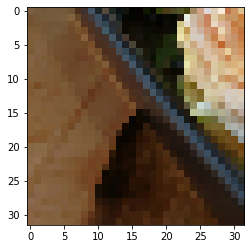

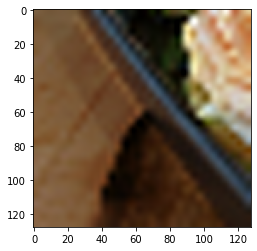

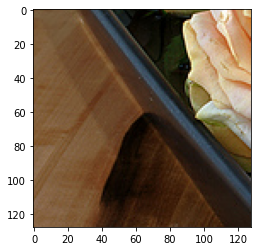

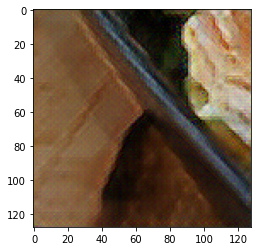

In [ ]:
train_dataset_mapped = train_data.map(build_data,num_parallel_calls=tf.data.AUTOTUNE)
for x in train_dataset_mapped.take(1):
  plt.figure()
  plt.imshow(x[0].numpy())
  plt.show()
  plt.imshow(bicubic_interpolate(x[0].numpy(),(128,128)))
  plt.show()
  plt.imshow(x[1].numpy())
  plt.show()

  pred=SRResnet(x[0].numpy().reshape(1,32,32,3))
  plt.imshow(pred[0])
  plt.show()

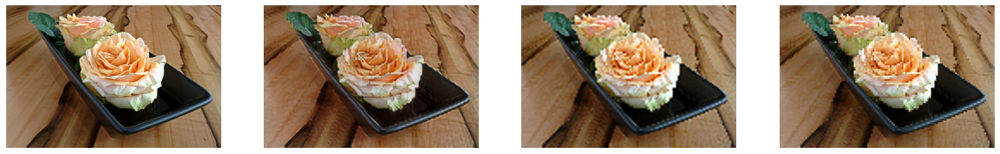

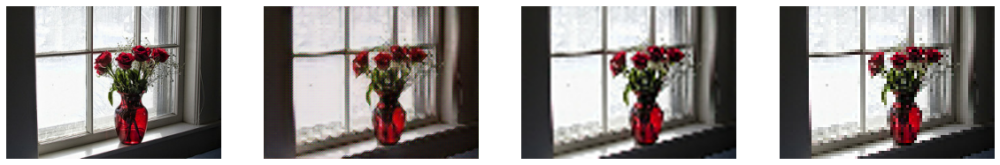

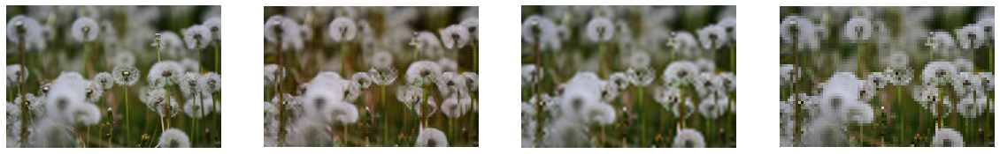

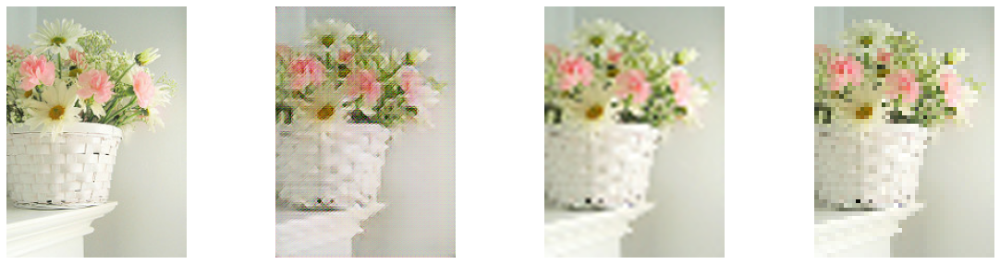

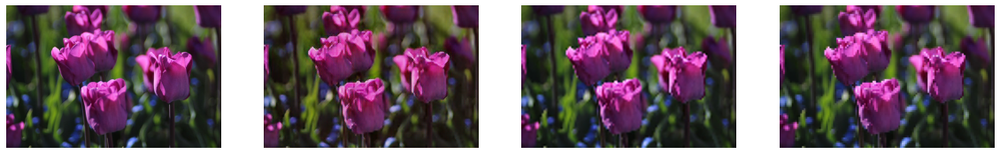

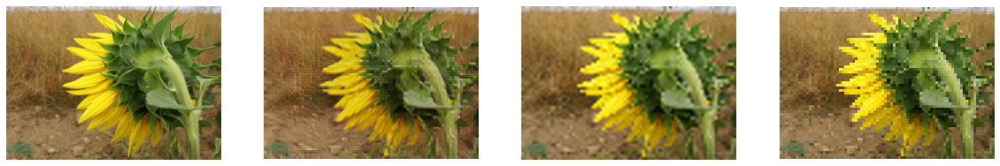

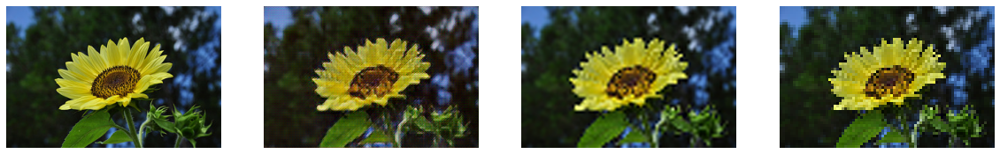

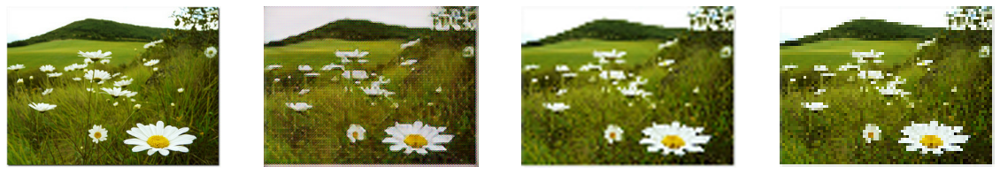

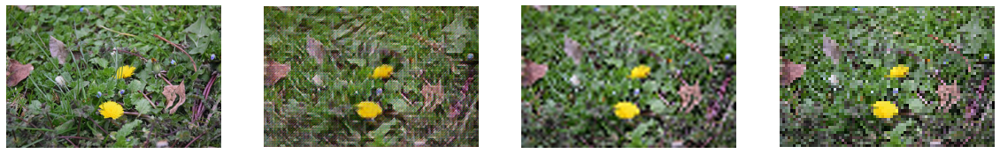

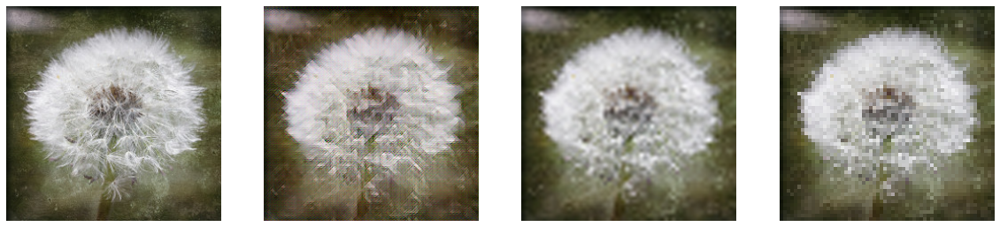

In [ ]:
train_dataset_mapped = train_data.map(build_data,num_parallel_calls=tf.data.AUTOTUNE)
for x in train_data.take(10):
  fig=plt.figure(figsize=(20,5))
  im=x['image'].numpy()
  plt.subplot(1,4,1)
  plt.imshow(im)
  plt.axis('off')

  plt.subplot(1,4,4)
  lr=bicubic_interpolate(im,(im.shape[1]//4,im.shape[0]//4))
  plt.imshow(lr)  
  plt.axis('off')

  plt.subplot(1,4,2)
  pred=SRResnet(np.array([lr])/255)
  plt.imshow(pred[0].numpy())
  plt.axis('off')

  plt.subplot(1,4,3)
  bic=bicubic_interpolate(lr,(im.shape[1],im.shape[0]))
  plt.imshow(bic)
  plt.axis('off')

  plt.show()
  #print(x['image'].numpy(),lr)
  #print('Bicubic PSNR:',PSNR(x['image'].numpy(),lr),'  SRCNN PSNR:',PSNR(x['image'].numpy(),pred[0].numpy()))

# ***IMPORTS***

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import requests
import tensorflow_datasets as tfds
import tqdm
import os
import shutil
import re
import cv2
import time
import logging

In [ ]:
!pip install tensorflow_addons
!git clone https://github.com/krasserm/super-resolution.git
cd /content/super-resolution
from google.colab import drive
drive.mount('/content/drive')
!tar -xf /content/drive/MyDrive/ML_project/weights-article-2.tar.gz
!tar -xf /content/drive/MyDrive/weights-srgan.tar.gz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 29.0 MB/s 


# NEW_RETRAIN

In [ ]:
import numpy as np
import tensorflow as tf

from tensorflow.keras.layers import Add, Conv2D, Input, Lambda
from tensorflow.keras.models import Model

DIV2K_RGB_MEAN = np.array([0.4488, 0.4371, 0.4040]) * 255


def edsr(scale, num_filters=64, num_res_blocks=8, res_block_scaling=None):
    """Creates an EDSR model."""
    x_in = Input(shape=(None, None, 3))
    x = Lambda(normalize)(x_in)

    x = b = Conv2D(num_filters, 3, padding='same')(x)
    for i in range(num_res_blocks):
        b = res_block(b, num_filters, res_block_scaling)
    b = Conv2D(num_filters, 3, padding='same')(b)
    x = Add()([x, b])

    x = upsample(x, scale, num_filters)
    x = Conv2D(3, 3, padding='same')(x)

    x = Lambda(denormalize)(x)
    return Model(x_in, x, name="edsr")


def res_block(x_in, filters, scaling):
    """Creates an EDSR residual block."""
    x = Conv2D(filters, 3, padding='same', activation='relu')(x_in)
    x = Conv2D(filters, 3, padding='same')(x)
    if scaling:
        x = Lambda(lambda t: t * scaling)(x)
    x = Add()([x_in, x])
    return x


def upsample(x, scale, num_filters):
    def upsample_1(x, factor, **kwargs):
        """Sub-pixel convolution."""
        x = Conv2D(num_filters * (factor ** 2), 3, padding='same', **kwargs)(x)
        return Lambda(pixel_shuffle(scale=factor))(x)

    if scale == 2:
        x = upsample_1(x, 2, name='conv2d_1_scale_2')
    elif scale == 3:
        x = upsample_1(x, 3, name='conv2d_1_scale_3')
    elif scale == 4:
        x = upsample_1(x, 2, name='conv2d_1_scale_2')
        x = upsample_1(x, 2, name='conv2d_2_scale_2')

    return x


def pixel_shuffle(scale):
    return lambda x: tf.nn.depth_to_space(x, scale)


def normalize(x):
    return (x - DIV2K_RGB_MEAN) / 127.5


def denormalize(x):
    return x * 127.5 + DIV2K_RGB_MEAN

In [ ]:
import os
import matplotlib.pyplot as plt

from model import resolve_single
from utils import load_image
from model.wdsr import wdsr_b

%matplotlib inline

def resolve_and_plot(model_pre_trained, model_fine_tuned, lr_image_path):
    lr = load_image(lr_image_path)
    
    sr_pt = resolve_single(model_pre_trained, lr)
    sr_ft = resolve_single(model_fine_tuned, lr)
    
    plt.figure(figsize=(20, 20))
    
    model_name = model_pre_trained.name.upper()
    images = [lr, sr_pt, sr_ft]
    titles = ['LR', f'SR ({model_name}, pixel loss)', f'SR ({model_name}, perceptual loss)']
    positions = [1, 3, 4]
    
    for i, (image, title, position) in enumerate(zip(images, titles, positions)):
        plt.subplot(2, 2, position)
        plt.imshow(image)
        plt.title(title)
        plt.xticks([])
        plt.yticks([])
        
weights_dir = 'weights/article'

In [ ]:
from model.wdsr import wdsr_b
model = wdsr_b(scale=4, num_res_blocks=32)
model.load_weights(os.path.join(weights_dir, 'weights-wdsr-b-32-x4.h5'))

In [ ]:
def plot_sample(lr, sr):
    

    images = [lr, sr]
    titles = ['LR', f'SR (x{sr.shape[0] // lr.shape[0]})']

    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(1, 2, i+1)
        plt.imshow(img)
        plt.title(title)
        plt.xticks([])
        plt.yticks([])


In [ ]:
from tensorflow.keras.layers import BatchNormalization
from model.srgan import generator

model = generator()
model.load_weights('weights/srgan/gan_generator.h5')




In [ ]:
#TESTING THE SRGAN 

import cv2
filename="cam"
image = cv2.imread("/content/drive/MyDrive/ML_project/imgs/"+ filename + ".jpg")

resized = cv2.resize(image, (256,256), interpolation=cv2.INTER_AREA)
cv2.imwrite("/content/drive/MyDrive/ML_project/256X256/"+filename+".png",resized)
lr = load_image('/content/drive/MyDrive/ML_project/256X256/' +filename + '.png')

sr = resolve_single(model, lr)

plot_sample(lr, sr)
sr=np.array(sr)
im_rgb = cv2.cvtColor(sr, cv2.COLOR_BGR2RGB)

cv2.imwrite("/content/drive/MyDrive/ML_project/upscaled/" +filename+".png",im_rgb)

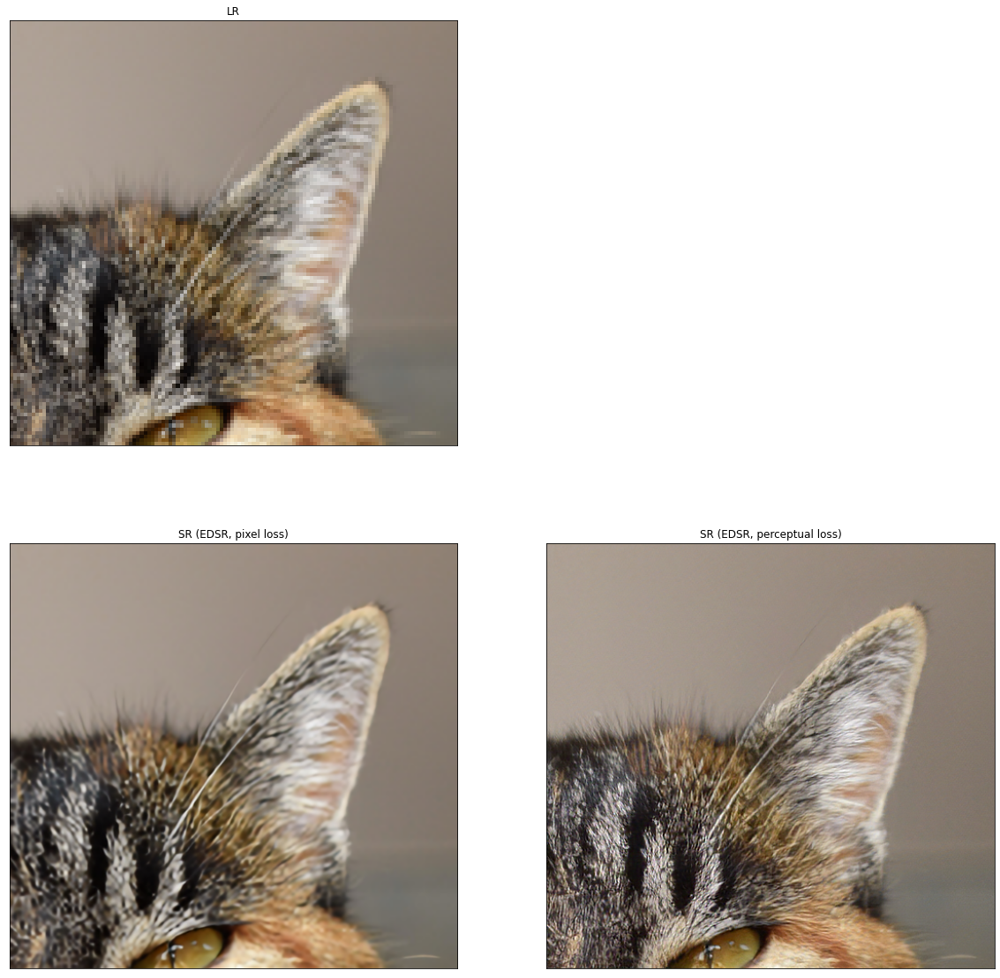

In [ ]:
edsr_pre_trained = edsr(scale=4, num_res_blocks=16)
edsr_pre_trained.load_weights(os.path.join(weights_dir, 'weights-edsr-16-x4.h5'))

edsr_fine_tuned = edsr(scale=4, num_res_blocks=16)
edsr_fine_tuned.load_weights(os.path.join(weights_dir, 'weights-edsr-16-x4-fine-tuned.h5'))

resolve_and_plot(edsr_pre_trained, edsr_fine_tuned, 'demo/0869x4-crop.png')

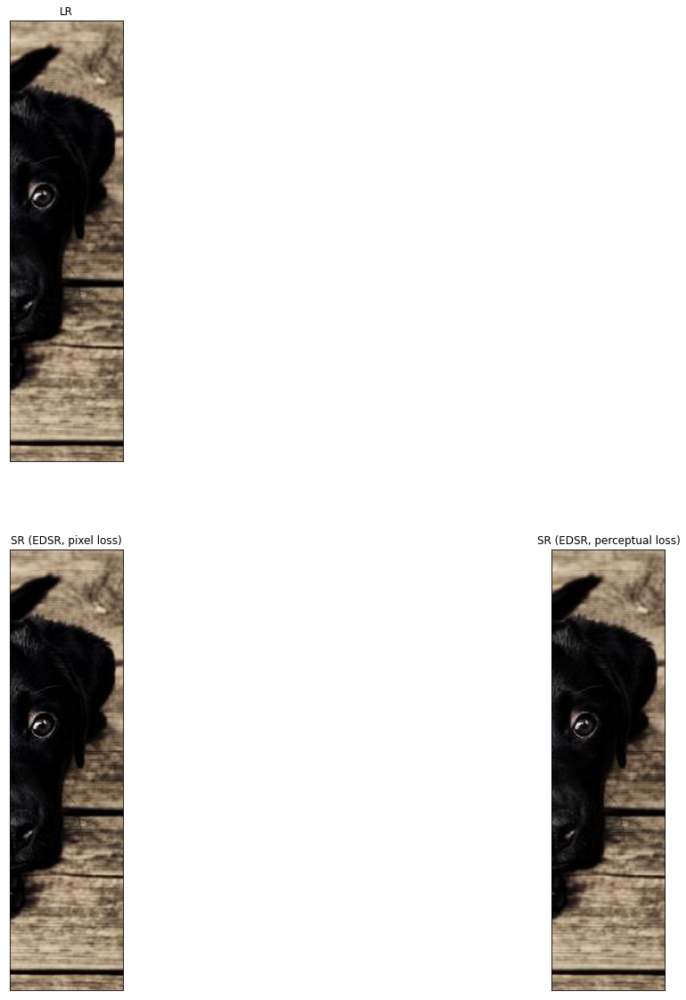

In [ ]:
resolve_and_plot(edsr_pre_trained, edsr_fine_tuned, '/content/vvhrj1.jpg')

In [ ]:
resolve_and_plot(edsr_pre_trained, edsr_fine_tuned, '/content/images - 2021-12-09T094519.118.jpg')

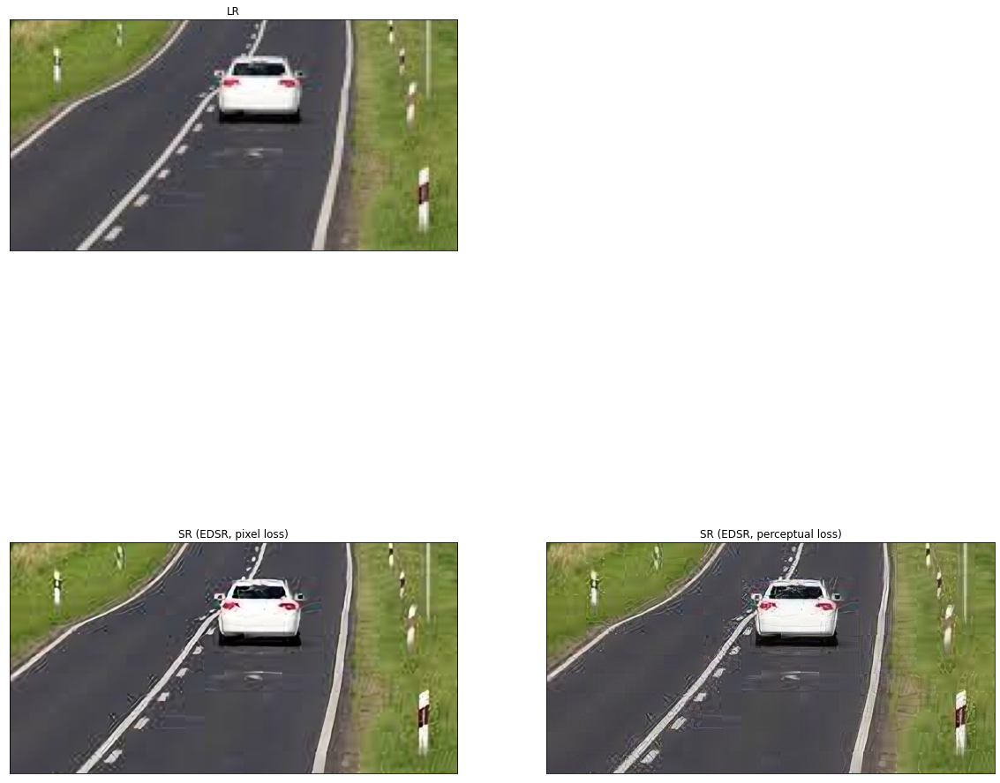

In [ ]:
resolve_and_plot(edsr_pre_trained, edsr_fine_tuned, '/content/car_road_1.jpg')

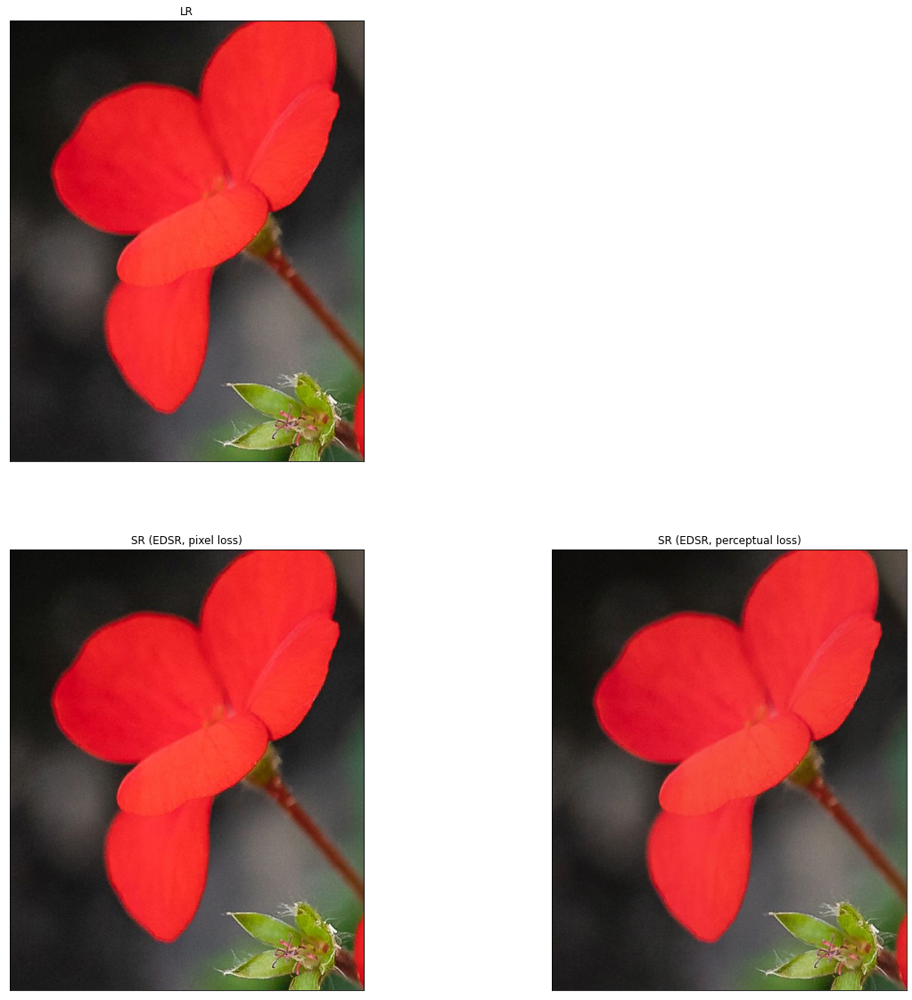

In [ ]:
resolve_and_plot(edsr_pre_trained, edsr_fine_tuned, '/content/plant_try_2.jpg')

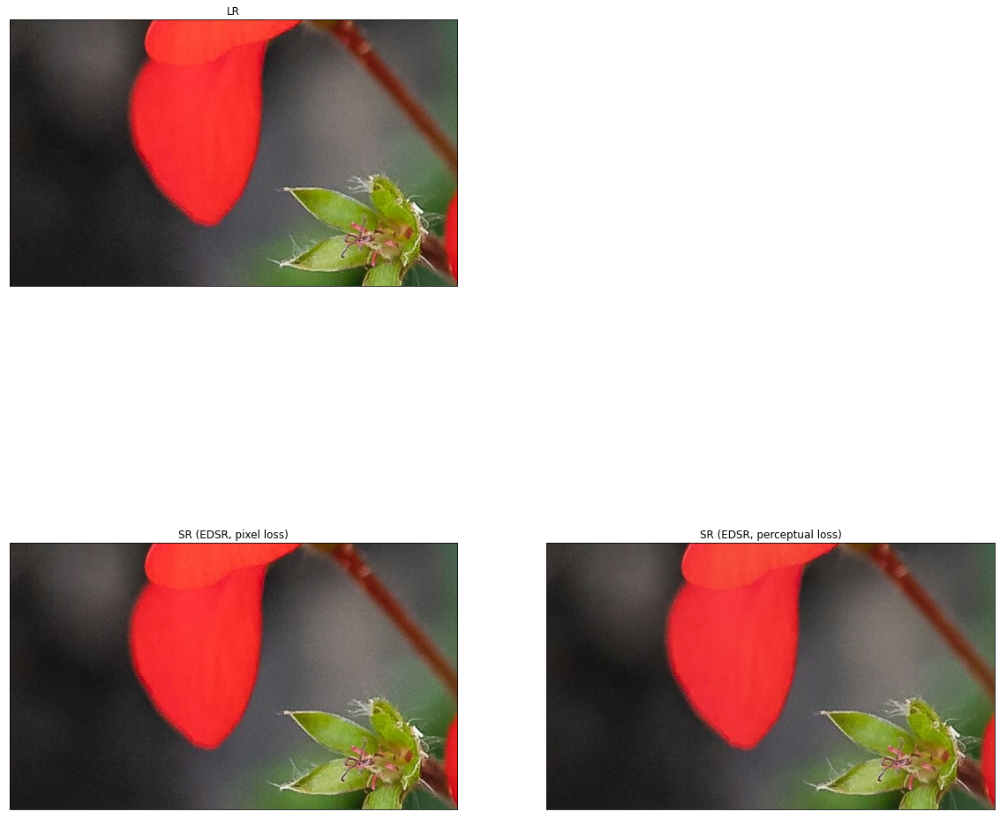

In [ ]:
resolve_and_plot(edsr_pre_trained, edsr_fine_tuned, '/content/plant_try_3.jpg')

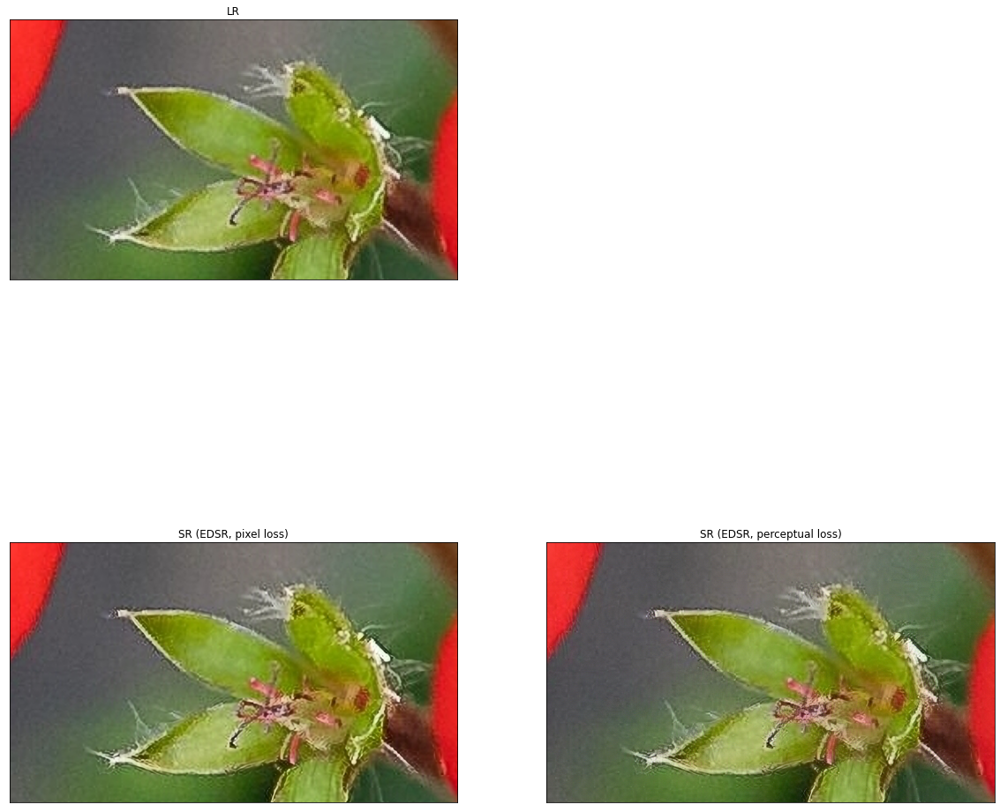

In [ ]:
resolve_and_plot(edsr_pre_trained, edsr_fine_tuned, '/content/plant_try_4.jpg')

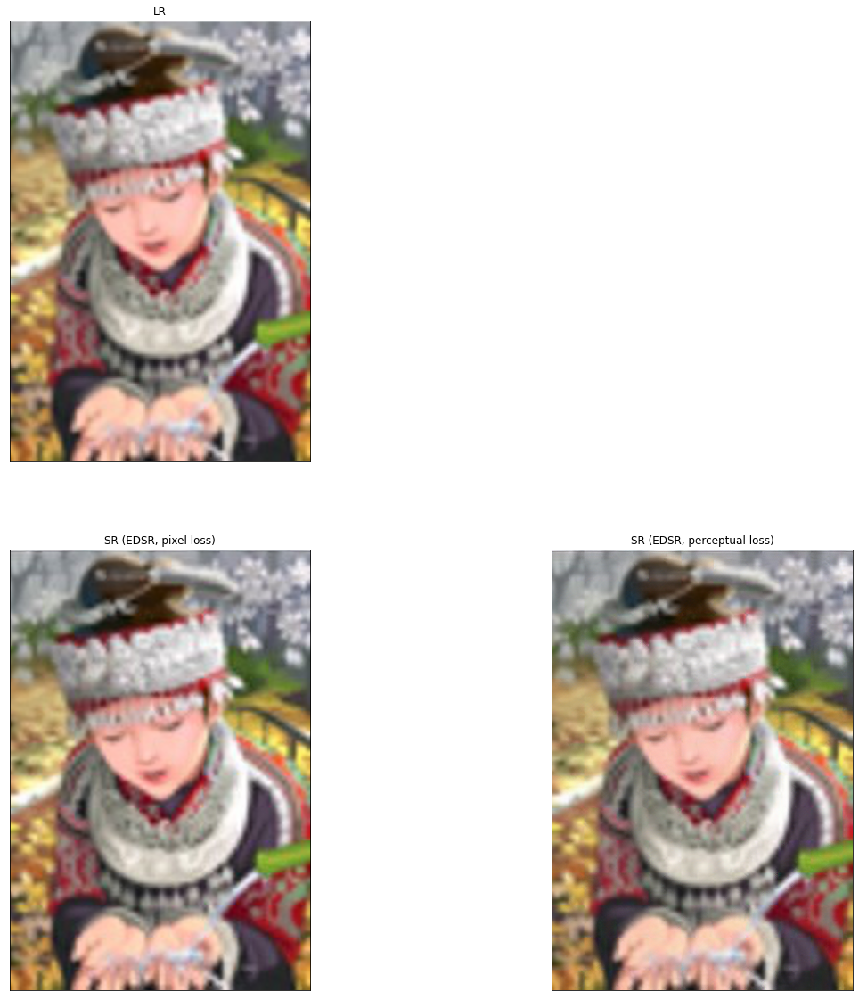

In [ ]:
resolve_and_plot(edsr_pre_trained, edsr_fine_tuned, '/content/og.jpg')

In [ ]:
import cv2
a = cv2.imread("/content/drive/MyDrive/ML_project/imgs/og_1.jpg")


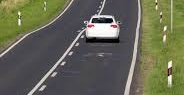

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(a)

In [ ]:
def noisy(image):
      row,col,ch= image.shape
      mean = 15
      var = 0.1
      sigma = var**0.5
      gauss = np.random.normal(mean,sigma,(row,col,ch))
      gauss = gauss.reshape(row,col,ch)
      noisy = image + gauss
      return noisy

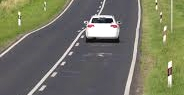

In [ ]:
ab = noisy(a)
cv2_imshow(ab)

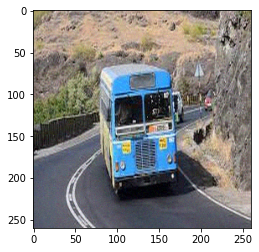

In [ ]:
import skimage
import matplotlib.pyplot as plt
import skimage.io
a = skimage.io.imread("/content/drive/MyDrive/ML_project/outdoor1_final_resized/0.png")/255.0
gimg = skimage.util.random_noise(a, mode="gaussian",var=0.0005)
skimage.io.imsave("/content/drive/MyDrive/ML_project/noise_images/5.png",gimg)
plt.imshow(gimg)

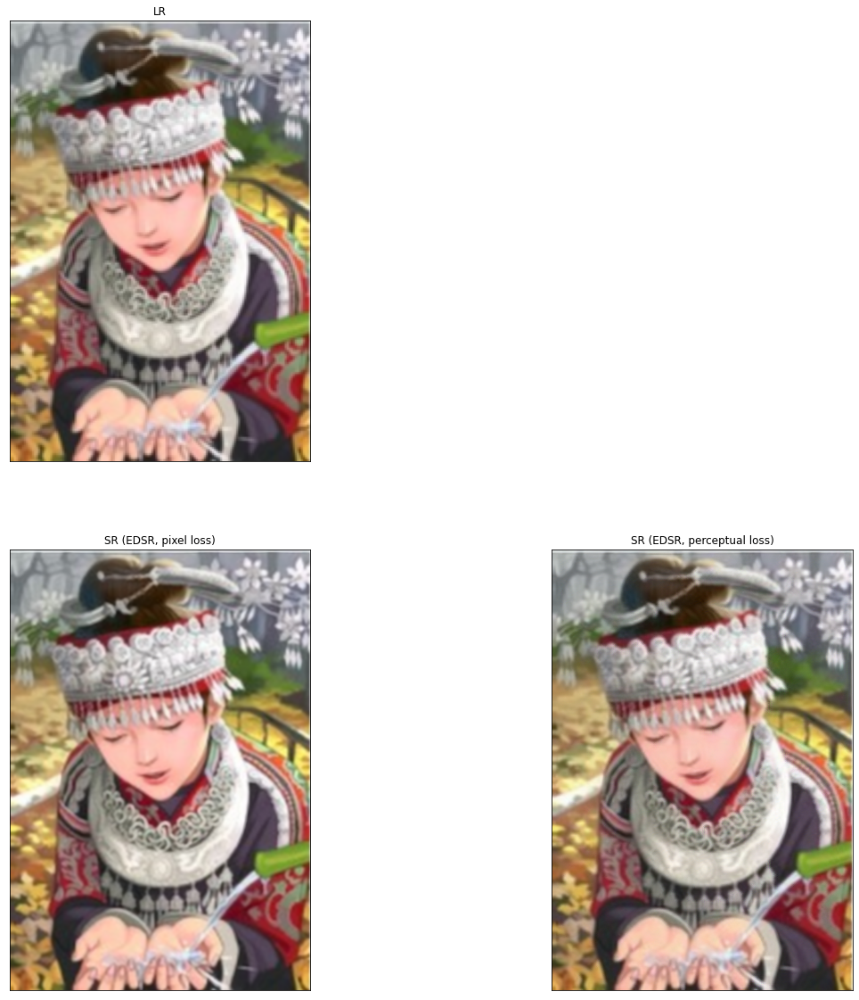

In [ ]:
resolve_and_plot(edsr_pre_trained, edsr_fine_tuned, '/content/drive/MyDrive/ML_project/noise_images/3.png')

In [ ]:
im1 = cv2.blur(a,(2,2))
cv2_imshow(im1)

In [ ]:
cv2.imwrite("/content/drive/MyDrive/ML_project/noise_images/3.png",im1)

True